Next steps

- look at hilbert - envelope detection (rectification with smoothing) - check
- set up training just like test sets - a period of time and then prediction of time to failure - check
- short time fft or filter bins - - check
- what about unequal time samples?  don't worry for now - not sure how to fix it in the test set.
- try linear first
- try 'slope' of increase in amplitude without outliers.  Then add outliers as energy.
- listen for creaks https://github.com/ammar1y/LANL-Earthquake-Prediction-Competition
- https://agupubs.onlinelibrary.wiley.com/doi/full/10.1002/2017GL074677 approach from paper is very localized and does not incorporate the trend.  what about a bayes model that takes a weighted average of predictions from past time periods to predict time to failure.
- use a nearest neighbors approach - take a test case and find the portion of the training set that is most similar. could use cross correlation.
- plot the signal (on Y) vs the time to failure (on X) to see the pattern.- check
- use a log scale on the sums due to peaks - check
- listen to the experiment sounds - check

Defining the learning problem - observations
- create 150,000 sample training samples with a moving window starting from each of the failures and moving back. - different approach used - I am dropping training samples if they cross an experiment boundary.
- use the last 2 experiments as the validation set, and create 150,000 sample validation samples from it.
- first experiment seems to be an outlier as it does not exhibit the ramping and has only 1.1 time to failure.
- maybe the acoustic data and the time to failure are not exactly aligned, since the large crash at the end of the sample does not line up with the end of the sample.  hard to detect the difference between sounds at the start of the sample and at the end.  Use classification?
- use a classification approach as there are not that many levels.

- make problem easier by predicting the relative ttf within each experiment to see what the lower limit prediction accuracy is.

- prediction of time since experiment started is a big factor.  provide this to the model to see what other variables are used.

X distribution
- look at the test data distribution and compare to the training data distributions to see if there are any differences

- only give the first t samples of each experiment, all the same.

features
- create the features using absolute value for different time periods before failure - did not really help
- used short term fft - seems to help - check

- identify prototypical pulses and use as a matched filter to generate features
- find more match filter features - take from a long experiment early and a short experiment early and end of experiment post crash to be able to detect these
- tweak the short term fft length
- look at the features not used at all
- use bandpass filters
- investigate 'skew' as it scores highly.  Is there other better features similar to it?  look at the time series that have high skew and those with low skew - stfft is better.

- use more folds (8) for xvalidation to get more data for modeling.
- deconvolution to model system
- crosscoherence space
- 


model
- regularized linear regression
- nearest neighbors, but using cross correlation as the distance measure
- embed some info about the pre vs post crash - use classification to detect
- physical model
    - init conditions:system stable,'pressure' is zero
    - gradually:'pressure' builds up over time and then a crash occurs exhibited by a spike
    - system changes,'presure' starts from 0 and repeats.  
    - At some point system 'disintegrates' due to a critical 'pressure' and is complete
    - disintrgrated system responds differently
- try to understand where the model fails based on training predictions.  Is it post crash or pre crash? - its at the extremes of time_to_failure
- come up with a different weighting of the models to maximize xv score overall?
- model types
    - LGBMRegressor
    
Submission
- submit 2 models - one with xval by experiment and the other with xval not taking into account the groups.
- Manually enter some data for the ones with a intermediate large quake




In [1]:
name_of_output="earthquake_13"
save_data=True

import os
if not os.path.exists(name_of_output):
    os.makedirs(name_of_output)

In [2]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.signal as sg

from tqdm import tqdm
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVR


from sklearn.metrics import mean_absolute_error
from sklearn.linear_model import LinearRegression, TheilSenRegressor
from sklearn import neighbors
from scipy import stats
from mpl_toolkits.mplot3d import Axes3D
import lightgbm as lgb
from sklearn.model_selection import KFold,GroupKFold
from scipy.signal import hann
from scipy.signal import hilbert
from scipy.signal import convolve
from scipy.signal import stft, find_peaks_cwt, find_peaks

from tsfresh.feature_extraction import feature_calculators



import pickle

import numba
from numba import jit

%matplotlib inline
#np.show_config()

In [3]:
from smtplib import SMTP_SSL as SMTP
from email.mime.text import MIMEText
import json

# change the below to your connection info in order to receive text messages from this notebook
# I recommend setting up a gmail account just for this purpose
send_txt_config= {'smtp_server':'smtp.gmail.com',
                  'smtp_login':'password here',
                  'from_addr':'from email address here',
                  'cel_to_addr':'cell phone company email-to-text address - see link below'}

#https://www.digitaltrends.com/mobile/how-to-send-a-text-from-your-email-account/


#uncomment the below and change path to save this connection info in a text file in home directory
#with open('/home/filip/python_send_txt_config.txt', 'w') as file:
#     file.write(json.dumps(send_txt_config)) 

#Reads in the connection info from a text file.
#Comment the below two lines if you are not storing the connection info in a text file
with open('/home/filip/python_send_txt_config.txt', 'r') as file:
    send_txt_config=json.load(file)

#Uncomment the below if you don't care about text messages
#send_txt_config = 0

def send_txt(subject, body, send_txt_config = send_txt_config):
    
    if(send_txt_config == 0):
        print("Text sending disabled since send_txt_config == 0")
    else:
        msg = MIMEText(body, 'plain')
        msg['To'] = send_txt_config['cel_to_addr']
        msg['Subject'] = subject

        server = SMTP(send_txt_config['smtp_server'])
        server.login(send_txt_config['from_addr'], send_txt_config['smtp_login'])
        server.sendmail(send_txt_config['from_addr'], send_txt_config['cel_to_addr'], msg.as_string())
        server.quit()


In [4]:
train = pd.read_csv('data/LANL-Earthquake-Prediction/train.csv',
                    dtype={'acoustic_data': np.int16, 'time_to_failure' : np.float64})
# pandas doesn't show us all the decimals
pd.options.display.precision = 15


In [5]:
# find places where the failure occurred in the training data set and label each experiment
train['experiment'] = np.cumsum((train['time_to_failure'].diff()>1.0)*1)
# get the indices where experiments start and stop
failure_index = np.flatnonzero(train['time_to_failure'].diff()>1.0)
failure_index = np.insert(failure_index,0,0.0)
failure_index = np.append(failure_index,len(train))
print(failure_index)

[        0   5656574  50085878 104677356 138772453 187641820 218652630
 245829585 307838917 338276287 375377848 419368880 461811623 495800225
 528777115 585568144 621985673 629145480]


In [6]:
matched_filter=pd.DataFrame(columns=['experiment', 'start', 'samples'],dtype=np.int32)

In [7]:
idd=['experiment', 'start', 'samples']
matched_filter=pd.DataFrame(columns=idd,dtype=np.int32)
matched_filter.loc[0, idd] = [8,10525,1000]
matched_filter.loc[1, idd] =[7,7676,1000]
matched_filter.loc[2, idd] =[7,12312,1000]
matched_filter.loc[3, idd] =[7,15888,1000]
matched_filter.loc[4, idd] =[7,19374,1000]
matched_filter.loc[5, idd] =[9,25773,1000]
matched_filter.loc[6, idd] =[8,33548,1000]
matched_filter.loc[7, idd] =[8,35150,1000]
matched_filter.loc[8, idd] =[7,36984,1200]
matched_filter.loc[9, idd] =[9,36989,1500]
matched_filter.loc[10, idd] =[8,39466,1400]
matched_filter.loc[11, idd] =[9,44187,2000]
matched_filter.loc[12, idd] =[7,47385,1000]
matched_filter.loc[13, idd] =[9,53380,1000]
matched_filter.loc[14, idd] =[7,60687,1700]
matched_filter.loc[15, idd] =[9,52512,2200]
matched_filter.loc[16, idd] =[9,74337,1700]
matched_filter.loc[17, idd] =[9,80337,2300]
matched_filter.loc[18, idd] =[8,83575,1500]
matched_filter.loc[19, idd] =[7,83698,1700]
matched_filter.loc[20, idd] =[7,93954,1500]
matched_filter.loc[21, idd] =[9,101370,1000]
matched_filter.loc[22, idd] =[8,109584,2000]
matched_filter.loc[23, idd] =[8,136478,2000]
matched_filter.loc[24, idd] =[9,137234,2000]
matched_filter.loc[25, idd] =[7,139427,2000]
matched_filter.loc[26, idd] =[8,60772018,2000]
matched_filter.loc[27, idd] =[8,60762112,2300]
matched_filter.loc[28, idd] =[8,60729627,1000]
matched_filter.loc[29, idd] =[8,60693598,3800]
matched_filter.loc[30, idd] =[8,58707232,3000]
matched_filter.loc[31, idd] =[9,30388179,3000]
matched_filter.loc[32, idd] =[9,29205016,2500]
matched_filter.loc[33, idd] =[8,29306515,3000]
matched_filter.loc[34, idd] =[9,27928037,14000]
matched_filter.loc[35, idd] =[7,27010416,1500]
matched_filter.loc[36, idd] =[9,27012770,1500]
matched_filter.loc[37, idd] =[8,27011199,1500]
matched_filter.loc[38, idd] =[7,25951843,1500]
matched_filter.loc[39, idd] =[8,25964864,1500]
matched_filter.loc[40, idd] =[9,25938854,1500]
matched_filter.loc[41, idd] =[7,14907479,1500]
matched_filter.loc[42, idd] =[9,14907289,1200]
matched_filter.loc[43, idd] =[8,14900674,1200]
matched_filter.loc[44, idd] =[8,7609764,1500]
matched_filter.loc[45, idd] =[7,7594680,1500]
matched_filter.loc[46, idd] =[9,7616159,1500]
matched_filter.loc[47, idd] =[8,40075303,1500]
matched_filter.loc[48, idd] =[8,40083144,2000]
matched_filter.loc[49, idd] =[8,40108996,1500]
matched_filter.loc[50, idd] =[5,32096,1200]
matched_filter.loc[51, idd] =[5,48430392,1200]





/home/filip/anaconda3/envs/cuda/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


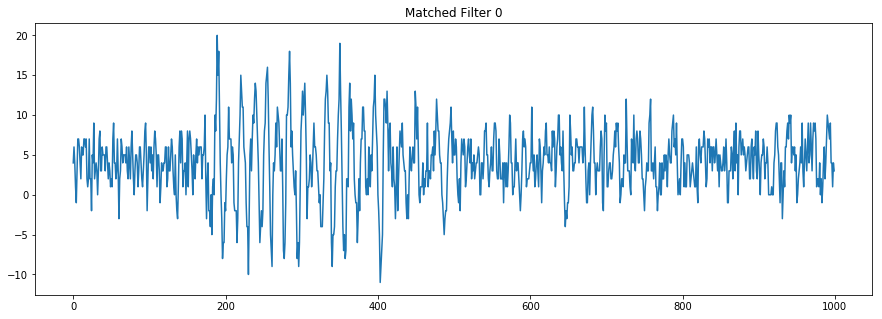

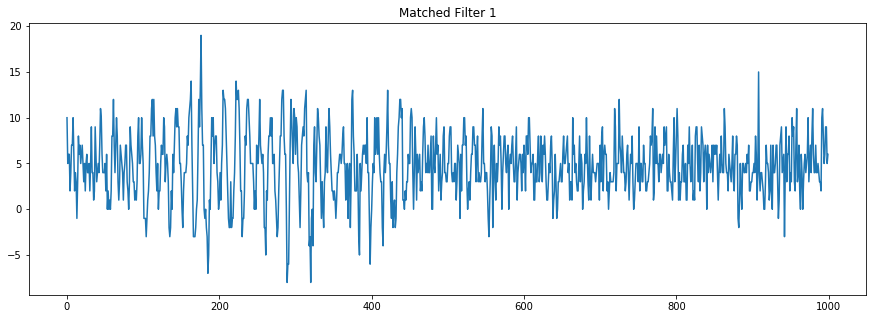

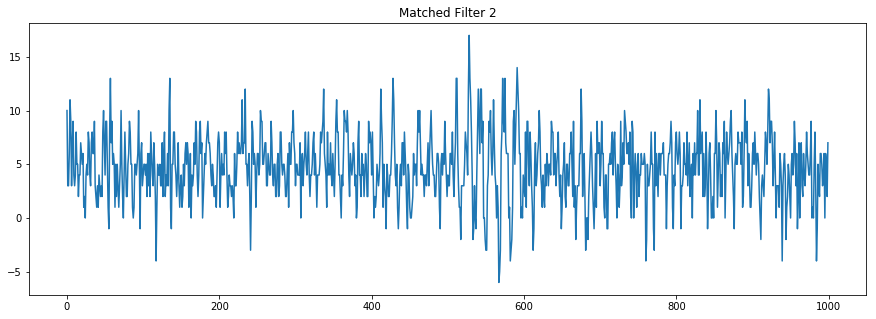

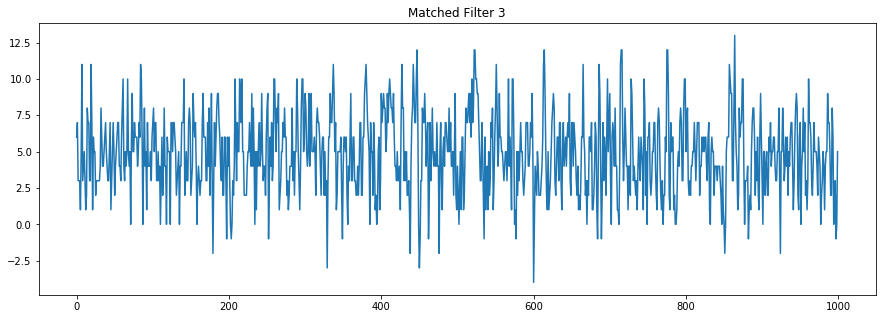

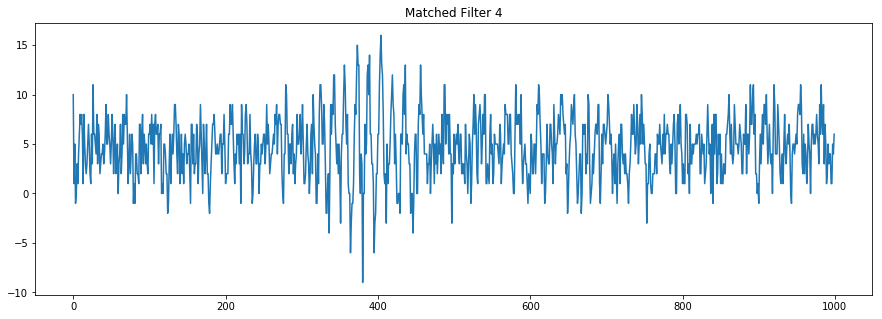

...

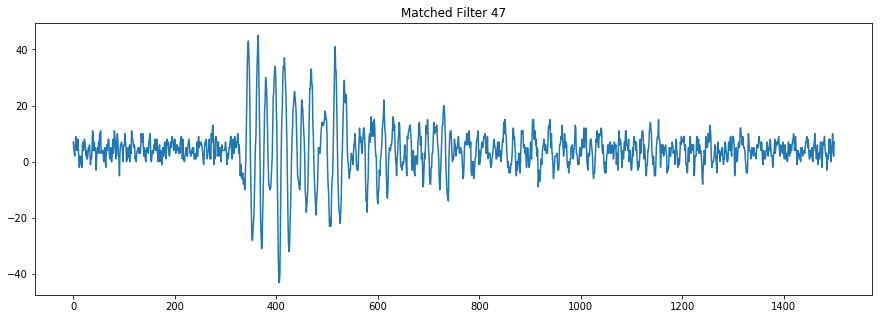

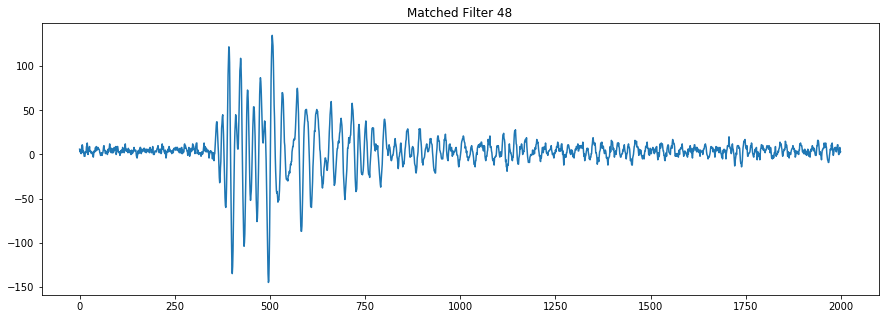

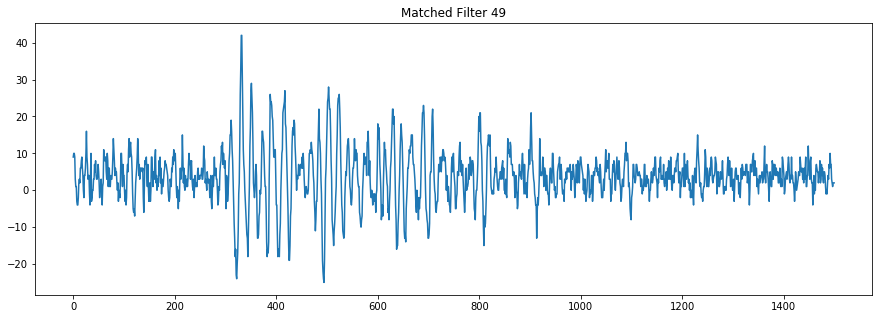

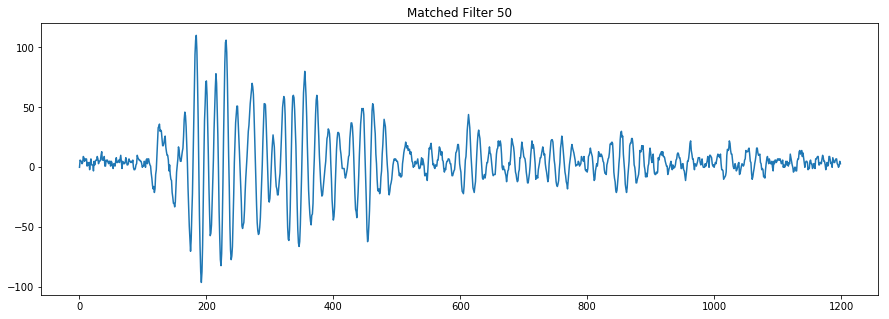

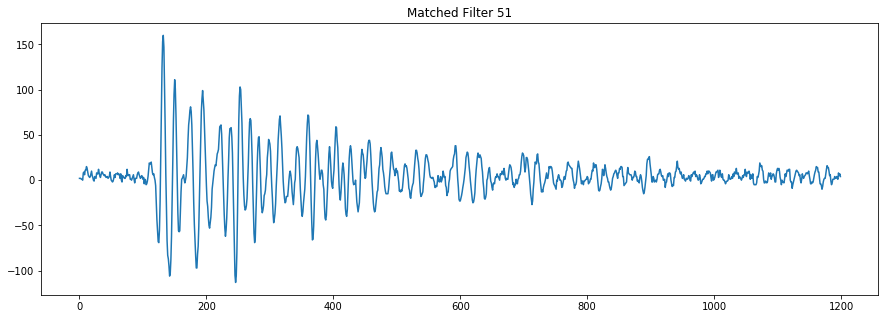

In [8]:
for mf in range(0,len(matched_filter)):
    exp, st, smp =matched_filter.loc[mf].astype(np.int32)
    fig, ax1 = plt.subplots(figsize=(15, 5))        
    plt.plot(train['acoustic_data'][failure_index[exp-1]+st:failure_index[exp-1]+st+smp].values.flatten())  
    plt.title(f'Matched Filter {mf}')
     

In [9]:
@jit(nopython=True, parallel = False, nogil = False)
def _roll(a, shift):

    #if not isinstance(a, np.ndarray):
    #    a = np.asarray(a)
    idx = shift % len(a)
    
    out1=np.empty_like(a)
    
    out1[:idx]=a[-idx:]
    out1[idx:]=a[:-idx]
    return out1  


@jit(nopython=True, parallel = False, nogil = False)
def number_peaks_fast(x, n):
    """
    Calculates the number of peaks of at least support n in the time series x. A peak of support n is defined as a
    subsequence of x where a value occurs, which is bigger than its n neighbours to the left and to the right.
    Hence in the sequence
    >>> x = [3, 0, 0, 4, 0, 0, 13]
    4 is a peak of support 1 and 2 because in the subsequences
    >>> [0, 4, 0]
    >>> [0, 0, 4, 0, 0]
    4 is still the highest value. Here, 4 is not a peak of support 3 because 13 is the 3th neighbour to the right of 4
    and its bigger than 4.
    :param x: the time series to calculate the feature of
    :type x: numpy.ndarray
    :param n: the support of the peak
    :type n: int
    :return: the value of this feature
    :return type: float
    """
    
    #from https://github.com/blue-yonder/tsfresh/blob/master/tsfresh/feature_extraction/feature_calculators.py
    
    
    
    
    
    x_reduced = x[n:-n]

    flg=False
    for i in range(1, n + 1):
        result_first = (x_reduced > _roll(x, i)[n:-n])

        if flg==False:
            res = result_first
            flg=True
        else:
            res &= result_first

        res &= (x_reduced > _roll(x, -i)[n:-n])
    return np.sum(res)



def add_trend_feature(arr, abs_values=False):
    idx = np.array(range(len(arr)))
    if abs_values:
        arr = np.abs(arr)
    lr = LinearRegression()
    lr.fit(idx.reshape(-1, 1), arr)
    return lr.coef_[0]

def classic_sta_lta(x, length_sta, length_lta):
    sta = np.cumsum(x ** 2)
    # Convert to float
    sta = np.require(sta, dtype=np.float)
    # Copy for LTA
    lta = sta.copy()
    # Compute the STA and the LTA
    sta[length_sta:] = sta[length_sta:] - sta[:-length_sta]
    sta /= length_sta
    lta[length_lta:] = lta[length_lta:] - lta[:-length_lta]
    lta /= length_lta
    # Pad zeros
    sta[:length_lta - 1] = 0
    # Avoid division by zero by setting zero values to tiny float
    dtiny = np.finfo(0.0).tiny
    idx = lta < dtiny
    lta[idx] = dtiny
    return sta / lta

@jit(nopython=True, parallel = False, nogil = False)
def normalize(v):
    norm = np.linalg.norm(v)
    if norm == 0: 
        return v
    return v / norm

#@jit(nopython=True, parallel = True, nogil = True)
def calc_change_rate(x):
    #change = (np.diff(x) / x[:-1]).values
    change = (np.diff(x) / x[:-1])
    change = change[np.nonzero(change)[0]]
    change = change[~np.isnan(change)]
    change = change[change != -np.inf]
    change = change[change != np.inf]
    return np.mean(change)

NY_FREQ_IDX=75000
def des_bw_filter_lp(cutoff=18000):  # low pass filter
    b, a = sg.butter(4, Wn=cutoff/NY_FREQ_IDX)
    return b, a

b500, a500 = des_bw_filter_lp(cutoff=500)

#@jit(nopython=False, parallel = False, nogil = False)
def my_hilbert(x):
    
    axis=-1
    
    x = np.asarray(x)
    
    N = x.shape[axis]
    if N <= 0:
        raise ValueError("N must be positive.")

    Xf = fftpack.fft(x, N, axis=axis)
    h = zeros(N)
    if N % 2 == 0:
        h[0] = h[N // 2] = 1
        h[1:N // 2] = 2
    else:
        h[0] = 1
        h[1:(N + 1) // 2] = 2

    if x.ndim > 1:
        ind = [newaxis] * x.ndim
        ind[axis] = slice(None)
        h = h[tuple(ind)]
    x = fftpack.ifft(Xf * h, axis=axis)
    return x




#@jit(nopython=False, parallel = False, nogil = False)
def adv_proc(filt,xc):
    xf = np.correlate(xc,filt,"same")
    x_env=np.abs(my_hilbert(xf))
    fm, tm, Zxxm = stft(xf,fs=4000000, nperseg=256)
    
    return (xf,x_env,fm,Zxxm)



In [10]:
#create a feature creator

mf_list= [0,9,10,14,16,32,34,50]


def create_features(seg_id, xc, X):
    #xc = pd.Series(seg['acoustic_data'].values)
    
        

    
    
    #matched filtering features
    for mf in mf_list:
        exp, st, smp =matched_filter.loc[mf].astype(np.int32)
        filt=normalize(1.0*train['acoustic_data'][failure_index[exp-1]+st:failure_index[exp-1]+st+smp].values.flatten())
        
        xf = np.correlate(xc,filt,"same")
        
        x_env=np.abs(hilbert(xf))
        fm, tm, Zxxm = stft(xf,fs=4000000, nperseg=256)
        #xf, x_env, fm, Zxxm = adv_proc(filt,xc)
        
        X.loc[seg_id, f'fm_{mf}_x_skew'] = pd.Series(xf).skew()
        
        for peak in [2,5,10,15,20]:
            X.loc[seg_id, f'fm_{mf}_x_peaks{peak}'] = number_peaks_fast(xf, peak)
            X.loc[seg_id, f'fm_{mf}_env_peaks{peak}'] = number_peaks_fast(x_env, peak)
     
        for freq in [15625, 31250, 46875, 109375, 156250, 171875, 234375, 250000, 390625 ]: 
            X.loc[seg_id, f'fm_{mf}_sum_stft_f_{freq}'] = np.abs(Zxxm)[fm==freq].sum()
            #X.loc[seg_id, f'fm_{mf}_sum_stft_f_{freq}'] = np.abs(Zxxm)[fm==freq].max()
            X.loc[seg_id, f'fm_{mf}_lsum_stft_f_{freq}'] = np.log10(np.abs(Zxxm)[fm==freq].sum())    
            
        for freq in [15625, 31250, 46875, 109375, 156250, 171875, 234375, 250000, 265625, 312500, 390625]:     
            for peak in [2,5]:
                X.loc[seg_id, f'fm_{mf}_stft_peaks{peak}_f_{freq}'] = number_peaks_fast(np.abs(Zxxm)[fm==freq].flatten(), peak)
        

    f, t, Zxx = stft(xc,fs=4000000, nperseg=256) 
    
    
    
        #X.loc[seg_id, 'mabs'] = 1.0/np.abs(xc-xm).mean()
    
    for freq in [15625, 31250, 46875, 234375, 250000, 437500, 468750, 484375, 500000]:
        #X.loc[seg_id, 'max_stft_' + str(freq)] = np.abs(Zxx)[f==freq].max()
        X.loc[seg_id, 'sum_stft_' + str(freq)] = np.abs(Zxx)[f==freq].sum()
        X.loc[seg_id, 'lsum_stft_' + str(freq)] = np.log10(np.abs(Zxx)[f==freq].sum())
        #X.loc[seg_id, 'std_stft_' + str(freq)] = np.abs(Zxx)[f==freq].std()
        #X.loc[seg_id, 'skew_stft_' + str(freq)] =stats.skew(np.abs(Zxx)[f==freq].flatten())
        
    for freq in [15625, 31250, 46875, 234375, 250000, 265625, 437500, 468750, 484375, 500000]:
        for peak in [2,5]:
            X.loc[seg_id, f'stft_peaks{peak}_f_{freq}'] = number_peaks_fast(np.abs(Zxx)[f==freq].flatten(), peak)
 


    for prom in [2]:
        for dis in [100]:
            peaks, props = find_peaks(np.abs(xc), height = 0, distance = dis, width = 10, prominence = prom) 
            X.loc[seg_id, 'peakmean_' + str(prom) +"_"+str(dis)]= np.mean(peaks)


    #get the baseline low value using hilbert transform to get envelope
    env = np.abs(hilbert(xc))
    xcz = sg.lfilter(b500, a500, env)
    X.loc[seg_id, f'env_baseline'] = np.percentile(xcz, 10)
    for peak in [2,5,10,15,20]:
            X.loc[seg_id, f'env_peak{peak}'] = number_peaks_fast(env, peak)
            X.loc[seg_id, f'envs_peak{peak}'] = number_peaks_fast(xcz, peak)


    #from other example kernel - worth a try 
    X.loc[seg_id, 'mean_change_rate'] = calc_change_rate(xc)
    
    for peak in [20]:
        X.loc[seg_id, f'num_peaks_{peak}'] = number_peaks_fast(xc, peak)
    
    

    X.loc[seg_id, 'mean'] = xc.mean()
    X.loc[seg_id, 'std'] = xc.std()
    X.loc[seg_id, 'max'] = xc.max()
    X.loc[seg_id, 'min'] = xc.min()
    X.loc[seg_id, 'abs_med'] = np.median(np.abs(xc))
    
    #X.loc[seg_id, 'mean_f1'] = xf1.mean()
    #X.loc[seg_id, 'std_f1'] = xf1.std()
    #X.loc[seg_id, 'max_f1'] = xf1.max()
    #X.loc[seg_id, 'min_f1'] = xf1.min()
    #X.loc[seg_id, 'skew_f1'] = pd.Series(xf1).skew()
    
    #X.loc[seg_id, 'mean_f2'] = xf2.mean()
    #X.loc[seg_id, 'std_f2'] = xf2.std()
    #X.loc[seg_id, 'max_f2'] = xf2.max()
    #X.loc[seg_id, 'min_f2'] = xf2.min()
    #X.loc[seg_id, 'skew_f2'] = pd.Series(xf2).skew()
    
    #FFT transform values
    #realFFT = np.real(zc)
    #imagFFT = np.imag(zc)
    #X.loc[seg_id, 'Rmean'] = realFFT.mean()
    #X.loc[seg_id, 'Rstd'] = realFFT.std()
    #X.loc[seg_id, 'Rmax'] = realFFT.max()
    #X.loc[seg_id, 'Rmin'] = realFFT.min()
    #X.loc[seg_id, 'Imean'] = imagFFT.mean()
    #X.loc[seg_id, 'Istd'] = imagFFT.std()
    #X.loc[seg_id, 'Imax'] = imagFFT.max()
    #X.loc[seg_id, 'Imin'] = imagFFT.min()
    #X.loc[seg_id, 'Rmean_last_5000'] = realFFT[-5000:].mean()
    #X.loc[seg_id, 'Rstd__last_5000'] = realFFT[-5000:].std()
    #X.loc[seg_id, 'Rmax_last_5000'] = realFFT[-5000:].max()
    #X.loc[seg_id, 'Rmin_last_5000'] = realFFT[-5000:].min()
    #X.loc[seg_id, 'Rmean_last_15000'] = realFFT[-15000:].mean()
    #X.loc[seg_id, 'Rstd_last_15000'] = realFFT[-15000:].std()
    #X.loc[seg_id, 'Rmax_last_15000'] = realFFT[-15000:].max()
    #X.loc[seg_id, 'Rmin_last_15000'] = realFFT[-15000:].min()
    
    #X.loc[seg_id, 'mean_change_abs'] = np.mean(np.diff(xc))
    X.loc[seg_id, 'mean_change_rate'] = np.mean(np.nonzero((np.diff(xc) / xc[:-1]))[0])
    #X.loc[seg_id, 'abs_max'] = np.abs(xc).max()
    #X.loc[seg_id, 'abs_min'] = np.abs(xc).min()
    
    #X.loc[seg_id, 'std_first_50000'] = xc[:50000].std()
    #X.loc[seg_id, 'std_last_50000'] = xc[-50000:].std()
    #X.loc[seg_id, 'std_first_10000'] = xc[:10000].std()
    #X.loc[seg_id, 'std_last_10000'] = xc[-10000:].std()
    
    #X.loc[seg_id, 'avg_first_50000'] = xc[:50000].mean()
    #X.loc[seg_id, 'avg_last_50000'] = xc[-50000:].mean()
    #X.loc[seg_id, 'avg_first_10000'] = xc[:10000].mean()
    #X.loc[seg_id, 'avg_last_10000'] = xc[-10000:].mean()
    
    #X.loc[seg_id, 'min_first_50000'] = xc[:50000].min()
    #X.loc[seg_id, 'min_last_50000'] = xc[-50000:].min()
    #X.loc[seg_id, 'min_first_10000'] = xc[:10000].min()
    #X.loc[seg_id, 'min_last_10000'] = xc[-10000:].min()
    
    #X.loc[seg_id, 'max_first_50000'] = xc[:50000].max()
    #X.loc[seg_id, 'max_last_50000'] = xc[-50000:].max()
    #X.loc[seg_id, 'max_first_10000'] = xc[:10000].max()
    #X.loc[seg_id, 'max_last_10000'] = xc[-10000:].max()
    
    #X.loc[seg_id, 'max_to_min'] = xc.max() / np.abs(xc.min())
    #X.loc[seg_id, 'max_to_min_diff'] = xc.max() - np.abs(xc.min())
    #X.loc[seg_id, 'count_big'] = len(xc[np.abs(xc) > 500])
    #X.loc[seg_id, 'sum'] = xc.sum()
    
    #X.loc[seg_id, 'mean_change_rate_first_50000'] = np.mean(np.nonzero((np.diff(xc[:50000]) / xc[:50000][:-1]))[0])
    #X.loc[seg_id, 'mean_change_rate_last_50000'] = np.mean(np.nonzero((np.diff(xc[-50000:]) / xc[-50000:][:-1]))[0])
    #X.loc[seg_id, 'mean_change_rate_first_10000'] = np.mean(np.nonzero((np.diff(xc[:10000]) / xc[:10000][:-1]))[0])
    #X.loc[seg_id, 'mean_change_rate_last_10000'] = np.mean(np.nonzero((np.diff(xc[-10000:]) / xc[-10000:][:-1]))[0])
    
    #X.loc[seg_id, 'q95'] = np.quantile(xc, 0.95)
    #X.loc[seg_id, 'q99'] = np.quantile(xc, 0.99)
    #X.loc[seg_id, 'q05'] = np.quantile(xc, 0.05)
    #X.loc[seg_id, 'q01'] = np.quantile(xc, 0.01)
    
    #X.loc[seg_id, 'abs_q95'] = np.quantile(np.abs(xc), 0.95)
    #X.loc[seg_id, 'abs_q99'] = np.quantile(np.abs(xc), 0.99)
    #X.loc[seg_id, 'abs_q05'] = np.quantile(np.abs(xc), 0.05)
    #X.loc[seg_id, 'abs_q01'] = np.quantile(np.abs(xc), 0.01)
    
    #X.loc[seg_id, 'trend'] = add_trend_feature(xc)
    #X.loc[seg_id, 'abs_trend'] = add_trend_feature(xc, abs_values=True)
    #X.loc[seg_id, 'abs_mean'] = np.abs(xc).mean()
    #X.loc[seg_id, 'abs_std'] = np.abs(xc).std()
    
    #X.loc[seg_id, 'mad'] = xc.mad()
    #X.loc[seg_id, 'kurt'] = xc.kurtosis()
    X.loc[seg_id, 'skew'] = pd.Series(xc).skew()
    #X.loc[seg_id, 'med'] = xc.median()
    
    #X.loc[seg_id, 'Hilbert_mean'] = np.abs(hilbert(xc)).mean()
    #X.loc[seg_id, 'Hann_window_mean'] = (convolve(xc, hann(150), mode='same') / sum(hann(150))).mean()
    #X.loc[seg_id, 'classic_sta_lta1_mean'] = classic_sta_lta(xc, 500, 10000).mean()
    #X.loc[seg_id, 'classic_sta_lta2_mean'] = classic_sta_lta(xc, 5000, 100000).mean()
    #X.loc[seg_id, 'classic_sta_lta3_mean'] = classic_sta_lta(xc, 3333, 6666).mean()
    #X.loc[seg_id, 'classic_sta_lta4_mean'] = classic_sta_lta(xc, 10000, 25000).mean()
    #X.loc[seg_id, 'Moving_average_700_mean'] = xc.rolling(window=700).mean().mean(skipna=True)
    #X.loc[seg_id, 'Moving_average_1500_mean'] = xc.rolling(window=1500).mean().mean(skipna=True)
    #X.loc[seg_id, 'Moving_average_3000_mean'] = xc.rolling(window=3000).mean().mean(skipna=True)
    #X.loc[seg_id, 'Moving_average_6000_mean'] = xc.rolling(window=6000).mean().mean(skipna=True)
    #ewma = pd.Series.ewm
    #X.loc[seg_id, 'exp_Moving_average_300_mean'] = (ewma(xc, span=300).mean()).mean(skipna=True)
    #X.loc[seg_id, 'exp_Moving_average_3000_mean'] = ewma(xc, span=3000).mean().mean(skipna=True)
    #X.loc[seg_id, 'exp_Moving_average_30000_mean'] = ewma(xc, span=6000).mean().mean(skipna=True)
    #no_of_std = 2
    #X.loc[seg_id, 'MA_700MA_std_mean'] = xc.rolling(window=700).std().mean()
    #X.loc[seg_id,'MA_700MA_BB_high_mean'] = (X.loc[seg_id, 'Moving_average_700_mean'] + no_of_std * X.loc[seg_id, 'MA_700MA_std_mean']).mean()
    #X.loc[seg_id,'MA_700MA_BB_low_mean'] = (X.loc[seg_id, 'Moving_average_700_mean'] - no_of_std * X.loc[seg_id, 'MA_700MA_std_mean']).mean()
    #X.loc[seg_id, 'MA_400MA_std_mean'] = xc.rolling(window=400).std().mean()
    #X.loc[seg_id,'MA_400MA_BB_high_mean'] = (X.loc[seg_id, 'Moving_average_700_mean'] + no_of_std * X.loc[seg_id, 'MA_400MA_std_mean']).mean()
    #X.loc[seg_id,'MA_400MA_BB_low_mean'] = (X.loc[seg_id, 'Moving_average_700_mean'] - no_of_std * X.loc[seg_id, 'MA_400MA_std_mean']).mean()
    #X.loc[seg_id, 'MA_1000MA_std_mean'] = xc.rolling(window=1000).std().mean()
    
    #X.loc[seg_id, 'iqr'] = np.subtract(*np.percentile(xc, [75, 25]))
    #X.loc[seg_id, 'q999'] = np.quantile(xc,0.999)
    #X.loc[seg_id, 'q001'] = np.quantile(xc,0.001)
    #X.loc[seg_id, 'ave10'] = stats.trim_mean(xc, 0.1)
    
    #for windows in [50, 75, 100, 150, 200]:
        #x_roll_std = xc.rolling(windows).std().dropna().values
        #x_roll_mean = xc.rolling(windows).mean().dropna().values
        
        #X.loc[seg_id, 'ave_roll_std_' + str(windows)] = x_roll_std.mean()
        #X.loc[seg_id, 'std_roll_std_' + str(windows)] = x_roll_std.std()
        #X.loc[seg_id, 'max_roll_std_' + str(windows)] = x_roll_std.max()
        #X.loc[seg_id, 'min_roll_std_' + str(windows)] = x_roll_std.min()
        #X.loc[seg_id, 'q01_roll_std_' + str(windows)] = np.quantile(x_roll_std, 0.01)
        #X.loc[seg_id, 'q05_roll_std_' + str(windows)] = np.quantile(x_roll_std, 0.05)
        #X.loc[seg_id, 'q95_roll_std_' + str(windows)] = np.quantile(x_roll_std, 0.95)
        #X.loc[seg_id, 'q99_roll_std_' + str(windows)] = np.quantile(x_roll_std, 0.99)
        #X.loc[seg_id, 'av_change_abs_roll_std_' + str(windows)] = np.mean(np.diff(x_roll_std))
        #X.loc[seg_id, 'av_change_rate_roll_std_' + str(windows)] = np.mean(np.nonzero((np.diff(x_roll_std) / x_roll_std[:-1]))[0])
        #X.loc[seg_id, 'abs_max_roll_std_' + str(windows)] = np.abs(x_roll_std).max()
        
        #X.loc[seg_id, 'ave_roll_mean_' + str(windows)] = x_roll_mean.mean()
        #X.loc[seg_id, 'std_roll_mean_' + str(windows)] = x_roll_mean.std()
        #X.loc[seg_id, 'max_roll_mean_' + str(windows)] = x_roll_mean.max()
        #X.loc[seg_id, 'min_roll_mean_' + str(windows)] = x_roll_mean.min()
        #X.loc[seg_id, 'q01_roll_mean_' + str(windows)] = np.quantile(x_roll_mean, 0.01)
        #X.loc[seg_id, 'q05_roll_mean_' + str(windows)] = np.quantile(x_roll_mean, 0.05)
        #X.loc[seg_id, 'q95_roll_mean_' + str(windows)] = np.quantile(x_roll_mean, 0.95)
        #X.loc[seg_id, 'q99_roll_mean_' + str(windows)] = np.quantile(x_roll_mean, 0.99)
        #X.loc[seg_id, 'av_change_abs_roll_mean_' + str(windows)] = np.mean(np.diff(x_roll_mean))
        #X.loc[seg_id, 'av_change_rate_roll_mean_' + str(windows)] = np.mean(np.nonzero((np.diff(x_roll_mean) / x_roll_mean[:-1]))[0])
        #X.loc[seg_id, 'abs_max_roll_mean_' + str(windows)] = np.abs(x_roll_mean).max()


def create_features_test(seg_id, seg, X):
    xc =  seg['acoustic_data'].astype(np.float32).values
    X.loc[seg_id, 'mean'] = xc.mean()
    X.loc[seg_id, 'std'] = xc.std()
    X.loc[seg_id, 'max'] = xc.max()
    X.loc[seg_id, 'min'] = xc.min()
    X.loc[seg_id, 'abs_med'] = np.median(np.abs(xc))     

In [11]:
# Create a training file with simple derived features by iterating
# exclude training data points where the experiment changes in the middle

rows = 150000
step = 30000

#ignore the first experiment
start = failure_index[1] 

def is_overlap_matched_filter(raw_seg_id):
    res = False
    for mf in mf_list:
        exp, st, smp =matched_filter.loc[mf].astype(np.int32)
        fil_start = failure_index[exp-1]+st
        fil_end = failure_index[exp-1]+st+smp
        #print(raw_seg_id, fil_start, fil_end)
        res = res or (((fil_start>=raw_seg_id) and (fil_start<=raw_seg_id+rows-1)) or
            ((fil_end>=raw_seg_id) and (fil_end<=raw_seg_id+rows-1)))
        
    return res

segments = 10
segments = int(np.floor((train.shape[0]-rows-start) / step))+1
seg_list=[]

#train_X = pd.DataFrame(index=range(segments), dtype=np.float64)
#train_y = pd.DataFrame(index=range(segments), dtype=np.float64, columns=['time_to_failure'])
#train_exp = pd.DataFrame(index=range(segments), columns=['experiment'])

#check size of dataframe required and remove any samples that should not be added
# samples that cross quake boundaries
# samples that are used for matched filtering examples

print("check size of dataframes required")
seg_id=0
for raw_seg_id in range(start,train.shape[0]-rows+1,step):
    if((train['experiment'].iloc[raw_seg_id]==train['experiment'].iloc[raw_seg_id+rows]) and
        not is_overlap_matched_filter(raw_seg_id)):
        seg_list.append(raw_seg_id)
        seg_id=seg_id+1
                        
                        

train_X = pd.DataFrame(index=range(seg_id-1), dtype=np.float64)
train_y = pd.DataFrame(index=range(seg_id-1), dtype=np.float64, columns=['time_to_failure'])
train_exp = pd.DataFrame(index=range(seg_id-1), columns=['experiment'])
#train_sample = pd.DataFrame (index=range(seg_id-1), columns=['sample'])

seg_id=0

print("preprocess")

for raw_seg_id in tqdm(seg_list):
    
    
    seg = train.iloc[raw_seg_id:raw_seg_id+rows]
    
    #print("Seg=", seg_id, " start=", seg_id*step, " end=", seg_id*step+rows)
    #print("Exp number: start=", seg['experiment'].values[0], " end", seg['experiment'].values[-1])
    create_features(seg_id, seg['acoustic_data'].astype(np.float32).values, train_X)
    #train_sample.loc[seg_id, 'sample'] = raw_seg_id
    train_exp.loc[seg_id, 'experiment'] = seg['experiment'].values[-1]
    train_y.loc[seg_id, 'time_to_failure'] = seg['time_to_failure'].values[-1]
    seg_id=seg_id+1


#train_X.drop(train_X.index[seg_id:segments]) 
#train_y.drop(train_y.index[seg_id:segments]) 
#train_exp.drop(train_exp.index[seg_id:segments]) 
print("Initial Segments",segments, " Excluded Segments=",segments-seg_id, "Remaining data samples=",seg_id )
send_txt('features created','remaining samples='+str(seg_id))


check size of dataframes required


  0%|          | 0/20684 [00:00<?, ?it/s]

preprocess


/home/filip/anaconda3/envs/cuda/lib/python3.6/site-packages/numpy/core/fromnumeric.py:2909: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/filip/anaconda3/envs/cuda/lib/python3.6/site-packages/numpy/core/_methods.py:80: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/home/filip/anaconda3/envs/cuda/lib/python3.6/site-packages/ipykernel_launcher.py:95: RuntimeWarning: divide by zero encountered in true_divide
/home/filip/anaconda3/envs/cuda/lib/python3.6/site-packages/ipykernel_launcher.py:95: RuntimeWarning: invalid value encountered in true_divide
/home/filip/anaconda3/envs/cuda/lib/python3.6/site-packages/ipykernel_launcher.py:121: RuntimeWarning: divide by zero encountered in true_divide
/home/filip/anaconda3/envs/cuda/lib/python3.6/site-packages/ipykernel_launcher.py:121: RuntimeWarning: invalid value encountered in true_divide
100%|██████████| 20684/20684 [7:52:04<00:00,  1.37s/it]  


Initial Segments 20778  Excluded Segments= 94 Remaining data samples= 20684


In [12]:
scaler = StandardScaler()
scaler.fit(train_X)
scaled_train_X = pd.DataFrame(scaler.transform(train_X), columns=train_X.columns)

In [14]:
#save the training data to a file for quicker restart
if (save_data == True):
    pd.to_pickle(scaled_train_X, name_of_output+"/scaled_train_X"+".pkl")
    pd.to_pickle(train_y, name_of_output+"/train_y"+".pkl")
    pd.to_pickle(failure_index,name_of_output+"/failure_index"+".pkl")

In [15]:
submission = pd.read_csv('data/LANL-Earthquake-Prediction/sample_submission.csv', index_col='seg_id')
test_X = pd.DataFrame(columns=train_X.columns, dtype=np.float64, index=submission.index)

for seg_id in tqdm(test_X.index):
    seg = pd.read_csv('data/LANL-Earthquake-Prediction/test/' + seg_id + '.csv')
    create_features(seg_id, seg['acoustic_data'].astype(np.float32).values, test_X)

scaled_test_X = pd.DataFrame(scaler.transform(test_X), columns=test_X.columns)
send_txt('test features created',' ')

  0%|          | 0/2624 [00:00<?, ?it/s]/home/filip/anaconda3/envs/cuda/lib/python3.6/site-packages/ipykernel_launcher.py:95: RuntimeWarning: divide by zero encountered in true_divide
/home/filip/anaconda3/envs/cuda/lib/python3.6/site-packages/ipykernel_launcher.py:95: RuntimeWarning: invalid value encountered in true_divide
/home/filip/anaconda3/envs/cuda/lib/python3.6/site-packages/ipykernel_launcher.py:121: RuntimeWarning: divide by zero encountered in true_divide
/home/filip/anaconda3/envs/cuda/lib/python3.6/site-packages/ipykernel_launcher.py:121: RuntimeWarning: invalid value encountered in true_divide
  6%|▌         | 157/2624 [03:37<56:35,  1.38s/it] /home/filip/anaconda3/envs/cuda/lib/python3.6/site-packages/numpy/core/fromnumeric.py:2909: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/filip/anaconda3/envs/cuda/lib/python3.6/site-packages/numpy/core/_methods.py:80: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)

In [17]:
#save the training and test data to a file for quicker restart
if (save_data == True):
    
    pd.to_pickle(scaled_test_X, name_of_output+"/scaled_test_X"+".pkl")
    

#to read use
#scaled_train_Xc = pd.read_pickle(name_of_output+"/scaled_train_X"+".pkl")
#scaled_test_Xc = pd.read_pickle(name_of_output+"/scaled_test_X"+".pkl")
#train_yc = pd.read_pickle(name_of_output+"/train_y"+".pkl")
#failure_index = pd.read_pickle(name_of_output+"/failure_index"+".pkl")

In [18]:
cor_stats=pd.DataFrame( columns=['column','c','p1','r','p2','abs_c'])
i=0
for t in scaled_train_X.columns.values:
    c,p1 = stats.pearsonr(scaled_train_X[t], train_y['time_to_failure'])
    r,p2 = stats.spearmanr(scaled_train_X[t], train_y['time_to_failure'])
    #print(f'column {t}: c={c:0.3f} p1={p1:0.3f} r={r:0.3f} p2={p2:0.3f}')
    print(f'{t},{c:0.3f},{p1:0.3f},{r:0.3f},{p2:0.3f},{abs(c):0.3f}')
    cor_stats.loc[i]= [t,c,p1,r,p2,abs(c)]
    i=i+1
    


fm_0_x_skew,-0.182,0.000,-0.193,0.000,0.182
fm_0_x_peaks2,0.671,0.000,0.693,0.000,0.671
fm_0_env_peaks2,0.671,0.000,0.693,0.000,0.671
fm_0_x_peaks5,0.649,0.000,0.671,0.000,0.649
fm_0_env_peaks5,0.650,0.000,0.672,0.000,0.650
fm_0_x_peaks10,-0.637,0.000,-0.644,0.000,0.637
fm_0_env_peaks10,-0.622,0.000,-0.624,0.000,0.622
fm_0_x_peaks15,0.621,0.000,0.632,0.000,0.621
fm_0_env_peaks15,0.636,0.000,0.659,0.000,0.636
fm_0_x_peaks20,0.594,0.000,0.596,0.000,0.594
fm_0_env_peaks20,0.598,0.000,0.602,0.000,0.598
fm_0_sum_stft_f_15625,-0.033,0.000,-0.009,0.181,0.033
fm_0_lsum_stft_f_15625,-0.035,0.000,-0.009,0.181,0.035
fm_0_sum_stft_f_31250,-0.164,0.000,-0.552,0.000,0.164
fm_0_lsum_stft_f_31250,-0.320,0.000,-0.552,0.000,0.320
fm_0_sum_stft_f_46875,-0.227,0.000,-0.589,0.000,0.227
fm_0_lsum_stft_f_46875,-0.477,0.000,-0.589,0.000,0.477
fm_0_sum_stft_f_109375,-0.315,0.000,-0.614,0.000,0.315
fm_0_lsum_stft_f_109375,-0.546,0.000,-0.614,0.000,0.546
fm_0_sum_stft_f_156250,-0.348,0.000,-0.634,0.000,0.348
fm_

fm_14_stft_peaks5_f_250000,0.352,0.000,0.339,0.000,0.352
fm_14_stft_peaks2_f_265625,0.235,0.000,0.227,0.000,0.235
fm_14_stft_peaks5_f_265625,0.362,0.000,0.349,0.000,0.362
fm_14_stft_peaks2_f_312500,0.158,0.000,0.158,0.000,0.158
fm_14_stft_peaks5_f_312500,0.371,0.000,0.372,0.000,0.371
fm_14_stft_peaks2_f_390625,0.162,0.000,0.161,0.000,0.162
fm_14_stft_peaks5_f_390625,0.315,0.000,0.320,0.000,0.315
fm_16_x_skew,-0.194,0.000,-0.190,0.000,0.194
fm_16_x_peaks2,0.666,0.000,0.689,0.000,0.666
fm_16_env_peaks2,0.666,0.000,0.689,0.000,0.666
fm_16_x_peaks5,0.643,0.000,0.658,0.000,0.643
fm_16_env_peaks5,0.643,0.000,0.659,0.000,0.643
fm_16_x_peaks10,-0.614,0.000,-0.611,0.000,0.614
fm_16_env_peaks10,-0.590,0.000,-0.579,0.000,0.590
fm_16_x_peaks15,0.553,0.000,0.556,0.000,0.553
fm_16_env_peaks15,0.618,0.000,0.630,0.000,0.618
fm_16_x_peaks20,0.577,0.000,0.578,0.000,0.577
fm_16_env_peaks20,0.582,0.000,0.585,0.000,0.582
fm_16_sum_stft_f_15625,-0.031,0.000,-0.008,0.260,0.031
fm_16_lsum_stft_f_15625,-0.033,

fm_50_stft_peaks5_f_15625,0.012,0.098,-0.003,0.625,0.012
fm_50_stft_peaks2_f_31250,0.256,0.000,0.254,0.000,0.256
fm_50_stft_peaks5_f_31250,0.324,0.000,0.325,0.000,0.324
fm_50_stft_peaks2_f_46875,0.306,0.000,0.309,0.000,0.306
fm_50_stft_peaks5_f_46875,0.361,0.000,0.365,0.000,0.361
fm_50_stft_peaks2_f_109375,0.238,0.000,0.236,0.000,0.238
fm_50_stft_peaks5_f_109375,0.423,0.000,0.426,0.000,0.423
fm_50_stft_peaks2_f_156250,0.401,0.000,0.402,0.000,0.401
fm_50_stft_peaks5_f_156250,0.438,0.000,0.434,0.000,0.438
fm_50_stft_peaks2_f_171875,0.405,0.000,0.403,0.000,0.405
fm_50_stft_peaks5_f_171875,0.420,0.000,0.413,0.000,0.420
fm_50_stft_peaks2_f_234375,0.298,0.000,0.294,0.000,0.298
fm_50_stft_peaks5_f_234375,0.383,0.000,0.374,0.000,0.383
fm_50_stft_peaks2_f_250000,0.268,0.000,0.259,0.000,0.268
fm_50_stft_peaks5_f_250000,0.341,0.000,0.330,0.000,0.341
fm_50_stft_peaks2_f_265625,0.278,0.000,0.269,0.000,0.278
fm_50_stft_peaks5_f_265625,0.341,0.000,0.329,0.000,0.341
fm_50_stft_peaks2_f_312500,0.336,0.

In [21]:
cor_stats[cor_stats['p1']<.01].sort_values(by='abs_c',ascending=False)

,column,c,p1,r,p2,abs_c
1,fm_0_x_peaks2,0.670749017477359,0.000000000000000e+00,0.693488600104086,0.000000000000000e+00,0.670749017477359
2,fm_0_env_peaks2,0.670688805564974,0.000000000000000e+00,0.693351896313232,0.000000000000000e+00,0.670688805564974
205,fm_16_x_peaks2,0.665830555484869,0.000000000000000e+00,0.689172763397532,0.000000000000000e+00,0.665830555484869
206,fm_16_env_peaks2,0.665665515590957,0.000000000000000e+00,0.688947208859399,0.000000000000000e+00,0.665665515590957
103,fm_10_x_peaks2,0.665507964758243,0.000000000000000e+00,0.686844389965154,0.000000000000000e+00,0.665507964758243
104,fm_10_env_peaks2,0.665487212837293,0.000000000000000e+00,0.686811239691780,0.000000000000000e+00,0.665487212837293
155,fm_14_env_peaks2,0.660569602755201,0.000000000000000e+00,0.686902293183969,0.000000000000000e+00,0.660569602755201
154,fm_14_x_peaks2,0.660458552377106,0.000000000000000e+00,0.686874398736283,0.000000000000000e+00,0.660458552377106
53,fm_9_env_peaks2,0.658372063813996,0.000000000000000e+00,0.685997210967758,0.000000000000000e+00,0.658372063813996
52,fm_9_x_peaks2,0.658213938966341,0.000000000000000e+00,0.686291311704798,0.000000000000000e+00,0.658213938966341


In [20]:
#get the columns with highest absolute correlation first 9all statistically significant
cols2=cor_stats[cor_stats['p1']<.01].sort_values(by='abs_c',ascending=False)['column']
cols2

1                  fm_0_x_peaks2
2                fm_0_env_peaks2
205               fm_16_x_peaks2
206             fm_16_env_peaks2
103               fm_10_x_peaks2
104             fm_10_env_peaks2
155             fm_14_env_peaks2
154               fm_14_x_peaks2
53               fm_9_env_peaks2
52                 fm_9_x_peaks2
365            fm_50_env_peaks15
450                    env_peak5
257             fm_32_env_peaks2
4                fm_0_env_peaks5
256               fm_32_x_peaks2
59              fm_9_env_peaks15
3                  fm_0_x_peaks5
207               fm_16_x_peaks5
208             fm_16_env_peaks5
448                    env_peak2
5                 fm_0_x_peaks10
8               fm_0_env_peaks15
263            fm_32_env_peaks15
54                 fm_9_x_peaks5
107              fm_10_x_peaks10
55               fm_9_env_peaks5
110            fm_10_env_peaks15
417             lsum_stft_250000
163            fm_14_env_peaks20
161            fm_14_env_peaks15
          

fold 0
Training until validation scores don't improve for 500 rounds.
[1000]	training's l1: 1.86043	valid_1's l1: 2.77324
[2000]	training's l1: 1.5336	valid_1's l1: 2.71965
[3000]	training's l1: 1.37043	valid_1's l1: 2.71517
Early stopping, best iteration is:
[2991]	training's l1: 1.37165	valid_1's l1: 2.71514
fold 1
Training until validation scores don't improve for 500 rounds.
[1000]	training's l1: 1.93175	valid_1's l1: 2.5871
Early stopping, best iteration is:
[720]	training's l1: 2.1058	valid_1's l1: 2.57603
fold 2
Training until validation scores don't improve for 500 rounds.
[1000]	training's l1: 1.96845	valid_1's l1: 2.29118
[2000]	training's l1: 1.63149	valid_1's l1: 2.22446
Early stopping, best iteration is:
[2043]	training's l1: 1.62223	valid_1's l1: 2.22405
fold 3
Training until validation scores don't improve for 500 rounds.
[1000]	training's l1: 2.06714	valid_1's l1: 1.88565
[2000]	training's l1: 1.73855	valid_1's l1: 1.71048
[3000]	training's l1: 1.55701	valid_1's l1: 1.6

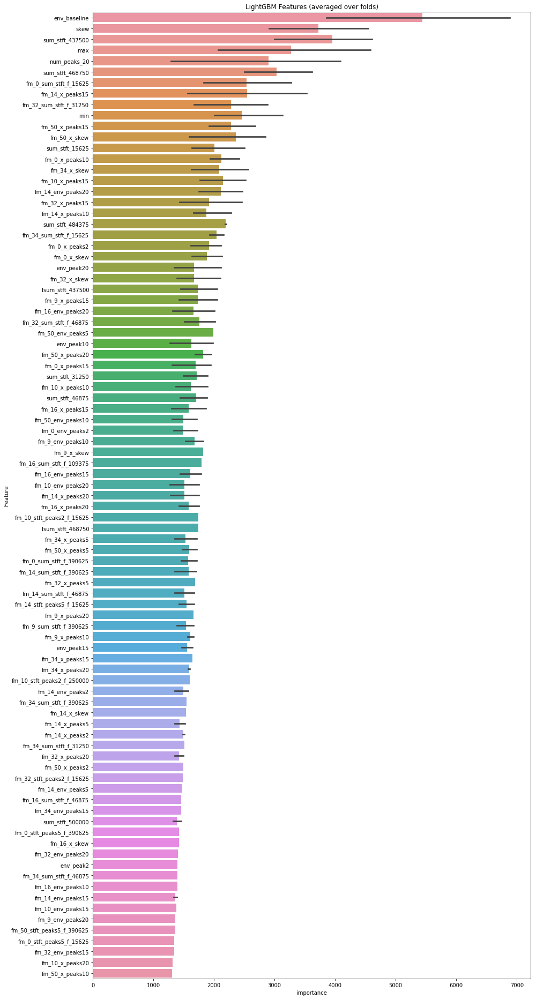

In [22]:
#feature selection
# 

params = {'num_leaves': 81,
         'min_data_in_leaf': 10, 
         'objective':'regression',
         'max_depth': -1,
         'learning_rate': 0.001,
         "boosting": "gbdt",
         "feature_fraction": 0.75,
         "bagging_freq": 1,
         "bagging_fraction": 0.90,
         "bagging_seed": 42,
         "metric": 'mae',
         "lambda_l1": 0.1,
         "verbosity": -1,
         "random_state": 42,
         "num_threads": 5}
    
#https://lightgbm.readthedocs.io/en/latest/Parameters.html
#try 
#"boosting": "dart",

#for data parallel (default is serial)
#"tree_learner": "data",

#vary num_leaves and min_data_in_leaf to adjust model complexity

#vary the seeds to avoid random start impact
    
    
    
folds = GroupKFold(5)
folds.get_n_splits(scaled_train_X, train_y, train_exp)
take_into_account_experiment_groups = True


oof = np.zeros(len(scaled_train_X))
predictions = np.zeros(len(scaled_test_X))
pred_train = np.zeros(len(scaled_train_X))
feature_importance_df = pd.DataFrame()

train_columns = scaled_train_X.columns.values

#run model

GroupKFold(5)

for fold_, (trn_idx, val_idx) in enumerate(folds.split(scaled_train_X,train_y.values,train_exp)):
    strLog = "fold {}".format(fold_)
    print(strLog)

    X_tr, X_val = scaled_train_X.iloc[trn_idx], scaled_train_X.iloc[val_idx]
    y_tr, y_val = train_y.iloc[trn_idx], train_y.iloc[val_idx]

    model = lgb.LGBMRegressor(**params, n_estimators = 20000, n_jobs = -1)
    model.fit(X_tr, 
              y_tr, 
              eval_set=[(X_tr, y_tr), (X_val, y_val)], 
              eval_metric='mae',
              verbose=1000, 
              early_stopping_rounds=500)
    oof[val_idx] = model.predict(X_val, num_iteration=model.best_iteration_)
    #feature importance
    fold_importance_df = pd.DataFrame()
    fold_importance_df["Feature"] = train_columns
    fold_importance_df["importance"] = model.feature_importances_[:len(train_columns)]
    fold_importance_df["fold"] = fold_ + 1
    feature_importance_df = pd.concat([feature_importance_df, fold_importance_df], axis=0)
    #predictions
    predictions += model.predict(scaled_test_X, num_iteration=model.best_iteration_) / folds.n_splits
    pred_train += model.predict(scaled_train_X, num_iteration=model.best_iteration_) / folds.n_splits

score_xval = mean_absolute_error(train_y.values.flatten(), oof)
print(f'Final score on xval set: {score_xval:0.3f}')

cols = (feature_importance_df[["Feature", "importance"]]
        .groupby("Feature")
        .mean()
        .sort_values(by="importance", ascending=False).index)
best_features = feature_importance_df.loc[feature_importance_df.Feature.isin(cols)]
#worst_features = feature_importance_df.loc[~feature_importance_df.Feature.isin(cols)]

plt.figure(figsize=(14,26))
sns.barplot(x="importance", y="Feature", data=best_features.sort_values(by="importance",ascending=False)[:200])
plt.title('LightGBM Features (averaged over folds)')
plt.tight_layout()
plt.savefig('lgbm_importances.png')
#print(best_features[best_features['importance']==0])
print(feature_importance_df[["Feature", "importance"]]
        .groupby("Feature")
        .mean()
        .sort_values(by="importance", ascending=False)[:200])

send_txt('feature selection','complete')

In [27]:
#training_plan=pd.DataFrame(columns=['n_fold', 'boost_type', 'first_excluded', 'nl', 'feat_list'])
train_columns = scaled_train_X.columns.values
training_plan=pd.DataFrame()
i=0
for sc in [10, 15, 20, 30, 50, 60, 70, 0]:
#for sc in [10]:
    for n_fold  in [5, 14,20]:
    #for n_fold  in [5]:
    
        
        for first_exp_excluded in [True]:
            
            for nl in [31, 51, 91, 121]:
            #for nl in [31, 51]:
                
   
                for boost_type in ["gbdt", "rf"]:
                #for boost_type in ["gbdt"]:   
                
                    for ft in ["cor","gbdt"]:
                        training_plan.loc[i,"n_fold"]= n_fold
                        training_plan.loc[i, "boost_type"]=boost_type
                        training_plan.loc[i, "first_excluded"] = first_exp_excluded
                        training_plan.loc[i, "nl"] = nl
                        training_plan.loc[i, "features"] = sc
                        training_plan.loc[i, "feat_list"] = ft

                        i=i+1


In [28]:
training_plan

,n_fold,boost_type,first_excluded,nl,features,feat_list
0,5.0,gbdt,True,31.0,10.0,cor
1,5.0,gbdt,True,31.0,10.0,gbdt
2,5.0,rf,True,31.0,10.0,cor
3,5.0,rf,True,31.0,10.0,gbdt
4,5.0,gbdt,True,51.0,10.0,cor
5,5.0,gbdt,True,51.0,10.0,gbdt
6,5.0,rf,True,51.0,10.0,cor
7,5.0,rf,True,51.0,10.0,gbdt
8,5.0,gbdt,True,91.0,10.0,cor
9,5.0,gbdt,True,91.0,10.0,gbdt


Train set 0  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2375]	valid_0's l1: 1.88183	valid_1's l1: 2.1489
Train set 0  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2704]	valid_0's l1: 1.863	valid_1's l1: 2.09113
Train set 0  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3850]	valid_0's l1: 1.80276	valid_1's l1: 2.12537
Train set 0  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[5379]	valid_0's l1: 1.7165	valid_1's l1: 2.08129
Train set 0  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3780]	valid_0's l1: 1.80353	valid_1's l1: 2.10601
Train set 0  subset 1 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, 

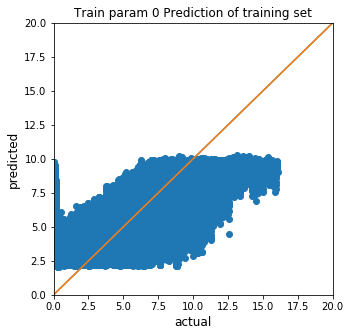

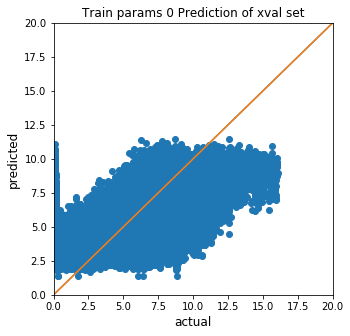

-------------------------------------------------------
Train set 1  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4297]	valid_0's l1: 1.58022	valid_1's l1: 2.03283
Train set 1  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[8447]	valid_0's l1: 1.29763	valid_1's l1: 2.00482
Train set 1  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
[10000]	valid_0's l1: 1.22428	valid_1's l1: 2.05284
Early stopping, best iteration is:
[9021]	valid_0's l1: 1.2758	valid_1's l1: 2.05238
Train set 1  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[5715]	valid_0's l1: 1.47022	valid_1's l1: 2.03763
Train set 1  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[7631]	valid_0's l1: 1.36096	valid_1's l1: 2.0435

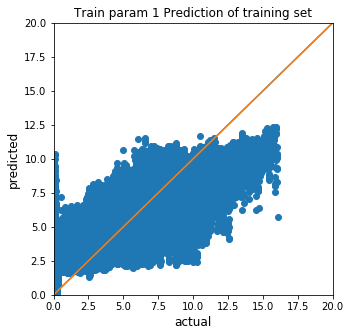

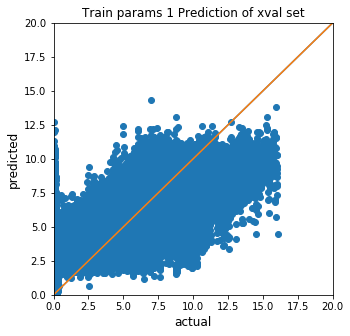

-------------------------------------------------------
Train set 2  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3]	valid_0's l1: 1.96941	valid_1's l1: 2.14843
Train set 2  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[159]	valid_0's l1: 1.96648	valid_1's l1: 2.07465
Train set 2  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[51]	valid_0's l1: 1.97608	valid_1's l1: 2.12579
Train set 2  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[24]	valid_0's l1: 1.97396	valid_1's l1: 2.09287
Train set 2  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[394]	valid_0's l1: 1.98141	valid_1's l1: 2.10729
Train set 2  subset 1 fold 0
Training until validation sco

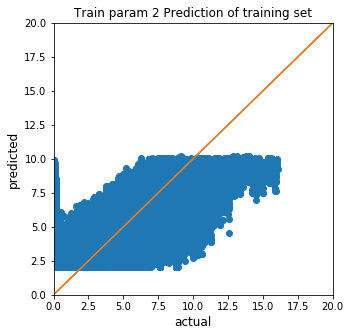

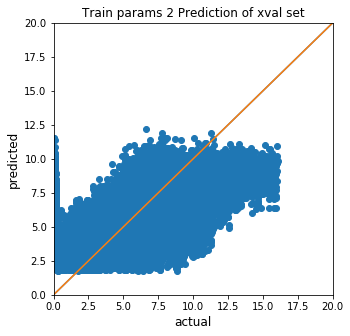

-------------------------------------------------------
Train set 3  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[25]	valid_0's l1: 1.93764	valid_1's l1: 2.07395
Train set 3  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[1230]	valid_0's l1: 1.93543	valid_1's l1: 2.08941
Train set 3  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[714]	valid_0's l1: 1.93759	valid_1's l1: 2.12613
Train set 3  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[23]	valid_0's l1: 1.93445	valid_1's l1: 2.06587
Train set 3  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[30]	valid_0's l1: 1.93266	valid_1's l1: 2.09071
Train set 3  subset 1 fold 0
Training until validation s

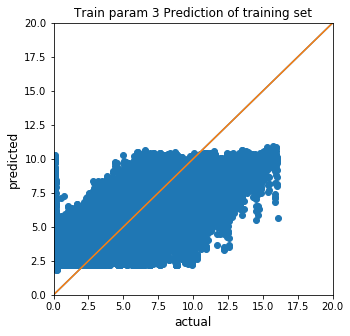

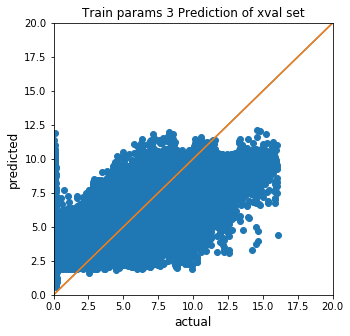

-------------------------------------------------------
Train set 4  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2140]	valid_0's l1: 1.81038	valid_1's l1: 2.16567
Train set 4  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2341]	valid_0's l1: 1.79335	valid_1's l1: 2.1062
Train set 4  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3441]	valid_0's l1: 1.69721	valid_1's l1: 2.13716
Train set 4  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4408]	valid_0's l1: 1.615	valid_1's l1: 2.08577
Train set 4  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3765]	valid_0's l1: 1.66613	valid_1's l1: 2.11549
Train set 4  subset 1 fold 0
Training until validati

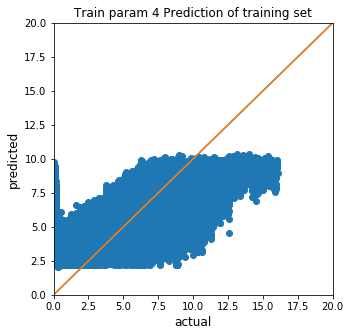

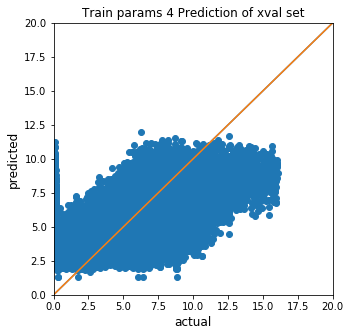

-------------------------------------------------------
Train set 5  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3602]	valid_0's l1: 1.4536	valid_1's l1: 2.0393
Train set 5  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[6060]	valid_0's l1: 1.19155	valid_1's l1: 2.021
Train set 5  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[6321]	valid_0's l1: 1.17919	valid_1's l1: 2.05653
Train set 5  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4801]	valid_0's l1: 1.3125	valid_1's l1: 2.04227
Train set 5  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[5551]	valid_0's l1: 1.25173	valid_1's l1: 2.05042
Train set 5  subset 1 fold 0
Training until validation

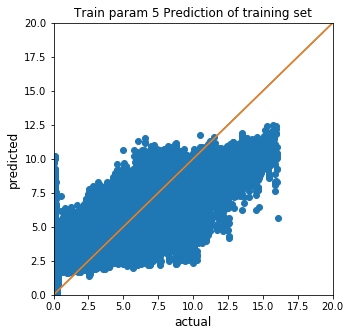

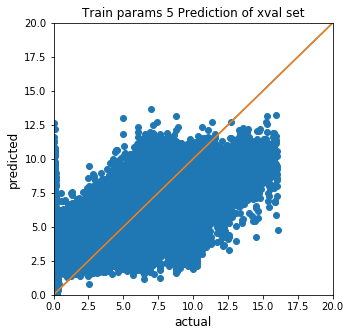

-------------------------------------------------------
Train set 6  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[550]	valid_0's l1: 1.89668	valid_1's l1: 2.16879
Train set 6  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[16]	valid_0's l1: 1.90052	valid_1's l1: 2.09238
Train set 6  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[1349]	valid_0's l1: 1.9165	valid_1's l1: 2.13374
Train set 6  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[57]	valid_0's l1: 1.91927	valid_1's l1: 2.08193
Train set 6  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[44]	valid_0's l1: 1.91735	valid_1's l1: 2.11074
Train set 6  subset 1 fold 0
Training until validation sc

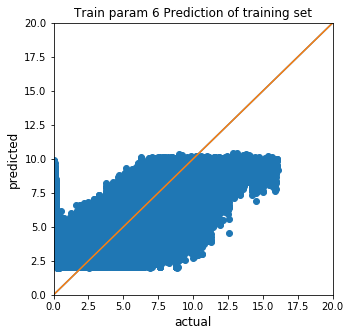

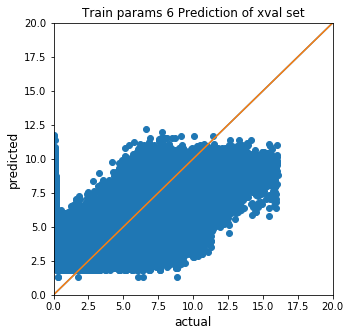

-------------------------------------------------------
Train set 7  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[25]	valid_0's l1: 1.85331	valid_1's l1: 2.06864
Train set 7  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[694]	valid_0's l1: 1.84167	valid_1's l1: 2.07647
Train set 7  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[196]	valid_0's l1: 1.84639	valid_1's l1: 2.11065
Train set 7  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[84]	valid_0's l1: 1.85156	valid_1's l1: 2.06134
Train set 7  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[30]	valid_0's l1: 1.84725	valid_1's l1: 2.0808
Train set 7  subset 1 fold 0
Training until validation sco

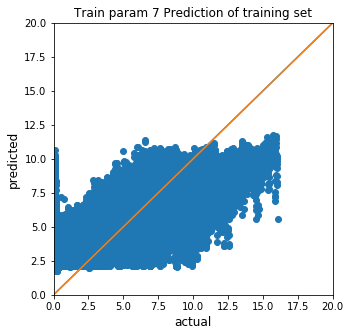

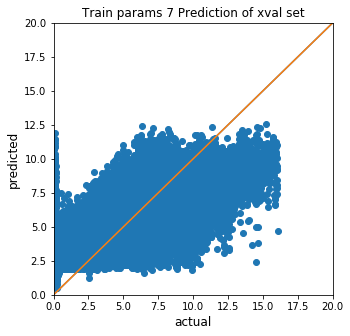

-------------------------------------------------------
Train set 8  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[1929]	valid_0's l1: 1.69761	valid_1's l1: 2.18775
Train set 8  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2242]	valid_0's l1: 1.6452	valid_1's l1: 2.12807
Train set 8  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3178]	valid_0's l1: 1.52286	valid_1's l1: 2.15839
Train set 8  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3281]	valid_0's l1: 1.5086	valid_1's l1: 2.1046
Train set 8  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3189]	valid_0's l1: 1.52054	valid_1's l1: 2.13281
Train set 8  subset 1 fold 0
Training until validati

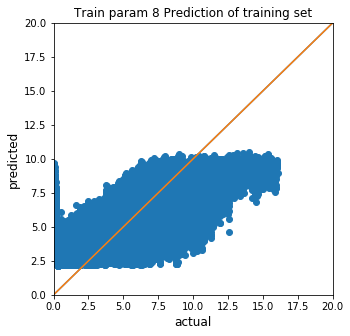

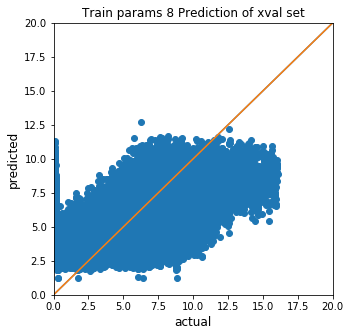

-------------------------------------------------------
Train set 9  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3053]	valid_0's l1: 1.26817	valid_1's l1: 2.04957
Train set 9  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[5311]	valid_0's l1: 0.925677	valid_1's l1: 2.03746
Train set 9  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4912]	valid_0's l1: 0.982089	valid_1's l1: 2.06265
Train set 9  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4381]	valid_0's l1: 1.0468	valid_1's l1: 2.05508
Train set 9  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4090]	valid_0's l1: 1.09817	valid_1's l1: 2.06261
Train set 9  subset 1 fold 0
Training until vali

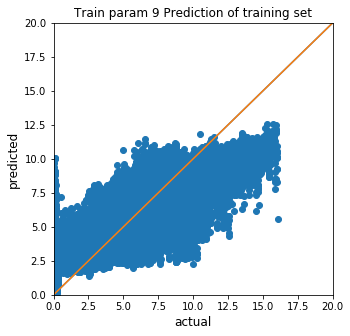

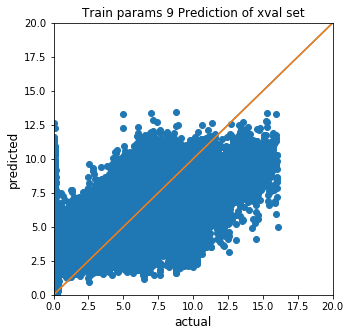

-------------------------------------------------------
Train set 10  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[63]	valid_0's l1: 1.79687	valid_1's l1: 2.17787
Train set 10  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[34]	valid_0's l1: 1.79209	valid_1's l1: 2.10588
Train set 10  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[550]	valid_0's l1: 1.81109	valid_1's l1: 2.15051
Train set 10  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[57]	valid_0's l1: 1.8197	valid_1's l1: 2.08638
Train set 10  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[20]	valid_0's l1: 1.82035	valid_1's l1: 2.11664
Train set 10  subset 1 fold 0
Training until validatio

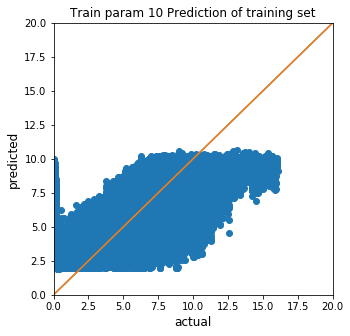

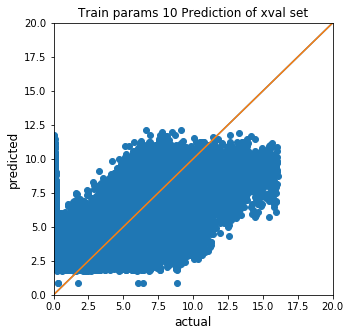

-------------------------------------------------------
Train set 11  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[20]	valid_0's l1: 1.71166	valid_1's l1: 2.06463
Train set 11  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[298]	valid_0's l1: 1.692	valid_1's l1: 2.06295
Train set 11  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[296]	valid_0's l1: 1.69792	valid_1's l1: 2.1064
Train set 11  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[397]	valid_0's l1: 1.70716	valid_1's l1: 2.06593
Train set 11  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[30]	valid_0's l1: 1.70588	valid_1's l1: 2.06127
Train set 11  subset 1 fold 0
Training until validatio

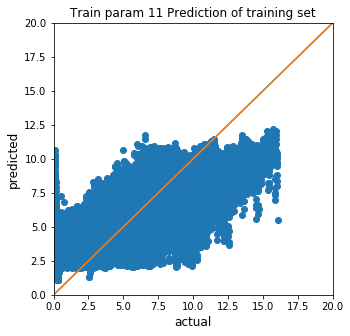

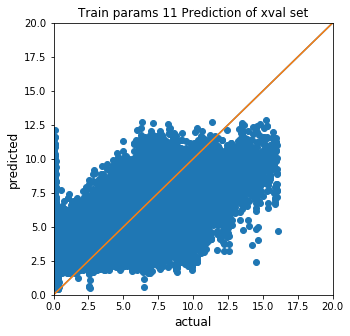

-------------------------------------------------------
Train set 12  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[1811]	valid_0's l1: 1.63851	valid_1's l1: 2.20034
Train set 12  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2137]	valid_0's l1: 1.56877	valid_1's l1: 2.14253
Train set 12  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2771]	valid_0's l1: 1.46649	valid_1's l1: 2.16772
Train set 12  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2915]	valid_0's l1: 1.44282	valid_1's l1: 2.12054
Train set 12  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2817]	valid_0's l1: 1.46052	valid_1's l1: 2.14426
Train set 12  subset 1 fold 0
Training until

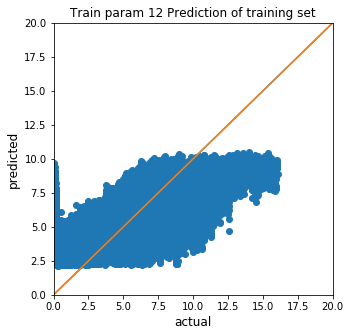

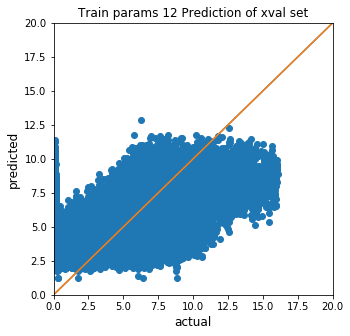

-------------------------------------------------------
Train set 13  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3070]	valid_0's l1: 1.11789	valid_1's l1: 2.05599
Train set 13  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3495]	valid_0's l1: 1.02956	valid_1's l1: 2.04732
Train set 13  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4674]	valid_0's l1: 0.842061	valid_1's l1: 2.06836
Train set 13  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4059]	valid_0's l1: 0.930929	valid_1's l1: 2.06353
Train set 13  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4221]	valid_0's l1: 0.91331	valid_1's l1: 2.07364
Train set 13  subset 1 fold 0
Training unt

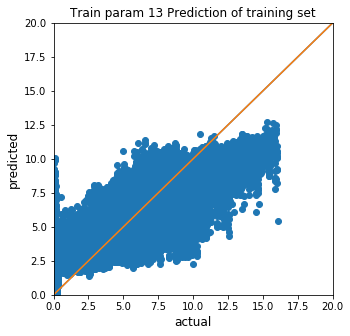

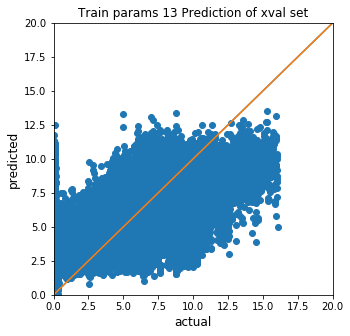

-------------------------------------------------------
Train set 14  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[61]	valid_0's l1: 1.73051	valid_1's l1: 2.18583
Train set 14  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[683]	valid_0's l1: 1.72569	valid_1's l1: 2.11671
Train set 14  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[361]	valid_0's l1: 1.74372	valid_1's l1: 2.16044
Train set 14  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[57]	valid_0's l1: 1.75357	valid_1's l1: 2.09391
Train set 14  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[357]	valid_0's l1: 1.74776	valid_1's l1: 2.12393
Train set 14  subset 1 fold 0
Training until valida

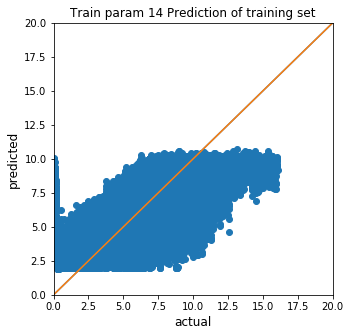

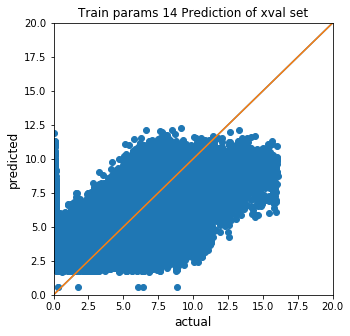

-------------------------------------------------------
Train set 15  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[20]	valid_0's l1: 1.62675	valid_1's l1: 2.06975
Train set 15  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[376]	valid_0's l1: 1.60393	valid_1's l1: 2.06036
Train set 15  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[716]	valid_0's l1: 1.60785	valid_1's l1: 2.10854
Train set 15  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[346]	valid_0's l1: 1.62079	valid_1's l1: 2.06604
Train set 15  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[40]	valid_0's l1: 1.61775	valid_1's l1: 2.05992
Train set 15  subset 1 fold 0
Training until valida

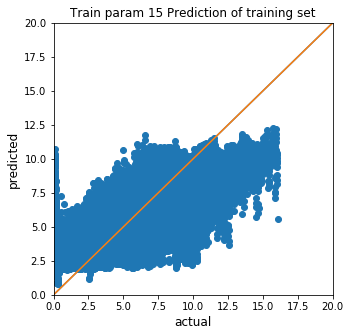

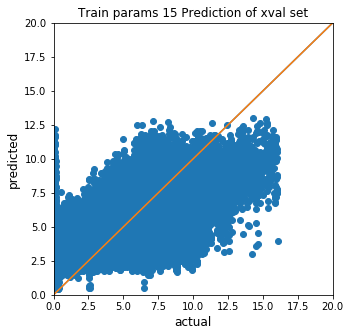

-------------------------------------------------------
Train set 16  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[5708]	valid_0's l1: 1.56716	valid_1's l1: 3.68099
Train set 16  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3132]	valid_0's l1: 1.73213	valid_1's l1: 3.31971
Train set 16  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
[10000]	valid_0's l1: 1.51626	valid_1's l1: 2.63548
Early stopping, best iteration is:
[10436]	valid_0's l1: 1.50246	valid_1's l1: 2.63514
Train set 16  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[6785]	valid_0's l1: 1.70257	valid_1's l1: 1.88138
Train set 16  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[6341]	valid_0's l1: 1.73946	valid_1's l1:

Early stopping, best iteration is:
[6969]	valid_0's l1: 1.6261	valid_1's l1: 2.71805
Train set 16  subset 3 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[6414]	valid_0's l1: 1.72666	valid_1's l1: 1.83883
Train set 16  subset 3 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4125]	valid_0's l1: 1.85214	valid_1's l1: 1.62748
Train set 16  subset 3 fold 5
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4293]	valid_0's l1: 1.8653	valid_1's l1: 1.31771
Train set 16  subset 3 fold 6
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4506]	valid_0's l1: 1.86143	valid_1's l1: 1.11706
Train set 16  subset 3 fold 7
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2414]	valid_0's l1: 1.98717	valid_1's l1: 1.26885
Train set 16  su

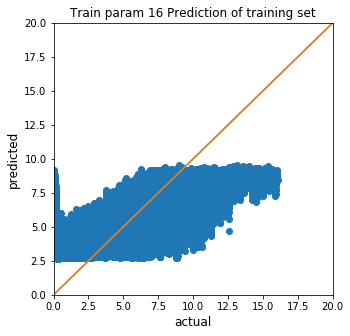

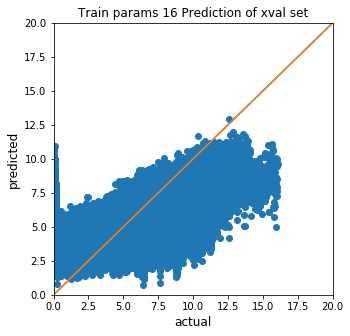

-------------------------------------------------------
Train set 17  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[6376]	valid_0's l1: 1.34071	valid_1's l1: 3.54033
Train set 17  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
[10000]	valid_0's l1: 1.20996	valid_1's l1: 3.09803
Early stopping, best iteration is:
[12476]	valid_0's l1: 1.10348	valid_1's l1: 3.0968
Train set 17  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
[10000]	valid_0's l1: 1.23438	valid_1's l1: 2.66987
Early stopping, best iteration is:
[10095]	valid_0's l1: 1.22996	valid_1's l1: 2.66957
Train set 17  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[7981]	valid_0's l1: 1.37707	valid_1's l1: 2.2469
Train set 17  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best itera

[10000]	valid_0's l1: 1.2537	valid_1's l1: 2.68586
Early stopping, best iteration is:
[9357]	valid_0's l1: 1.28406	valid_1's l1: 2.68485
Train set 17  subset 3 fold 3
Training until validation scores don't improve for 1000 rounds.
[10000]	valid_0's l1: 1.29278	valid_1's l1: 2.16438
Early stopping, best iteration is:
[14983]	valid_0's l1: 1.08446	valid_1's l1: 2.15529
Train set 17  subset 3 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4790]	valid_0's l1: 1.63086	valid_1's l1: 1.51571
Train set 17  subset 3 fold 5
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[7700]	valid_0's l1: 1.45036	valid_1's l1: 1.57524
Train set 17  subset 3 fold 6
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[5949]	valid_0's l1: 1.56322	valid_1's l1: 1.40444
Train set 17  subset 3 fold 7
Training until validation scores don't improve for 1000 roun

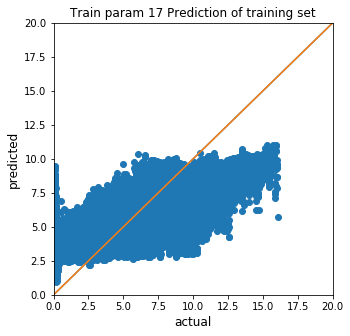

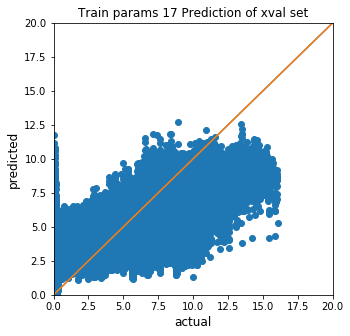

-------------------------------------------------------
Train set 18  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[21]	valid_0's l1: 1.80339	valid_1's l1: 3.67869
Train set 18  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[117]	valid_0's l1: 1.84909	valid_1's l1: 3.33175
Train set 18  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[27]	valid_0's l1: 1.9252	valid_1's l1: 2.65714
Train set 18  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[1]	valid_0's l1: 2.04264	valid_1's l1: 1.86285
Train set 18  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[438]	valid_0's l1: 2.02562	valid_1's l1: 1.54061
Train set 18  subset 0 fold 5
Training until validatio

Early stopping, best iteration is:
[6]	valid_0's l1: 2.04524	valid_1's l1: 1.53977
Train set 18  subset 3 fold 5
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[132]	valid_0's l1: 2.05576	valid_1's l1: 1.27037
Train set 18  subset 3 fold 6
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[49]	valid_0's l1: 2.06109	valid_1's l1: 1.09262
Train set 18  subset 3 fold 7
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[91]	valid_0's l1: 2.04849	valid_1's l1: 1.28921
Train set 18  subset 3 fold 8
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[37]	valid_0's l1: 2.03041	valid_1's l1: 1.67351
Train set 18  subset 3 fold 9
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[6]	valid_0's l1: 2.03138	valid_1's l1: 1.78255
Train set 18  subset 3 fold

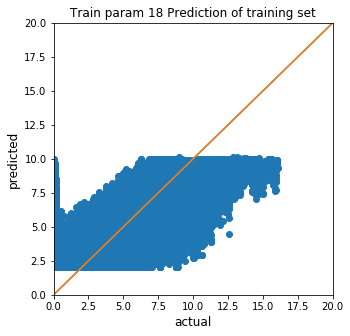

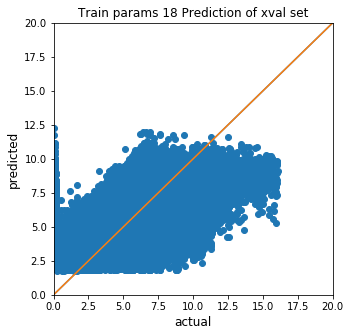

-------------------------------------------------------
Train set 19  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[16]	valid_0's l1: 1.77583	valid_1's l1: 3.56495
Train set 19  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2]	valid_0's l1: 1.85548	valid_1's l1: 3.22205
Train set 19  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[30]	valid_0's l1: 1.88116	valid_1's l1: 2.73732
Train set 19  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[1]	valid_0's l1: 2.01618	valid_1's l1: 2.25571
Train set 19  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[26]	valid_0's l1: 1.98508	valid_1's l1: 1.57799
Train set 19  subset 0 fold 5
Training until validation 

Early stopping, best iteration is:
[2]	valid_0's l1: 2.04654	valid_1's l1: 1.5054
Train set 19  subset 3 fold 5
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[32]	valid_0's l1: 1.98642	valid_1's l1: 1.60769
Train set 19  subset 3 fold 6
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[22]	valid_0's l1: 2.00209	valid_1's l1: 1.50002
Train set 19  subset 3 fold 7
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[34]	valid_0's l1: 2.01211	valid_1's l1: 1.31662
Train set 19  subset 3 fold 8
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4]	valid_0's l1: 1.99066	valid_1's l1: 2.09642
Train set 19  subset 3 fold 9
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[31]	valid_0's l1: 2.00227	valid_1's l1: 1.38683
Train set 19  subset 3 fold 1

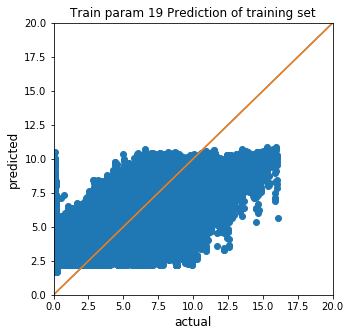

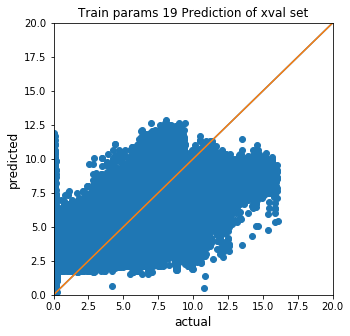

-------------------------------------------------------
Train set 20  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[5410]	valid_0's l1: 1.43288	valid_1's l1: 3.6867
Train set 20  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3142]	valid_0's l1: 1.62523	valid_1's l1: 3.31793
Train set 20  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
[10000]	valid_0's l1: 1.30718	valid_1's l1: 2.63275
Early stopping, best iteration is:
[9701]	valid_0's l1: 1.31985	valid_1's l1: 2.63201
Train set 20  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[6234]	valid_0's l1: 1.55127	valid_1's l1: 1.89483
Train set 20  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[5218]	valid_0's l1: 1.62839	valid_1's l1: 1

Train set 20  subset 3 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[5693]	valid_0's l1: 1.59754	valid_1's l1: 1.83503
Train set 20  subset 3 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4050]	valid_0's l1: 1.72256	valid_1's l1: 1.66188
Train set 20  subset 3 fold 5
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3572]	valid_0's l1: 1.78277	valid_1's l1: 1.35025
Train set 20  subset 3 fold 6
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3846]	valid_0's l1: 1.76612	valid_1's l1: 1.14585
Train set 20  subset 3 fold 7
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2216]	valid_0's l1: 1.91791	valid_1's l1: 1.28607
Train set 20  subset 3 fold 8
Training until validation scores don't improve for 1000 rounds.
Early 

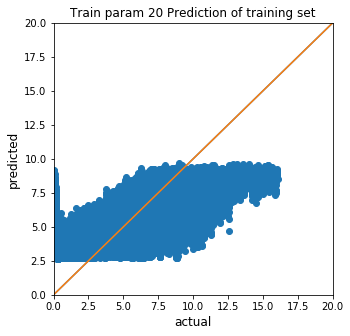

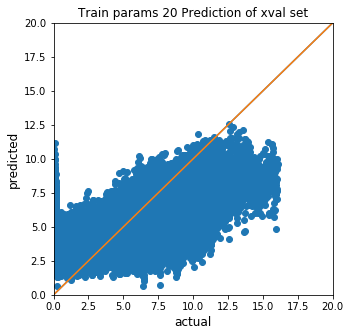

-------------------------------------------------------
Train set 21  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[6770]	valid_0's l1: 1.08957	valid_1's l1: 3.54473
Train set 21  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[8802]	valid_0's l1: 1.00185	valid_1's l1: 3.10954
Train set 21  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
[10000]	valid_0's l1: 0.950789	valid_1's l1: 2.66951
Early stopping, best iteration is:
[10096]	valid_0's l1: 0.945288	valid_1's l1: 2.66933
Train set 21  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[7181]	valid_0's l1: 1.16621	valid_1's l1: 2.25509
Train set 21  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4745]	valid_0's l1: 1.41129	valid_1's l

Train set 21  subset 3 fold 3
Training until validation scores don't improve for 1000 rounds.
[10000]	valid_0's l1: 1.00092	valid_1's l1: 2.15697
Early stopping, best iteration is:
[10616]	valid_0's l1: 0.966054	valid_1's l1: 2.15588
Train set 21  subset 3 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4828]	valid_0's l1: 1.41417	valid_1's l1: 1.52259
Train set 21  subset 3 fold 5
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[5978]	valid_0's l1: 1.31112	valid_1's l1: 1.59057
Train set 21  subset 3 fold 6
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[5504]	valid_0's l1: 1.36195	valid_1's l1: 1.41995
Train set 21  subset 3 fold 7
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2263]	valid_0's l1: 1.76211	valid_1's l1: 1.28509
Train set 21  subset 3 fold 8
Training until v

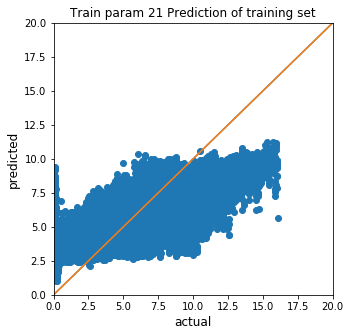

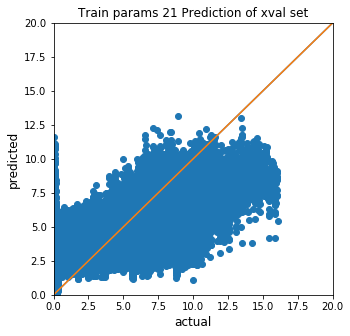

-------------------------------------------------------
Train set 22  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[36]	valid_0's l1: 1.75337	valid_1's l1: 3.68664
Train set 22  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[72]	valid_0's l1: 1.79572	valid_1's l1: 3.33216
Train set 22  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[24]	valid_0's l1: 1.87321	valid_1's l1: 2.63617
Train set 22  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[1]	valid_0's l1: 2.01136	valid_1's l1: 1.85986
Train set 22  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[867]	valid_0's l1: 1.9698	valid_1's l1: 1.55098
Train set 22  subset 0 fold 5
Training until validation

Early stopping, best iteration is:
[9]	valid_0's l1: 1.98758	valid_1's l1: 1.56213
Train set 22  subset 3 fold 5
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[57]	valid_0's l1: 2.00603	valid_1's l1: 1.28672
Train set 22  subset 3 fold 6
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[32]	valid_0's l1: 2.00991	valid_1's l1: 1.09795
Train set 22  subset 3 fold 7
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[52]	valid_0's l1: 1.99782	valid_1's l1: 1.28497
Train set 22  subset 3 fold 8
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[134]	valid_0's l1: 1.98174	valid_1's l1: 1.69473
Train set 22  subset 3 fold 9
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[6]	valid_0's l1: 1.98632	valid_1's l1: 1.77746
Train set 22  subset 3 fold

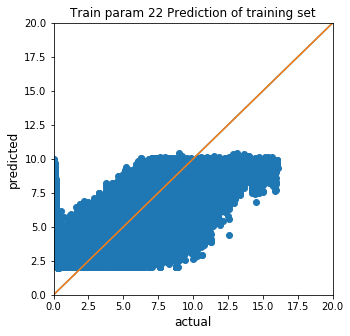

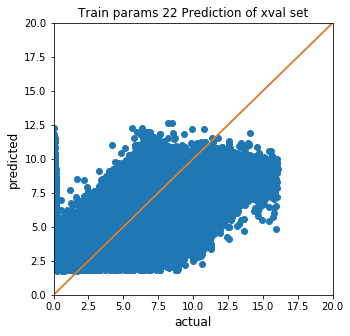

-------------------------------------------------------
Train set 23  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[16]	valid_0's l1: 1.70041	valid_1's l1: 3.56831
Train set 23  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2]	valid_0's l1: 1.7902	valid_1's l1: 3.21904
Train set 23  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[716]	valid_0's l1: 1.80161	valid_1's l1: 2.72327
Train set 23  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[64]	valid_0's l1: 1.84987	valid_1's l1: 2.27557
Train set 23  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[25]	valid_0's l1: 1.90328	valid_1's l1: 1.58479
Train set 23  subset 0 fold 5
Training until validation

Early stopping, best iteration is:
[304]	valid_0's l1: 1.91668	valid_1's l1: 1.50182
Train set 23  subset 3 fold 5
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[81]	valid_0's l1: 1.90378	valid_1's l1: 1.61214
Train set 23  subset 3 fold 6
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[18]	valid_0's l1: 1.91775	valid_1's l1: 1.49301
Train set 23  subset 3 fold 7
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[17]	valid_0's l1: 1.93205	valid_1's l1: 1.31986
Train set 23  subset 3 fold 8
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4]	valid_0's l1: 1.91726	valid_1's l1: 2.1034
Train set 23  subset 3 fold 9
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3]	valid_0's l1: 1.95738	valid_1's l1: 1.35522
Train set 23  subset 3 fold 

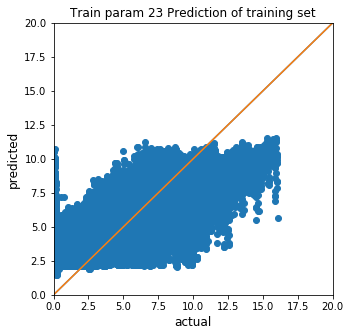

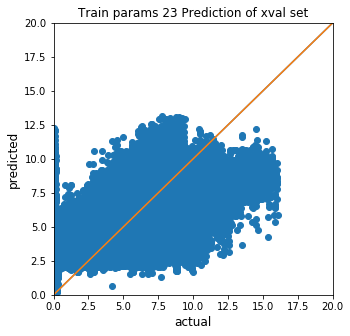

-------------------------------------------------------
Train set 24  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4235]	valid_0's l1: 1.30424	valid_1's l1: 3.68894
Train set 24  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2718]	valid_0's l1: 1.50537	valid_1's l1: 3.3219
Train set 24  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[6130]	valid_0's l1: 1.23807	valid_1's l1: 2.64083
Train set 24  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4271]	valid_0's l1: 1.45522	valid_1's l1: 1.91898
Train set 24  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4115]	valid_0's l1: 1.48731	valid_1's l1: 1.62067
Train set 24  subset 0 fold 5
Training until 

Early stopping, best iteration is:
[4596]	valid_0's l1: 1.44523	valid_1's l1: 1.84534
Train set 24  subset 3 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3534]	valid_0's l1: 1.56533	valid_1's l1: 1.71496
Train set 24  subset 3 fold 5
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3040]	valid_0's l1: 1.64813	valid_1's l1: 1.39423
Train set 24  subset 3 fold 6
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3453]	valid_0's l1: 1.60362	valid_1's l1: 1.18906
Train set 24  subset 3 fold 7
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2110]	valid_0's l1: 1.79085	valid_1's l1: 1.32023
Train set 24  subset 3 fold 8
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[1199]	valid_0's l1: 2.01551	valid_1's l1: 1.59222
Train set 24  

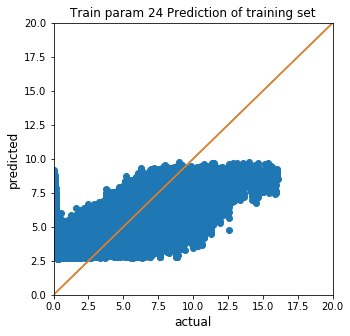

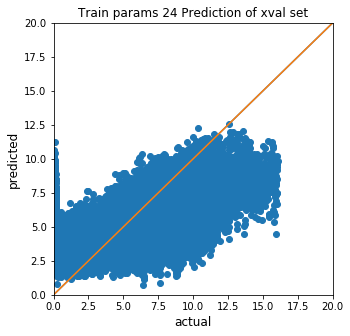

-------------------------------------------------------
Train set 25  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[5932]	valid_0's l1: 0.846124	valid_1's l1: 3.55561
Train set 25  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
[10000]	valid_0's l1: 0.579813	valid_1's l1: 3.12573
Early stopping, best iteration is:
[9368]	valid_0's l1: 0.61752	valid_1's l1: 3.12488
Train set 25  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[8840]	valid_0's l1: 0.666578	valid_1's l1: 2.66518
Train set 25  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4073]	valid_0's l1: 1.15345	valid_1's l1: 2.26356
Train set 25  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3939]	valid_0's l1: 1.21057	valid_1's l

Train set 25  subset 3 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[7634]	valid_0's l1: 0.789953	valid_1's l1: 2.15807
Train set 25  subset 3 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3943]	valid_0's l1: 1.21813	valid_1's l1: 1.53607
Train set 25  subset 3 fold 5
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[5881]	valid_0's l1: 0.978752	valid_1's l1: 1.60177
Train set 25  subset 3 fold 6
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4574]	valid_0's l1: 1.13862	valid_1's l1: 1.45433
Train set 25  subset 3 fold 7
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2118]	valid_0's l1: 1.59231	valid_1's l1: 1.3179
Train set 25  subset 3 fold 8
Training until validation scores don't improve for 1000 rounds.
Early

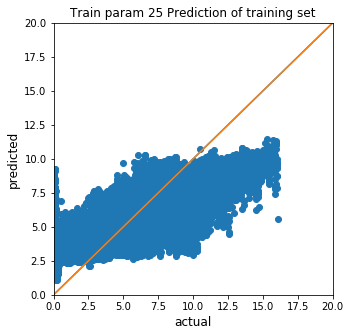

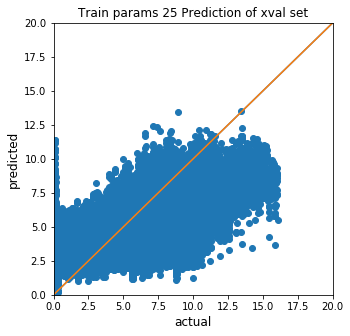

-------------------------------------------------------
Train set 26  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[91]	valid_0's l1: 1.66393	valid_1's l1: 3.70126
Train set 26  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2]	valid_0's l1: 1.74925	valid_1's l1: 3.31095
Train set 26  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[25]	valid_0's l1: 1.77981	valid_1's l1: 2.62856
Train set 26  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[1]	valid_0's l1: 1.95349	valid_1's l1: 1.85972
Train set 26  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[279]	valid_0's l1: 1.87331	valid_1's l1: 1.57369
Train set 26  subset 0 fold 5
Training until validation

Early stopping, best iteration is:
[333]	valid_0's l1: 1.89267	valid_1's l1: 1.59868
Train set 26  subset 3 fold 5
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[164]	valid_0's l1: 1.91141	valid_1's l1: 1.33208
Train set 26  subset 3 fold 6
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[303]	valid_0's l1: 1.91523	valid_1's l1: 1.12765
Train set 26  subset 3 fold 7
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[36]	valid_0's l1: 1.90974	valid_1's l1: 1.30688
Train set 26  subset 3 fold 8
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[147]	valid_0's l1: 1.89184	valid_1's l1: 1.72654
Train set 26  subset 3 fold 9
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[37]	valid_0's l1: 1.88305	valid_1's l1: 1.80483
Train set 26  subset 3

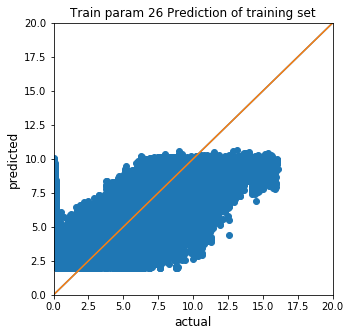

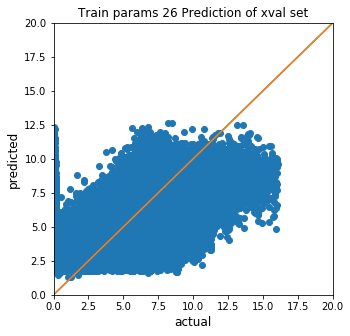

-------------------------------------------------------
Train set 27  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[48]	valid_0's l1: 1.57478	valid_1's l1: 3.57965
Train set 27  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[22]	valid_0's l1: 1.62201	valid_1's l1: 3.20692
Train set 27  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[685]	valid_0's l1: 1.67513	valid_1's l1: 2.70343
Train set 27  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[7]	valid_0's l1: 1.73877	valid_1's l1: 2.26263
Train set 27  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[25]	valid_0's l1: 1.76542	valid_1's l1: 1.59554
Train set 27  subset 0 fold 5
Training until validatio

Early stopping, best iteration is:
[88]	valid_0's l1: 1.78541	valid_1's l1: 1.48019
Train set 27  subset 3 fold 5
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[127]	valid_0's l1: 1.77137	valid_1's l1: 1.61316
Train set 27  subset 3 fold 6
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[30]	valid_0's l1: 1.78745	valid_1's l1: 1.48517
Train set 27  subset 3 fold 7
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[696]	valid_0's l1: 1.78954	valid_1's l1: 1.35488
Train set 27  subset 3 fold 8
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4]	valid_0's l1: 1.79457	valid_1's l1: 2.19524
Train set 27  subset 3 fold 9
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3]	valid_0's l1: 1.84822	valid_1's l1: 1.36287
Train set 27  subset 3 fol

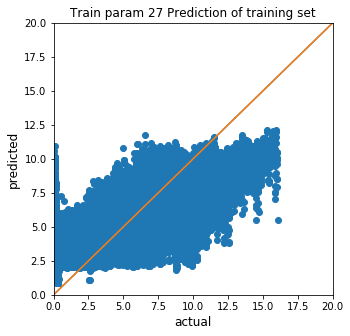

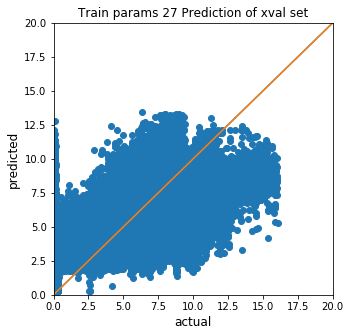

-------------------------------------------------------
Train set 28  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4164]	valid_0's l1: 1.19341	valid_1's l1: 3.6929
Train set 28  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3003]	valid_0's l1: 1.36704	valid_1's l1: 3.32602
Train set 28  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4945]	valid_0's l1: 1.19687	valid_1's l1: 2.6477
Train set 28  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4050]	valid_0's l1: 1.34917	valid_1's l1: 1.93095
Train set 28  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3785]	valid_0's l1: 1.39564	valid_1's l1: 1.64172
Train set 28  subset 0 fold 5
Training until v

Early stopping, best iteration is:
[4590]	valid_0's l1: 1.31468	valid_1's l1: 1.85162
Train set 28  subset 3 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3413]	valid_0's l1: 1.46138	valid_1's l1: 1.74771
Train set 28  subset 3 fold 5
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2930]	valid_0's l1: 1.55377	valid_1's l1: 1.41696
Train set 28  subset 3 fold 6
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3067]	valid_0's l1: 1.5386	valid_1's l1: 1.21358
Train set 28  subset 3 fold 7
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[1964]	valid_0's l1: 1.73412	valid_1's l1: 1.34281
Train set 28  subset 3 fold 8
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[1140]	valid_0's l1: 1.98217	valid_1's l1: 1.60485
Train set 28  s

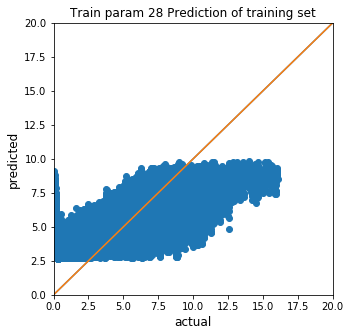

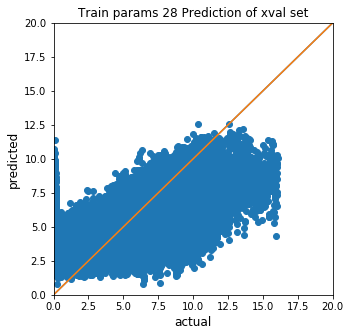

-------------------------------------------------------
Train set 29  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[5813]	valid_0's l1: 0.696829	valid_1's l1: 3.56486
Train set 29  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[6456]	valid_0's l1: 0.666149	valid_1's l1: 3.13314
Train set 29  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[7966]	valid_0's l1: 0.555689	valid_1's l1: 2.66882
Train set 29  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4213]	valid_0's l1: 0.973132	valid_1's l1: 2.26651
Train set 29  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3876]	valid_0's l1: 1.05883	valid_1's l1: 1.5929
Train set 29  subset 0 fold 5
Training un

Early stopping, best iteration is:
[6815]	valid_0's l1: 0.678597	valid_1's l1: 2.16446
Train set 29  subset 3 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4113]	valid_0's l1: 1.02863	valid_1's l1: 1.55339
Train set 29  subset 3 fold 5
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[5640]	valid_0's l1: 0.824403	valid_1's l1: 1.61701
Train set 29  subset 3 fold 6
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4816]	valid_0's l1: 0.933529	valid_1's l1: 1.47174
Train set 29  subset 3 fold 7
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2223]	valid_0's l1: 1.44323	valid_1's l1: 1.33363
Train set 29  subset 3 fold 8
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[587]	valid_0's l1: 2.26247	valid_1's l1: 1.69522
Train set 29

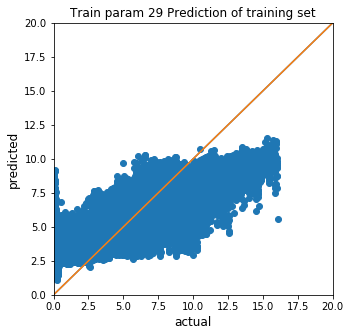

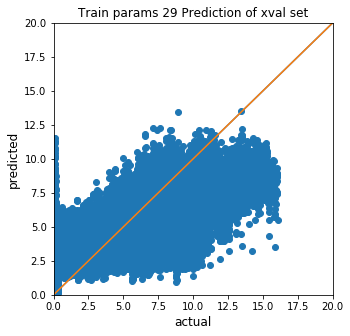

-------------------------------------------------------
Train set 30  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[91]	valid_0's l1: 1.60639	valid_1's l1: 3.70355
Train set 30  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2]	valid_0's l1: 1.7107	valid_1's l1: 3.3251
Train set 30  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[75]	valid_0's l1: 1.71621	valid_1's l1: 2.64437
Train set 30  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[1]	valid_0's l1: 1.90821	valid_1's l1: 1.88319
Train set 30  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[405]	valid_0's l1: 1.81123	valid_1's l1: 1.58258
Train set 30  subset 0 fold 5
Training until validation s

Early stopping, best iteration is:
[101]	valid_0's l1: 1.82925	valid_1's l1: 1.61964
Train set 30  subset 3 fold 5
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[55]	valid_0's l1: 1.85165	valid_1's l1: 1.34458
Train set 30  subset 3 fold 6
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[787]	valid_0's l1: 1.85274	valid_1's l1: 1.14944
Train set 30  subset 3 fold 7
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[51]	valid_0's l1: 1.84739	valid_1's l1: 1.31892
Train set 30  subset 3 fold 8
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[144]	valid_0's l1: 1.83237	valid_1's l1: 1.74501
Train set 30  subset 3 fold 9
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[18]	valid_0's l1: 1.83139	valid_1's l1: 1.82398
Train set 30  subset 3 

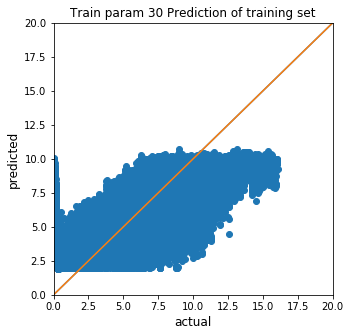

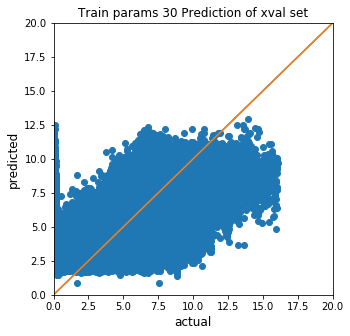

-------------------------------------------------------
Train set 31  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[316]	valid_0's l1: 1.49589	valid_1's l1: 3.58376
Train set 31  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[22]	valid_0's l1: 1.54419	valid_1's l1: 3.19896
Train set 31  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[686]	valid_0's l1: 1.59603	valid_1's l1: 2.69742
Train set 31  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[6]	valid_0's l1: 1.66506	valid_1's l1: 2.25662
Train set 31  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[580]	valid_0's l1: 1.68153	valid_1's l1: 1.5589
Train set 31  subset 0 fold 5
Training until validati

Early stopping, best iteration is:
[60]	valid_0's l1: 1.70268	valid_1's l1: 1.49474
Train set 31  subset 3 fold 5
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[10]	valid_0's l1: 1.70406	valid_1's l1: 1.616
Train set 31  subset 3 fold 6
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[40]	valid_0's l1: 1.70321	valid_1's l1: 1.48919
Train set 31  subset 3 fold 7
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[698]	valid_0's l1: 1.70522	valid_1's l1: 1.36812
Train set 31  subset 3 fold 8
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[483]	valid_0's l1: 1.68792	valid_1's l1: 2.24837
Train set 31  subset 3 fold 9
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[31]	valid_0's l1: 1.71041	valid_1's l1: 1.38743
Train set 31  subset 3 fol

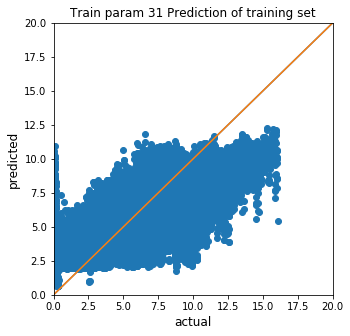

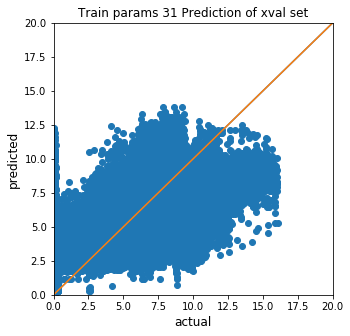

-------------------------------------------------------
Train set 32  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2593]	valid_0's l1: 1.90704	valid_1's l1: 2.13262
Train set 32  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2926]	valid_0's l1: 1.88442	valid_1's l1: 2.09088
Train set 32  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3512]	valid_0's l1: 1.84417	valid_1's l1: 2.17245
Train set 32  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3306]	valid_0's l1: 1.84682	valid_1's l1: 2.19601
Train set 32  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2352]	valid_0's l1: 1.92593	valid_1's l1: 2.04783
Train set 32  subset 0 fold 5
Training until

Early stopping, best iteration is:
[4188]	valid_0's l1: 1.82962	valid_1's l1: 1.97726
Train set 32  subset 2 fold 6
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3267]	valid_0's l1: 1.87824	valid_1's l1: 2.0632
Train set 32  subset 2 fold 7
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[5897]	valid_0's l1: 1.74427	valid_1's l1: 2.12296
Train set 32  subset 2 fold 8
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3538]	valid_0's l1: 1.86504	valid_1's l1: 2.06177
Train set 32  subset 2 fold 9
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4829]	valid_0's l1: 1.79151	valid_1's l1: 2.24226
Train set 32  subset 2 fold 10
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4282]	valid_0's l1: 1.82254	valid_1's l1: 2.11352
Train set 32  

Train set 32  subset 4 fold 11
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2466]	valid_0's l1: 1.90186	valid_1's l1: 2.27725
Train set 32  subset 4 fold 12
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3421]	valid_0's l1: 1.84088	valid_1's l1: 2.13067
Train set 32  subset 4 fold 13
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4643]	valid_0's l1: 1.78281	valid_1's l1: 2.03287
Train set 32  subset 4 fold 14
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4830]	valid_0's l1: 1.77007	valid_1's l1: 2.05113
Train set 32  subset 4 fold 15
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3345]	valid_0's l1: 1.84274	valid_1's l1: 2.23236
Train set 32  subset 4 fold 16
Training until validation scores don't improve for 1000 rounds.


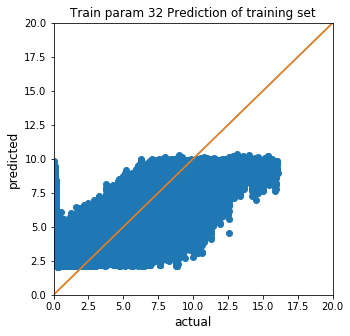

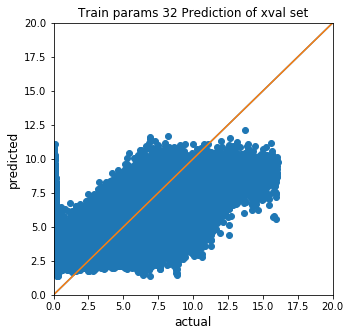

-------------------------------------------------------
Train set 33  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[8243]	valid_0's l1: 1.38206	valid_1's l1: 2.1875
Train set 33  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4836]	valid_0's l1: 1.60236	valid_1's l1: 1.86672
Train set 33  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4336]	valid_0's l1: 1.63466	valid_1's l1: 1.95464
Train set 33  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[5976]	valid_0's l1: 1.51393	valid_1's l1: 2.10827
Train set 33  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
[10000]	valid_0's l1: 1.30297	valid_1's l1: 1.88679
Early stopping, best iteration is:
[10871]	valid_0's l1: 1.26189	valid_1's l1: 

Train set 33  subset 2 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3365]	valid_0's l1: 1.71042	valid_1's l1: 2.09116
Train set 33  subset 2 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4088]	valid_0's l1: 1.65471	valid_1's l1: 1.94565
Train set 33  subset 2 fold 5
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[6607]	valid_0's l1: 1.49278	valid_1's l1: 1.82282
Train set 33  subset 2 fold 6
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[6621]	valid_0's l1: 1.48063	valid_1's l1: 2.08813
Train set 33  subset 2 fold 7
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4922]	valid_0's l1: 1.58355	valid_1's l1: 2.14674
Train set 33  subset 2 fold 8
Training until validation scores don't improve for 1000 rounds.
[10000

Train set 33  subset 4 fold 7
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3610]	valid_0's l1: 1.69067	valid_1's l1: 2.00113
Train set 33  subset 4 fold 8
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4831]	valid_0's l1: 1.60031	valid_1's l1: 2.02808
Train set 33  subset 4 fold 9
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[5762]	valid_0's l1: 1.53305	valid_1's l1: 2.13116
Train set 33  subset 4 fold 10
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4176]	valid_0's l1: 1.63653	valid_1's l1: 2.0786
Train set 33  subset 4 fold 11
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2688]	valid_0's l1: 1.76924	valid_1's l1: 2.27062
Train set 33  subset 4 fold 12
Training until validation scores don't improve for 1000 rounds.
Earl

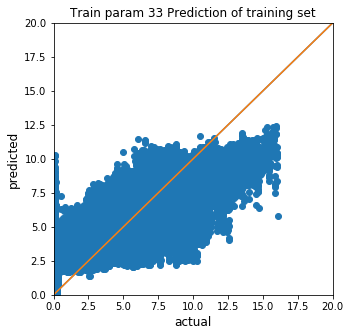

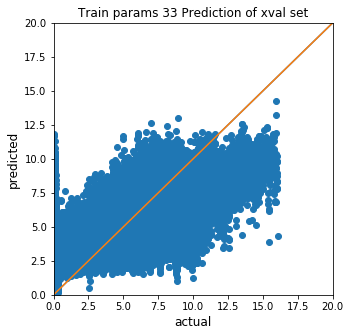

-------------------------------------------------------
Train set 34  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[295]	valid_0's l1: 1.98885	valid_1's l1: 2.11341
Train set 34  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[73]	valid_0's l1: 1.9923	valid_1's l1: 2.10254
Train set 34  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[8]	valid_0's l1: 1.99168	valid_1's l1: 2.17598
Train set 34  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[47]	valid_0's l1: 1.98084	valid_1's l1: 2.19017
Train set 34  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[1]	valid_0's l1: 2.03854	valid_1's l1: 2.00819
Train set 34  subset 0 fold 5
Training until validation 

Early stopping, best iteration is:
[12]	valid_0's l1: 1.99718	valid_1's l1: 2.05423
Train set 34  subset 2 fold 7
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[116]	valid_0's l1: 1.99395	valid_1's l1: 2.14539
Train set 34  subset 2 fold 8
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[31]	valid_0's l1: 1.99913	valid_1's l1: 2.01104
Train set 34  subset 2 fold 9
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[10]	valid_0's l1: 2.0009	valid_1's l1: 2.1904
Train set 34  subset 2 fold 10
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[27]	valid_0's l1: 1.99782	valid_1's l1: 2.10819
Train set 34  subset 2 fold 11
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[35]	valid_0's l1: 1.98474	valid_1's l1: 2.25999
Train set 34  subset 2 fo

Early stopping, best iteration is:
[430]	valid_0's l1: 1.98494	valid_1's l1: 2.03787
Train set 34  subset 4 fold 14
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[350]	valid_0's l1: 1.98726	valid_1's l1: 2.05373
Train set 34  subset 4 fold 15
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[35]	valid_0's l1: 1.97705	valid_1's l1: 2.22362
Train set 34  subset 4 fold 16
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[25]	valid_0's l1: 1.98153	valid_1's l1: 2.10443
Train set 34  subset 4 fold 17
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[13]	valid_0's l1: 1.99839	valid_1's l1: 1.82143
Train set 34  subset 4 fold 18
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4]	valid_0's l1: 1.98824	valid_1's l1: 2.256
Train set 34  subset 4

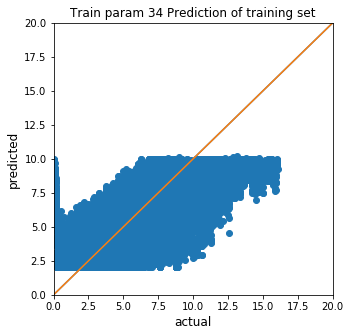

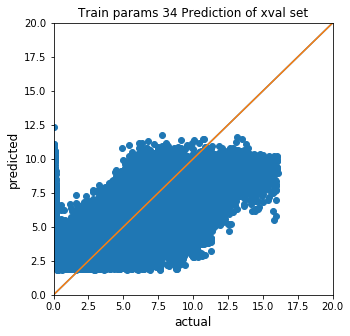

-------------------------------------------------------
Train set 35  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[41]	valid_0's l1: 1.94147	valid_1's l1: 2.20443
Train set 35  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[47]	valid_0's l1: 1.96437	valid_1's l1: 1.91768
Train set 35  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[154]	valid_0's l1: 1.95962	valid_1's l1: 1.98192
Train set 35  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[25]	valid_0's l1: 1.94621	valid_1's l1: 2.14989
Train set 35  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[9]	valid_0's l1: 1.96211	valid_1's l1: 1.96047
Train set 35  subset 0 fold 5
Training until validatio

Early stopping, best iteration is:
[30]	valid_0's l1: 1.94615	valid_1's l1: 2.17738
Train set 35  subset 2 fold 7
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[38]	valid_0's l1: 1.95007	valid_1's l1: 2.1749
Train set 35  subset 2 fold 8
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[148]	valid_0's l1: 1.95933	valid_1's l1: 2.06439
Train set 35  subset 2 fold 9
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[18]	valid_0's l1: 1.95413	valid_1's l1: 2.2502
Train set 35  subset 2 fold 10
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[30]	valid_0's l1: 1.96439	valid_1's l1: 2.03096
Train set 35  subset 2 fold 11
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[27]	valid_0's l1: 1.94583	valid_1's l1: 2.28316
Train set 35  subset 2 fo

Early stopping, best iteration is:
[29]	valid_0's l1: 1.95434	valid_1's l1: 1.96322
Train set 35  subset 4 fold 14
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3]	valid_0's l1: 1.98023	valid_1's l1: 1.96491
Train set 35  subset 4 fold 15
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[49]	valid_0's l1: 1.94865	valid_1's l1: 2.16024
Train set 35  subset 4 fold 16
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[23]	valid_0's l1: 1.9543	valid_1's l1: 1.96915
Train set 35  subset 4 fold 17
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[11]	valid_0's l1: 1.95007	valid_1's l1: 1.89441
Train set 35  subset 4 fold 18
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2]	valid_0's l1: 1.97106	valid_1's l1: 2.22606
Train set 35  subset 4 f

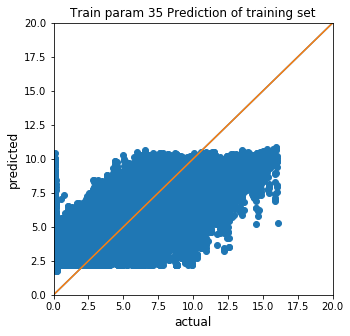

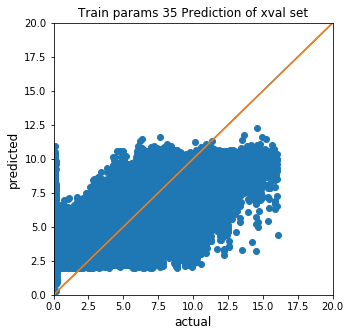

-------------------------------------------------------
Train set 36  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2467]	valid_0's l1: 1.82168	valid_1's l1: 2.14397
Train set 36  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2748]	valid_0's l1: 1.79425	valid_1's l1: 2.09314
Train set 36  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3060]	valid_0's l1: 1.76291	valid_1's l1: 2.18284
Train set 36  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2633]	valid_0's l1: 1.79301	valid_1's l1: 2.21347
Train set 36  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[1965]	valid_0's l1: 1.88414	valid_1's l1: 2.0553
Train set 36  subset 0 fold 5
Training until 

Early stopping, best iteration is:
[3159]	valid_0's l1: 1.77872	valid_1's l1: 1.98125
Train set 36  subset 2 fold 6
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3217]	valid_0's l1: 1.77228	valid_1's l1: 2.0738
Train set 36  subset 2 fold 7
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4879]	valid_0's l1: 1.64633	valid_1's l1: 2.13261
Train set 36  subset 2 fold 8
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2921]	valid_0's l1: 1.79982	valid_1's l1: 2.07912
Train set 36  subset 2 fold 9
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3851]	valid_0's l1: 1.71697	valid_1's l1: 2.25929
Train set 36  subset 2 fold 10
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3386]	valid_0's l1: 1.75832	valid_1's l1: 2.13513
Train set 36  

Train set 36  subset 4 fold 11
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2248]	valid_0's l1: 1.83393	valid_1's l1: 2.28903
Train set 36  subset 4 fold 12
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2829]	valid_0's l1: 1.7755	valid_1's l1: 2.14392
Train set 36  subset 4 fold 13
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3912]	valid_0's l1: 1.69464	valid_1's l1: 2.04523
Train set 36  subset 4 fold 14
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3945]	valid_0's l1: 1.68721	valid_1's l1: 2.05573
Train set 36  subset 4 fold 15
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2824]	valid_0's l1: 1.77385	valid_1's l1: 2.23717
Train set 36  subset 4 fold 16
Training until validation scores don't improve for 1000 rounds.
E

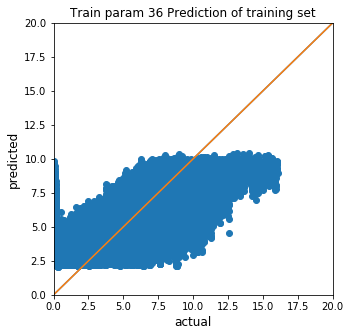

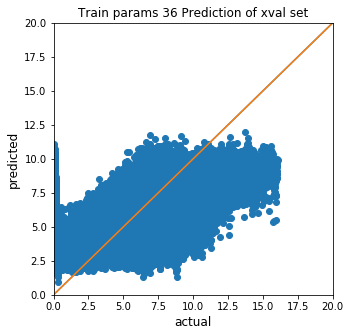

-------------------------------------------------------
Train set 37  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[5667]	valid_0's l1: 1.30712	valid_1's l1: 2.19969
Train set 37  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4003]	valid_0's l1: 1.47986	valid_1's l1: 1.87114
Train set 37  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[7172]	valid_0's l1: 1.19744	valid_1's l1: 1.95
Train set 37  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4027]	valid_0's l1: 1.46504	valid_1's l1: 2.11721
Train set 37  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
[10000]	valid_0's l1: 1.01223	valid_1's l1: 1.90276
Early stopping, best iteration is:
[10746]	valid_0's l1: 0.970016	valid_1's l1: 1

Early stopping, best iteration is:
[2786]	valid_0's l1: 1.6269	valid_1's l1: 1.9565
Train set 37  subset 2 fold 5
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4954]	valid_0's l1: 1.3861	valid_1's l1: 1.8231
Train set 37  subset 2 fold 6
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4938]	valid_0's l1: 1.37671	valid_1's l1: 2.08604
Train set 37  subset 2 fold 7
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3781]	valid_0's l1: 1.48927	valid_1's l1: 2.14567
Train set 37  subset 2 fold 8
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[8412]	valid_0's l1: 1.11762	valid_1's l1: 2.00187
Train set 37  subset 2 fold 9
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[7605]	valid_0's l1: 1.17038	valid_1's l1: 2.09803
Train set 37  subs

Early stopping, best iteration is:
[4792]	valid_0's l1: 1.39259	valid_1's l1: 2.137
Train set 37  subset 4 fold 10
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4160]	valid_0's l1: 1.44996	valid_1's l1: 2.0898
Train set 37  subset 4 fold 11
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2634]	valid_0's l1: 1.63471	valid_1's l1: 2.2756
Train set 37  subset 4 fold 12
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3630]	valid_0's l1: 1.51663	valid_1's l1: 2.05793
Train set 37  subset 4 fold 13
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3774]	valid_0's l1: 1.50361	valid_1's l1: 1.94037
Train set 37  subset 4 fold 14
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4202]	valid_0's l1: 1.45729	valid_1's l1: 1.97328
Train set 37 

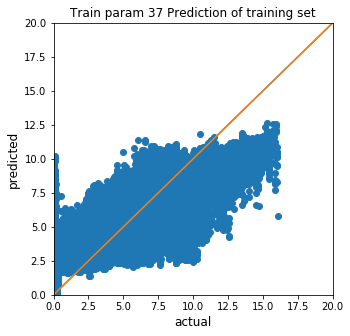

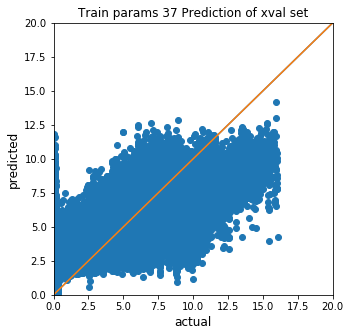

-------------------------------------------------------
Train set 38  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[21]	valid_0's l1: 1.93955	valid_1's l1: 2.11303
Train set 38  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[16]	valid_0's l1: 1.94223	valid_1's l1: 2.10192
Train set 38  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[108]	valid_0's l1: 1.9357	valid_1's l1: 2.19792
Train set 38  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[66]	valid_0's l1: 1.9254	valid_1's l1: 2.1941
Train set 38  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[24]	valid_0's l1: 1.92632	valid_1's l1: 2.05721
Train set 38  subset 0 fold 5
Training until validation 

Early stopping, best iteration is:
[55]	valid_0's l1: 1.94898	valid_1's l1: 2.04697
Train set 38  subset 2 fold 7
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[93]	valid_0's l1: 1.94407	valid_1's l1: 2.14866
Train set 38  subset 2 fold 8
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[27]	valid_0's l1: 1.94697	valid_1's l1: 2.03108
Train set 38  subset 2 fold 9
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[86]	valid_0's l1: 1.94273	valid_1's l1: 2.22123
Train set 38  subset 2 fold 10
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[12]	valid_0's l1: 1.95265	valid_1's l1: 2.12055
Train set 38  subset 2 fold 11
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[19]	valid_0's l1: 1.93613	valid_1's l1: 2.27757
Train set 38  subset 2 f

Early stopping, best iteration is:
[1]	valid_0's l1: 1.97681	valid_1's l1: 2.10247
Train set 38  subset 4 fold 13
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4]	valid_0's l1: 1.95022	valid_1's l1: 2.0223
Train set 38  subset 4 fold 14
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[15]	valid_0's l1: 1.94271	valid_1's l1: 2.0476
Train set 38  subset 4 fold 15
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[126]	valid_0's l1: 1.92074	valid_1's l1: 2.20509
Train set 38  subset 4 fold 16
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[20]	valid_0's l1: 1.92922	valid_1's l1: 2.09282
Train set 38  subset 4 fold 17
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[15]	valid_0's l1: 1.94563	valid_1's l1: 1.81053
Train set 38  subset 4 f

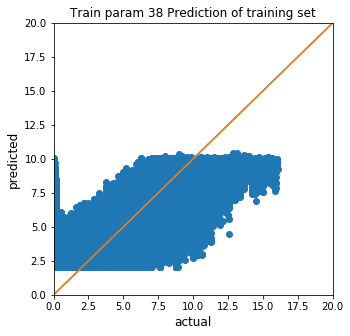

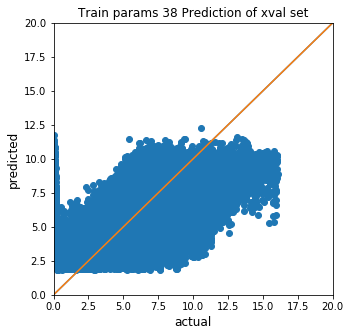

-------------------------------------------------------
Train set 39  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[26]	valid_0's l1: 1.86126	valid_1's l1: 2.21081
Train set 39  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[11]	valid_0's l1: 1.89217	valid_1's l1: 1.91251
Train set 39  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4]	valid_0's l1: 1.90572	valid_1's l1: 1.9665
Train set 39  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[17]	valid_0's l1: 1.87208	valid_1's l1: 2.11168
Train set 39  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[767]	valid_0's l1: 1.87475	valid_1's l1: 1.95978
Train set 39  subset 0 fold 5
Training until validation

Early stopping, best iteration is:
[7]	valid_0's l1: 1.878	valid_1's l1: 2.14592
Train set 39  subset 2 fold 7
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[41]	valid_0's l1: 1.86708	valid_1's l1: 2.16681
Train set 39  subset 2 fold 8
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[252]	valid_0's l1: 1.874	valid_1's l1: 2.05413
Train set 39  subset 2 fold 9
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[690]	valid_0's l1: 1.87197	valid_1's l1: 2.22607
Train set 39  subset 2 fold 10
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[52]	valid_0's l1: 1.88336	valid_1's l1: 2.01937
Train set 39  subset 2 fold 11
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[22]	valid_0's l1: 1.86247	valid_1's l1: 2.27559
Train set 39  subset 2 fold

Early stopping, best iteration is:
[9]	valid_0's l1: 1.86679	valid_1's l1: 2.02544
Train set 39  subset 4 fold 13
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[50]	valid_0's l1: 1.87492	valid_1's l1: 1.95224
Train set 39  subset 4 fold 14
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3]	valid_0's l1: 1.91582	valid_1's l1: 1.93645
Train set 39  subset 4 fold 15
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2392]	valid_0's l1: 1.86816	valid_1's l1: 2.13155
Train set 39  subset 4 fold 16
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[24]	valid_0's l1: 1.8775	valid_1's l1: 1.95294
Train set 39  subset 4 fold 17
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[10]	valid_0's l1: 1.86957	valid_1's l1: 1.89475
Train set 39  subset 4

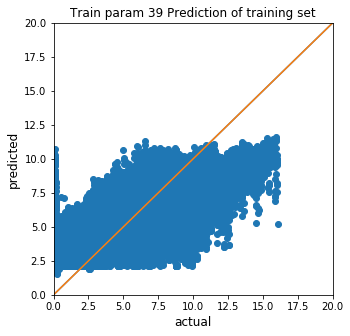

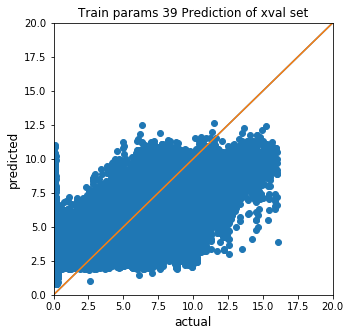

-------------------------------------------------------
Train set 40  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2263]	valid_0's l1: 1.6981	valid_1's l1: 2.1675
Train set 40  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2564]	valid_0's l1: 1.65117	valid_1's l1: 2.09925
Train set 40  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2688]	valid_0's l1: 1.63499	valid_1's l1: 2.19887
Train set 40  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[1895]	valid_0's l1: 1.75653	valid_1's l1: 2.23396
Train set 40  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[1942]	valid_0's l1: 1.75453	valid_1's l1: 2.07105
Train set 40  subset 0 fold 5
Training until v

Early stopping, best iteration is:
[2454]	valid_0's l1: 1.6945	valid_1's l1: 1.9945
Train set 40  subset 2 fold 6
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2790]	valid_0's l1: 1.64747	valid_1's l1: 2.08868
Train set 40  subset 2 fold 7
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3918]	valid_0's l1: 1.51347	valid_1's l1: 2.13737
Train set 40  subset 2 fold 8
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2817]	valid_0's l1: 1.64349	valid_1's l1: 2.1053
Train set 40  subset 2 fold 9
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3404]	valid_0's l1: 1.56829	valid_1's l1: 2.28171
Train set 40  subset 2 fold 10
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2906]	valid_0's l1: 1.63223	valid_1's l1: 2.16481
Train set 40  su

Train set 40  subset 4 fold 11
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[1946]	valid_0's l1: 1.74506	valid_1's l1: 2.31438
Train set 40  subset 4 fold 12
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3349]	valid_0's l1: 1.54276	valid_1's l1: 2.15783
Train set 40  subset 4 fold 13
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3767]	valid_0's l1: 1.51008	valid_1's l1: 2.0665
Train set 40  subset 4 fold 14
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3252]	valid_0's l1: 1.55979	valid_1's l1: 2.0709
Train set 40  subset 4 fold 15
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2555]	valid_0's l1: 1.64543	valid_1's l1: 2.24567
Train set 40  subset 4 fold 16
Training until validation scores don't improve for 1000 rounds.
Ea

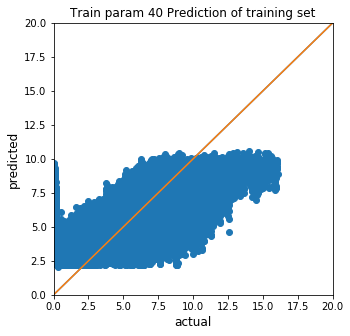

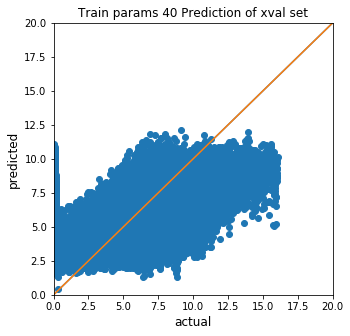

-------------------------------------------------------
Train set 41  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3982]	valid_0's l1: 1.1919	valid_1's l1: 2.20576
Train set 41  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2999]	valid_0's l1: 1.36331	valid_1's l1: 1.88236
Train set 41  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[5470]	valid_0's l1: 1.01157	valid_1's l1: 1.95647
Train set 41  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4160]	valid_0's l1: 1.16723	valid_1's l1: 2.12811
Train set 41  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[7404]	valid_0's l1: 0.826103	valid_1's l1: 1.93057
Train set 41  subset 0 fold 5
Training until

Train set 41  subset 2 fold 5
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4770]	valid_0's l1: 1.09694	valid_1's l1: 1.84328
Train set 41  subset 2 fold 6
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4224]	valid_0's l1: 1.16106	valid_1's l1: 2.07885
Train set 41  subset 2 fold 7
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3024]	valid_0's l1: 1.34141	valid_1's l1: 2.15671
Train set 41  subset 2 fold 8
Training until validation scores don't improve for 1000 rounds.
[10000]	valid_0's l1: 0.642376	valid_1's l1: 1.9868
Early stopping, best iteration is:
[17820]	valid_0's l1: 0.315285	valid_1's l1: 1.98022
Train set 41  subset 2 fold 9
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[5577]	valid_0's l1: 1.00096	valid_1's l1: 2.10269
Train set 41  subset 2 fold 10
Training until 

Train set 41  subset 4 fold 10
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3397]	valid_0's l1: 1.2841	valid_1's l1: 2.11373
Train set 41  subset 4 fold 11
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2222]	valid_0's l1: 1.50738	valid_1's l1: 2.28501
Train set 41  subset 4 fold 12
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3301]	valid_0's l1: 1.3057	valid_1's l1: 2.07626
Train set 41  subset 4 fold 13
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3586]	valid_0's l1: 1.26249	valid_1's l1: 1.96241
Train set 41  subset 4 fold 14
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3828]	valid_0's l1: 1.22677	valid_1's l1: 1.99205
Train set 41  subset 4 fold 15
Training until validation scores don't improve for 1000 rounds.
Ea

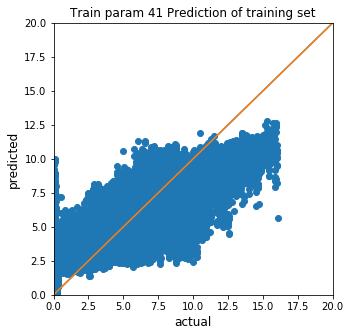

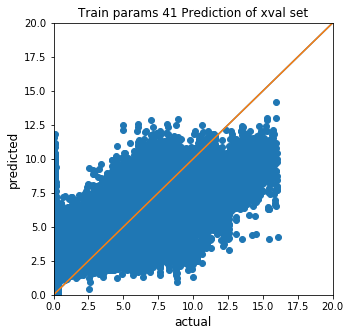

-------------------------------------------------------
Train set 42  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[85]	valid_0's l1: 1.84184	valid_1's l1: 2.13576
Train set 42  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[151]	valid_0's l1: 1.84317	valid_1's l1: 2.11474
Train set 42  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[445]	valid_0's l1: 1.84477	valid_1's l1: 2.21773
Train set 42  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[49]	valid_0's l1: 1.83042	valid_1's l1: 2.21566
Train set 42  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[15]	valid_0's l1: 1.83731	valid_1's l1: 2.05926
Train set 42  subset 0 fold 5
Training until validat

Early stopping, best iteration is:
[7]	valid_0's l1: 1.86975	valid_1's l1: 2.04443
Train set 42  subset 2 fold 7
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[154]	valid_0's l1: 1.85597	valid_1's l1: 2.15442
Train set 42  subset 2 fold 8
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[18]	valid_0's l1: 1.86167	valid_1's l1: 2.03989
Train set 42  subset 2 fold 9
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[193]	valid_0's l1: 1.8528	valid_1's l1: 2.24781
Train set 42  subset 2 fold 10
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[12]	valid_0's l1: 1.86879	valid_1's l1: 2.15224
Train set 42  subset 2 fold 11
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[93]	valid_0's l1: 1.84622	valid_1's l1: 2.30892
Train set 42  subset 2 f

Early stopping, best iteration is:
[222]	valid_0's l1: 1.83062	valid_1's l1: 2.15503
Train set 42  subset 4 fold 13
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[131]	valid_0's l1: 1.83971	valid_1's l1: 2.04643
Train set 42  subset 4 fold 14
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[59]	valid_0's l1: 1.84412	valid_1's l1: 2.05049
Train set 42  subset 4 fold 15
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[121]	valid_0's l1: 1.82906	valid_1's l1: 2.21043
Train set 42  subset 4 fold 16
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[58]	valid_0's l1: 1.83231	valid_1's l1: 2.12646
Train set 42  subset 4 fold 17
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[34]	valid_0's l1: 1.85072	valid_1's l1: 1.81813
Train set 42  subs

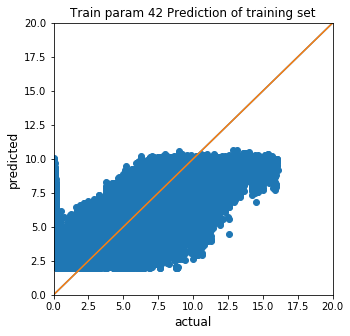

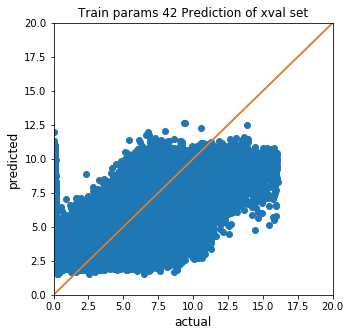

-------------------------------------------------------
Train set 43  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[10]	valid_0's l1: 1.74364	valid_1's l1: 2.21429
Train set 43  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[10]	valid_0's l1: 1.77547	valid_1's l1: 1.88716
Train set 43  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2]	valid_0's l1: 1.8176	valid_1's l1: 1.96113
Train set 43  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[27]	valid_0's l1: 1.74454	valid_1's l1: 2.087
Train set 43  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[11]	valid_0's l1: 1.751	valid_1's l1: 1.95754
Train set 43  subset 0 fold 5
Training until validation scor

Early stopping, best iteration is:
[742]	valid_0's l1: 1.7329	valid_1's l1: 2.10686
Train set 43  subset 2 fold 7
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[119]	valid_0's l1: 1.73408	valid_1's l1: 2.15146
Train set 43  subset 2 fold 8
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[223]	valid_0's l1: 1.73688	valid_1's l1: 2.04091
Train set 43  subset 2 fold 9
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[693]	valid_0's l1: 1.74057	valid_1's l1: 2.20106
Train set 43  subset 2 fold 10
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[41]	valid_0's l1: 1.74683	valid_1's l1: 2.00104
Train set 43  subset 2 fold 11
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[22]	valid_0's l1: 1.72444	valid_1's l1: 2.28729
Train set 43  subset 

Early stopping, best iteration is:
[27]	valid_0's l1: 1.72345	valid_1's l1: 2.05092
Train set 43  subset 4 fold 13
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[12]	valid_0's l1: 1.75388	valid_1's l1: 1.91812
Train set 43  subset 4 fold 14
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[41]	valid_0's l1: 1.73768	valid_1's l1: 1.976
Train set 43  subset 4 fold 15
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[34]	valid_0's l1: 1.7454	valid_1's l1: 2.11309
Train set 43  subset 4 fold 16
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[256]	valid_0's l1: 1.74704	valid_1's l1: 1.90525
Train set 43  subset 4 fold 17
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[7]	valid_0's l1: 1.74645	valid_1's l1: 1.86658
Train set 43  subset 4 f

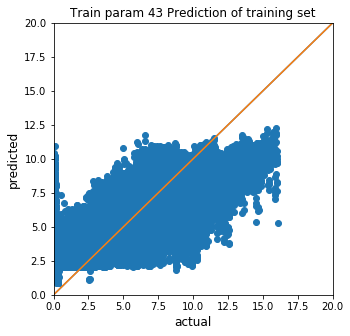

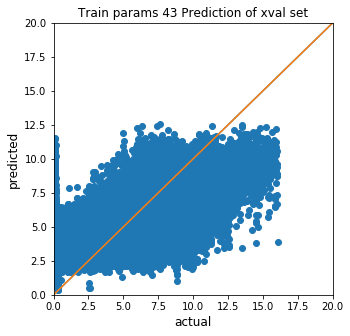

-------------------------------------------------------
Train set 44  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2203]	valid_0's l1: 1.61766	valid_1's l1: 2.18085
Train set 44  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2211]	valid_0's l1: 1.61631	valid_1's l1: 2.10301
Train set 44  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2543]	valid_0's l1: 1.55697	valid_1's l1: 2.20905
Train set 44  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[1813]	valid_0's l1: 1.69403	valid_1's l1: 2.24293
Train set 44  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[1711]	valid_0's l1: 1.72661	valid_1's l1: 2.07845
Train set 44  subset 0 fold 5
Training until

Early stopping, best iteration is:
[2452]	valid_0's l1: 1.60002	valid_1's l1: 2.00478
Train set 44  subset 2 fold 6
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2980]	valid_0's l1: 1.51789	valid_1's l1: 2.10001
Train set 44  subset 2 fold 7
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3371]	valid_0's l1: 1.45983	valid_1's l1: 2.14239
Train set 44  subset 2 fold 8
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2860]	valid_0's l1: 1.53393	valid_1's l1: 2.11613
Train set 44  subset 2 fold 9
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3421]	valid_0's l1: 1.45382	valid_1's l1: 2.29645
Train set 44  subset 2 fold 10
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2927]	valid_0's l1: 1.52615	valid_1's l1: 2.18277
Train set 44 

Train set 44  subset 4 fold 11
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[1898]	valid_0's l1: 1.675	valid_1's l1: 2.32909
Train set 44  subset 4 fold 12
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3104]	valid_0's l1: 1.46336	valid_1's l1: 2.16322
Train set 44  subset 4 fold 13
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3351]	valid_0's l1: 1.44306	valid_1's l1: 2.07496
Train set 44  subset 4 fold 14
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3180]	valid_0's l1: 1.45922	valid_1's l1: 2.08234
Train set 44  subset 4 fold 15
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2144]	valid_0's l1: 1.6241	valid_1's l1: 2.25087
Train set 44  subset 4 fold 16
Training until validation scores don't improve for 1000 rounds.
Ear

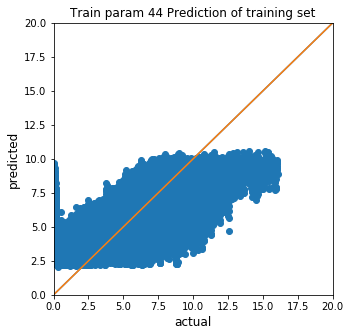

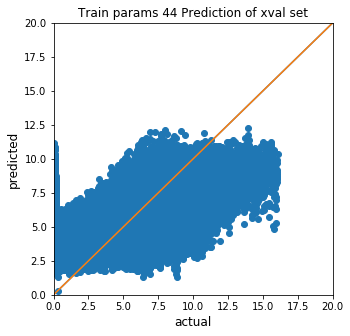

-------------------------------------------------------
Train set 45  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3970]	valid_0's l1: 1.03714	valid_1's l1: 2.20123
Train set 45  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2793]	valid_0's l1: 1.26677	valid_1's l1: 1.89088
Train set 45  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4663]	valid_0's l1: 0.940026	valid_1's l1: 1.95835
Train set 45  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2926]	valid_0's l1: 1.22942	valid_1's l1: 2.13205
Train set 45  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3777]	valid_0's l1: 1.07428	valid_1's l1: 1.94133
Train set 45  subset 0 fold 5
Training unti

Early stopping, best iteration is:
[3727]	valid_0's l1: 1.08506	valid_1's l1: 1.85579
Train set 45  subset 2 fold 6
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4184]	valid_0's l1: 1.00639	valid_1's l1: 2.08439
Train set 45  subset 2 fold 7
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2954]	valid_0's l1: 1.21612	valid_1's l1: 2.15723
Train set 45  subset 2 fold 8
Training until validation scores don't improve for 1000 rounds.
[10000]	valid_0's l1: 0.466345	valid_1's l1: 1.98826
Early stopping, best iteration is:
[17305]	valid_0's l1: 0.198345	valid_1's l1: 1.98289
Train set 45  subset 2 fold 9
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[6157]	valid_0's l1: 0.763721	valid_1's l1: 2.09753
Train set 45  subset 2 fold 10
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3574]	v

Early stopping, best iteration is:
[3105]	valid_0's l1: 1.19337	valid_1's l1: 2.12836
Train set 45  subset 4 fold 11
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2146]	valid_0's l1: 1.41263	valid_1's l1: 2.29431
Train set 45  subset 4 fold 12
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3302]	valid_0's l1: 1.16007	valid_1's l1: 2.08315
Train set 45  subset 4 fold 13
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3270]	valid_0's l1: 1.16789	valid_1's l1: 1.97948
Train set 45  subset 4 fold 14
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4024]	valid_0's l1: 1.04034	valid_1's l1: 2.00511
Train set 45  subset 4 fold 15
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4297]	valid_0's l1: 0.996608	valid_1's l1: 2.07304
Train se

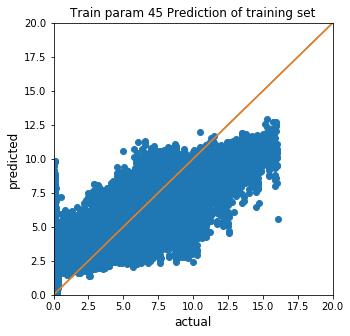

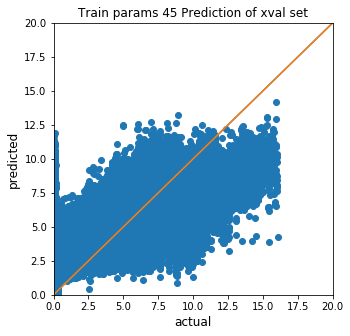

-------------------------------------------------------
Train set 46  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[86]	valid_0's l1: 1.77991	valid_1's l1: 2.14941
Train set 46  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[73]	valid_0's l1: 1.78385	valid_1's l1: 2.11222
Train set 46  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[258]	valid_0's l1: 1.78514	valid_1's l1: 2.22322
Train set 46  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[45]	valid_0's l1: 1.77127	valid_1's l1: 2.22967
Train set 46  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[14]	valid_0's l1: 1.77672	valid_1's l1: 2.05761
Train set 46  subset 0 fold 5
Training until validati

Early stopping, best iteration is:
[15]	valid_0's l1: 1.81581	valid_1's l1: 2.04839
Train set 46  subset 2 fold 7
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[734]	valid_0's l1: 1.79611	valid_1's l1: 2.16202
Train set 46  subset 2 fold 8
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[16]	valid_0's l1: 1.80398	valid_1's l1: 2.05366
Train set 46  subset 2 fold 9
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[190]	valid_0's l1: 1.79394	valid_1's l1: 2.25466
Train set 46  subset 2 fold 10
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[134]	valid_0's l1: 1.80143	valid_1's l1: 2.18175
Train set 46  subset 2 fold 11
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[76]	valid_0's l1: 1.78793	valid_1's l1: 2.32638
Train set 46  subset 

Early stopping, best iteration is:
[371]	valid_0's l1: 1.76913	valid_1's l1: 2.16341
Train set 46  subset 4 fold 13
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[67]	valid_0's l1: 1.78234	valid_1's l1: 2.0497
Train set 46  subset 4 fold 14
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[62]	valid_0's l1: 1.78289	valid_1's l1: 2.05191
Train set 46  subset 4 fold 15
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[137]	valid_0's l1: 1.77016	valid_1's l1: 2.21781
Train set 46  subset 4 fold 16
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4]	valid_0's l1: 1.80642	valid_1's l1: 2.118
Train set 46  subset 4 fold 17
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[47]	valid_0's l1: 1.78991	valid_1's l1: 1.83119
Train set 46  subset 4 

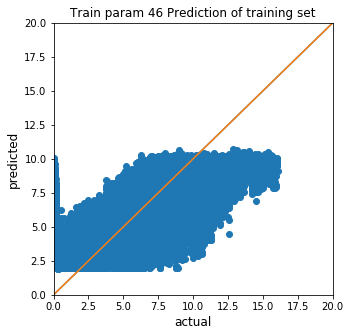

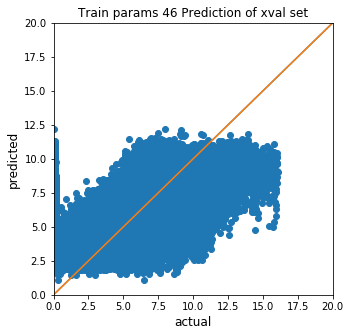

-------------------------------------------------------
Train set 47  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[22]	valid_0's l1: 1.65069	valid_1's l1: 2.20807
Train set 47  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[39]	valid_0's l1: 1.68058	valid_1's l1: 1.87275
Train set 47  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[1424]	valid_0's l1: 1.66417	valid_1's l1: 1.98779
Train set 47  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[27]	valid_0's l1: 1.66617	valid_1's l1: 2.06941
Train set 47  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[234]	valid_0's l1: 1.66238	valid_1's l1: 1.96815
Train set 47  subset 0 fold 5
Training until valida

Early stopping, best iteration is:
[39]	valid_0's l1: 1.65415	valid_1's l1: 2.07521
Train set 47  subset 2 fold 7
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[115]	valid_0's l1: 1.65028	valid_1's l1: 2.15044
Train set 47  subset 2 fold 8
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[223]	valid_0's l1: 1.65335	valid_1's l1: 2.03289
Train set 47  subset 2 fold 9
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[693]	valid_0's l1: 1.6585	valid_1's l1: 2.19084
Train set 47  subset 2 fold 10
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[48]	valid_0's l1: 1.66168	valid_1's l1: 2.0073
Train set 47  subset 2 fold 11
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[287]	valid_0's l1: 1.63737	valid_1's l1: 2.2839
Train set 47  subset 2 

Early stopping, best iteration is:
[27]	valid_0's l1: 1.64429	valid_1's l1: 2.07198
Train set 47  subset 4 fold 13
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[191]	valid_0's l1: 1.66139	valid_1's l1: 1.92095
Train set 47  subset 4 fold 14
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[47]	valid_0's l1: 1.6556	valid_1's l1: 1.96949
Train set 47  subset 4 fold 15
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[53]	valid_0's l1: 1.65938	valid_1's l1: 2.1031
Train set 47  subset 4 fold 16
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[256]	valid_0's l1: 1.66554	valid_1's l1: 1.89632
Train set 47  subset 4 fold 17
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[7]	valid_0's l1: 1.66504	valid_1's l1: 1.84867
Train set 47  subset 4

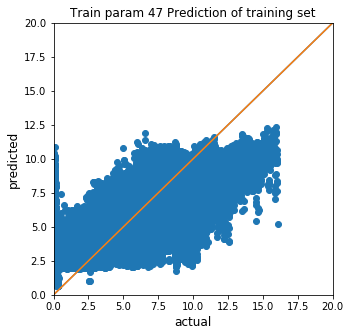

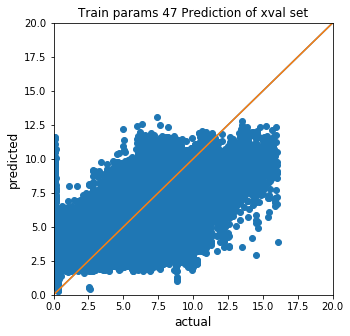

-------------------------------------------------------
Train set 48  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2552]	valid_0's l1: 1.82684	valid_1's l1: 2.1377
Train set 48  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2841]	valid_0's l1: 1.81183	valid_1's l1: 2.08854
Train set 48  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3784]	valid_0's l1: 1.7364	valid_1's l1: 2.12785
Train set 48  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4132]	valid_0's l1: 1.71264	valid_1's l1: 2.11227
Train set 48  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4418]	valid_0's l1: 1.70048	valid_1's l1: 2.0948
Train set 48  subset 1 fold 0
Training until va

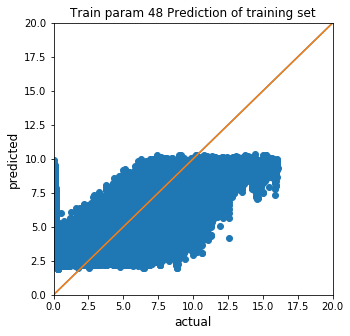

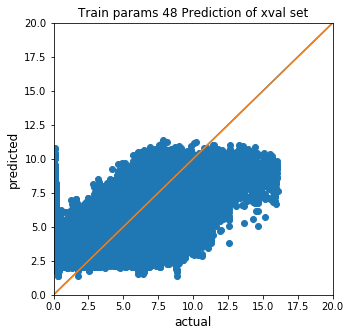

-------------------------------------------------------
Train set 49  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3786]	valid_0's l1: 1.55546	valid_1's l1: 2.01544
Train set 49  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4730]	valid_0's l1: 1.47204	valid_1's l1: 1.951
Train set 49  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
[10000]	valid_0's l1: 1.14896	valid_1's l1: 1.96257
Early stopping, best iteration is:
[10829]	valid_0's l1: 1.10585	valid_1's l1: 1.96187
Train set 49  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[6153]	valid_0's l1: 1.37269	valid_1's l1: 1.98508
Train set 49  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[5137]	valid_0's l1: 1.45174	valid_1's l1: 2

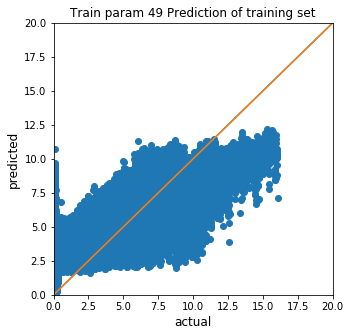

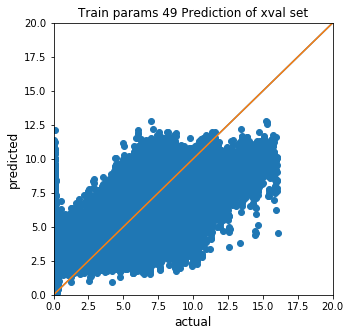

-------------------------------------------------------
Train set 50  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[486]	valid_0's l1: 1.93818	valid_1's l1: 2.13332
Train set 50  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[52]	valid_0's l1: 1.95094	valid_1's l1: 2.06865
Train set 50  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[28]	valid_0's l1: 1.95788	valid_1's l1: 2.10174
Train set 50  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[305]	valid_0's l1: 1.94254	valid_1's l1: 2.10009
Train set 50  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4]	valid_0's l1: 1.98306	valid_1's l1: 2.07804
Train set 50  subset 1 fold 0
Training until validati

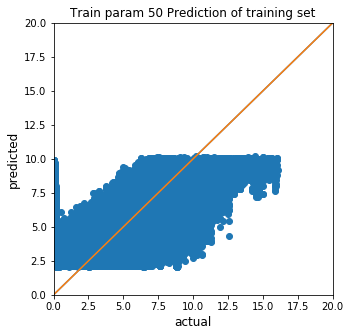

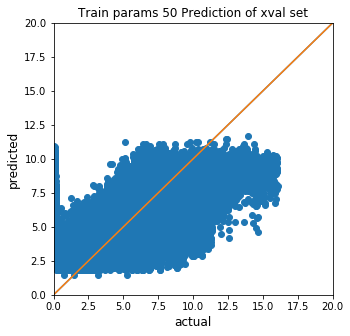

-------------------------------------------------------
Train set 51  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[54]	valid_0's l1: 1.85838	valid_1's l1: 2.06304
Train set 51  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[39]	valid_0's l1: 1.86705	valid_1's l1: 1.98811
Train set 51  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[72]	valid_0's l1: 1.86529	valid_1's l1: 2.0362
Train set 51  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[35]	valid_0's l1: 1.86562	valid_1's l1: 2.0237
Train set 51  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[85]	valid_0's l1: 1.8686	valid_1's l1: 2.05573
Train set 51  subset 1 fold 0
Training until validation s

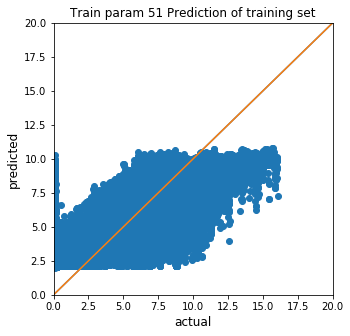

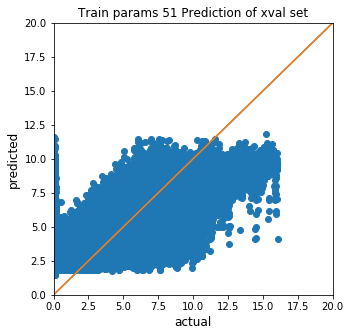

-------------------------------------------------------
Train set 52  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2365]	valid_0's l1: 1.72019	valid_1's l1: 2.15162
Train set 52  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2443]	valid_0's l1: 1.72143	valid_1's l1: 2.1022
Train set 52  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3109]	valid_0's l1: 1.63821	valid_1's l1: 2.14051
Train set 52  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3851]	valid_0's l1: 1.5619	valid_1's l1: 2.1204
Train set 52  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4162]	valid_0's l1: 1.53822	valid_1's l1: 2.10285
Train set 52  subset 1 fold 0
Training until va

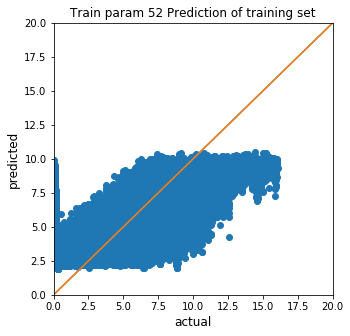

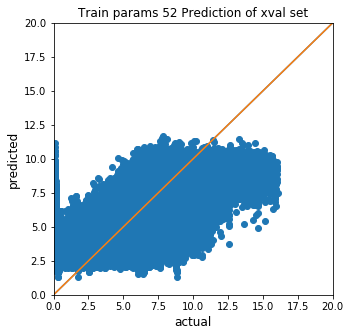

-------------------------------------------------------
Train set 53  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3209]	valid_0's l1: 1.42999	valid_1's l1: 2.01548
Train set 53  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3642]	valid_0's l1: 1.37001	valid_1's l1: 1.95836
Train set 53  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
[10000]	valid_0's l1: 0.836242	valid_1's l1: 1.96102
Early stopping, best iteration is:
[9710]	valid_0's l1: 0.854231	valid_1's l1: 1.96061
Train set 53  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[5267]	valid_0's l1: 1.19221	valid_1's l1: 1.99134
Train set 53  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4053]	valid_0's l1: 1.32862	valid_1's l1

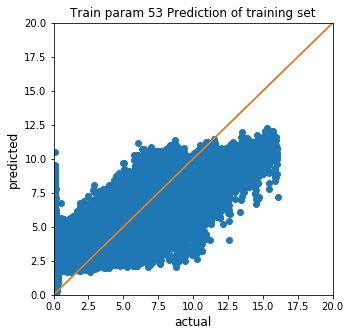

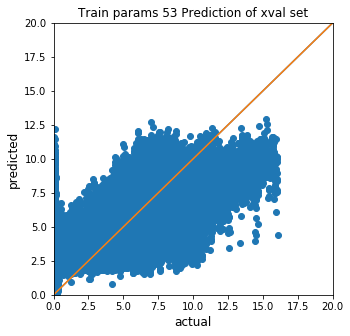

-------------------------------------------------------
Train set 54  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[486]	valid_0's l1: 1.85988	valid_1's l1: 2.14368
Train set 54  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[52]	valid_0's l1: 1.874	valid_1's l1: 2.07422
Train set 54  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[36]	valid_0's l1: 1.88001	valid_1's l1: 2.11125
Train set 54  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[335]	valid_0's l1: 1.86866	valid_1's l1: 2.09923
Train set 54  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[76]	valid_0's l1: 1.89017	valid_1's l1: 2.0959
Train set 54  subset 1 fold 0
Training until validation

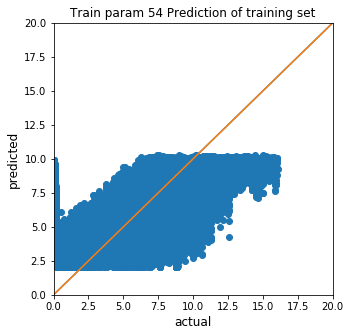

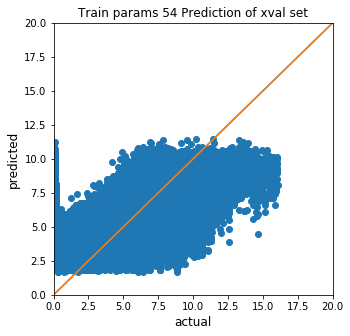

-------------------------------------------------------
Train set 55  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[73]	valid_0's l1: 1.76228	valid_1's l1: 2.04494
Train set 55  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[39]	valid_0's l1: 1.76877	valid_1's l1: 1.97455
Train set 55  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[72]	valid_0's l1: 1.77083	valid_1's l1: 2.02457
Train set 55  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[30]	valid_0's l1: 1.77124	valid_1's l1: 2.01134
Train set 55  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[153]	valid_0's l1: 1.77436	valid_1's l1: 2.03613
Train set 55  subset 1 fold 0
Training until validati

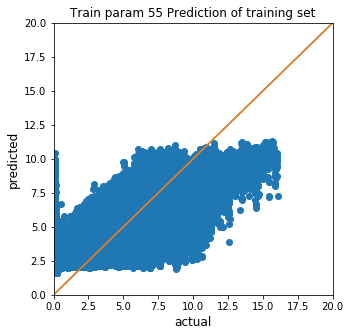

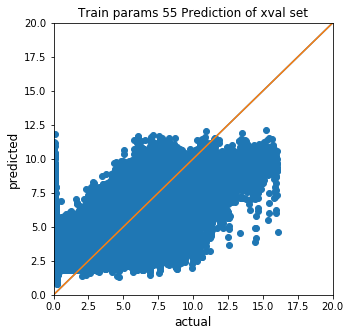

-------------------------------------------------------
Train set 56  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2363]	valid_0's l1: 1.51705	valid_1's l1: 2.16838
Train set 56  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2397]	valid_0's l1: 1.52148	valid_1's l1: 2.11822
Train set 56  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2840]	valid_0's l1: 1.442	valid_1's l1: 2.16057
Train set 56  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3244]	valid_0's l1: 1.38415	valid_1's l1: 2.13731
Train set 56  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3261]	valid_0's l1: 1.38596	valid_1's l1: 2.11405
Train set 56  subset 1 fold 0
Training until v

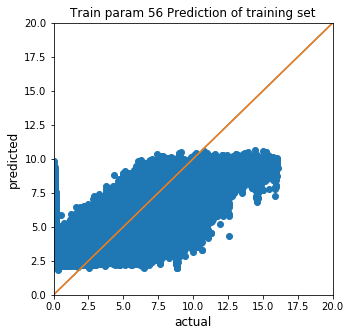

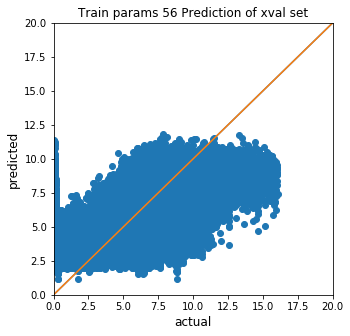

-------------------------------------------------------
Train set 57  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2773]	valid_0's l1: 1.23962	valid_1's l1: 2.01844
Train set 57  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3375]	valid_0's l1: 1.11782	valid_1's l1: 1.96721
Train set 57  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[6141]	valid_0's l1: 0.764351	valid_1's l1: 1.96635
Train set 57  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4461]	valid_0's l1: 0.956093	valid_1's l1: 2.00765
Train set 57  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3728]	valid_0's l1: 1.07202	valid_1's l1: 2.00627
Train set 57  subset 1 fold 0
Training unt

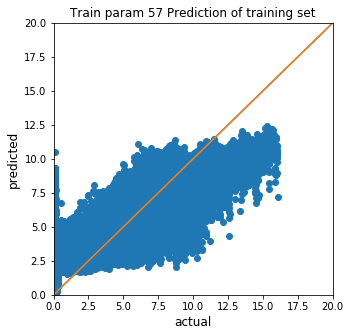

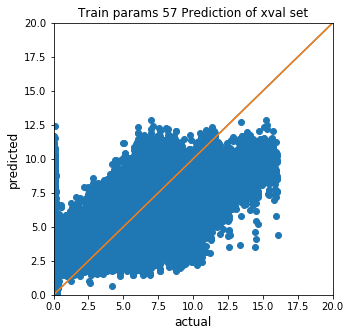

-------------------------------------------------------
Train set 58  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[537]	valid_0's l1: 1.72828	valid_1's l1: 2.15342
Train set 58  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[53]	valid_0's l1: 1.74004	valid_1's l1: 2.09066
Train set 58  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[107]	valid_0's l1: 1.74624	valid_1's l1: 2.13324
Train set 58  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[74]	valid_0's l1: 1.74528	valid_1's l1: 2.11356
Train set 58  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[80]	valid_0's l1: 1.76083	valid_1's l1: 2.09572
Train set 58  subset 1 fold 0
Training until validat

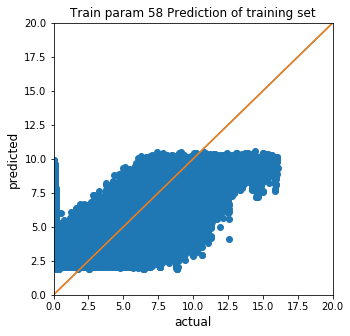

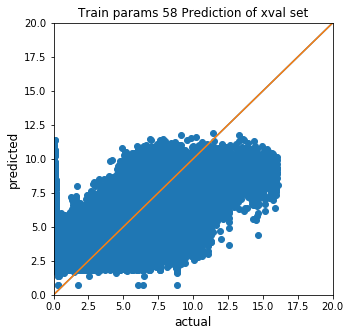

-------------------------------------------------------
Train set 59  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[262]	valid_0's l1: 1.61315	valid_1's l1: 2.03172
Train set 59  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[42]	valid_0's l1: 1.61262	valid_1's l1: 1.97067
Train set 59  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[80]	valid_0's l1: 1.6167	valid_1's l1: 2.0071
Train set 59  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[30]	valid_0's l1: 1.62294	valid_1's l1: 2.01048
Train set 59  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[41]	valid_0's l1: 1.62441	valid_1's l1: 2.01193
Train set 59  subset 1 fold 0
Training until validation

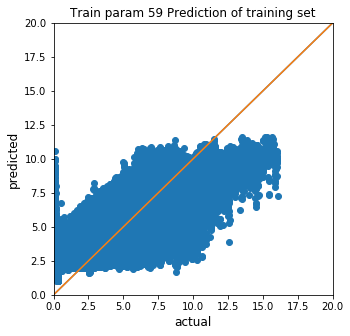

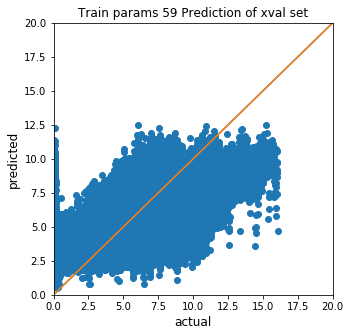

-------------------------------------------------------
Train set 60  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2191]	valid_0's l1: 1.4365	valid_1's l1: 2.17517
Train set 60  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2149]	valid_0's l1: 1.45607	valid_1's l1: 2.12763
Train set 60  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2843]	valid_0's l1: 1.30578	valid_1's l1: 2.17259
Train set 60  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3094]	valid_0's l1: 1.26668	valid_1's l1: 2.1482
Train set 60  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2989]	valid_0's l1: 1.28933	valid_1's l1: 2.12073
Train set 60  subset 1 fold 0
Training until v

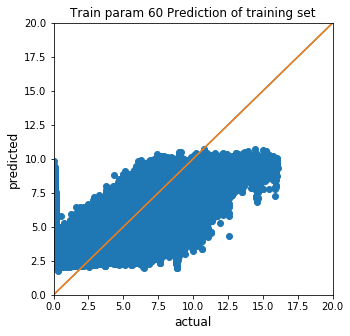

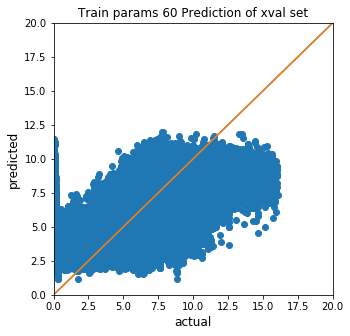

-------------------------------------------------------
Train set 61  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2632]	valid_0's l1: 1.12929	valid_1's l1: 2.02119
Train set 61  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2947]	valid_0's l1: 1.05148	valid_1's l1: 1.9725
Train set 61  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[5586]	valid_0's l1: 0.645378	valid_1's l1: 1.97067
Train set 61  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4052]	valid_0's l1: 0.848615	valid_1's l1: 2.01474
Train set 61  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3742]	valid_0's l1: 0.906056	valid_1's l1: 2.00477
Train set 61  subset 1 fold 0
Training unt

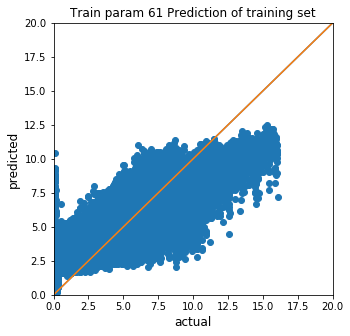

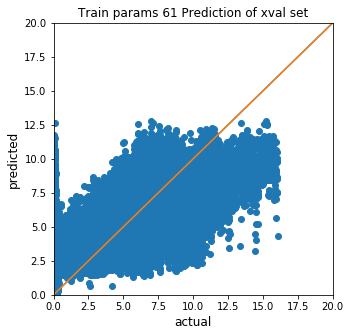

-------------------------------------------------------
Train set 62  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[537]	valid_0's l1: 1.64611	valid_1's l1: 2.15862
Train set 62  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[69]	valid_0's l1: 1.65539	valid_1's l1: 2.09597
Train set 62  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[123]	valid_0's l1: 1.66457	valid_1's l1: 2.13731
Train set 62  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[80]	valid_0's l1: 1.66386	valid_1's l1: 2.11805
Train set 62  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[80]	valid_0's l1: 1.67814	valid_1's l1: 2.09327
Train set 62  subset 1 fold 0
Training until validat

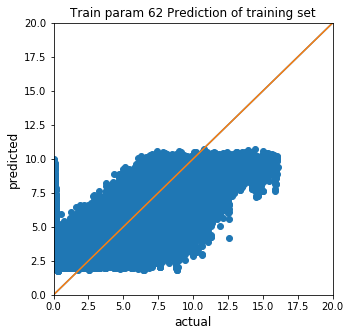

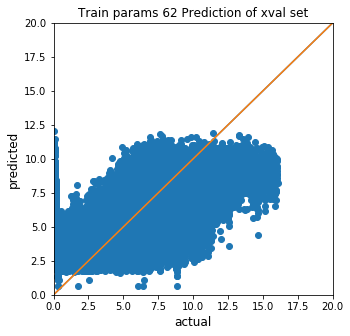

-------------------------------------------------------
Train set 63  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[262]	valid_0's l1: 1.52005	valid_1's l1: 2.029
Train set 63  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[371]	valid_0's l1: 1.52035	valid_1's l1: 1.96862
Train set 63  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[72]	valid_0's l1: 1.52296	valid_1's l1: 2.00713
Train set 63  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[32]	valid_0's l1: 1.5311	valid_1's l1: 2.00998
Train set 63  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[41]	valid_0's l1: 1.53264	valid_1's l1: 2.00587
Train set 63  subset 1 fold 0
Training until validation

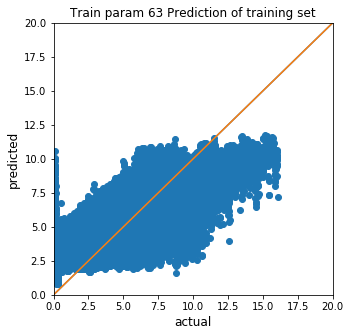

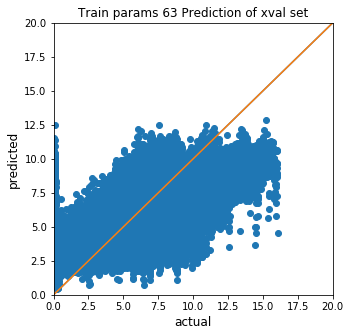

-------------------------------------------------------
Train set 64  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[5153]	valid_0's l1: 1.52488	valid_1's l1: 3.69706
Train set 64  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2344]	valid_0's l1: 1.75755	valid_1's l1: 3.34499
Train set 64  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[8206]	valid_0's l1: 1.47955	valid_1's l1: 2.65045
Train set 64  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[6857]	valid_0's l1: 1.60731	valid_1's l1: 1.89219
Train set 64  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[5517]	valid_0's l1: 1.70137	valid_1's l1: 1.55421
Train set 64  subset 0 fold 5
Training until

Early stopping, best iteration is:
[6901]	valid_0's l1: 1.61011	valid_1's l1: 1.84782
Train set 64  subset 3 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4426]	valid_0's l1: 1.76597	valid_1's l1: 1.58049
Train set 64  subset 3 fold 5
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4599]	valid_0's l1: 1.7761	valid_1's l1: 1.28354
Train set 64  subset 3 fold 6
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[6143]	valid_0's l1: 1.70142	valid_1's l1: 1.08917
Train set 64  subset 3 fold 7
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2067]	valid_0's l1: 1.98011	valid_1's l1: 1.30704
Train set 64  subset 3 fold 8
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[1390]	valid_0's l1: 2.08318	valid_1's l1: 1.53139
Train set 64  s

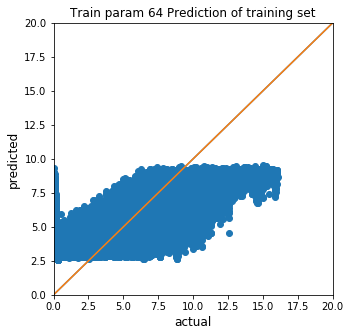

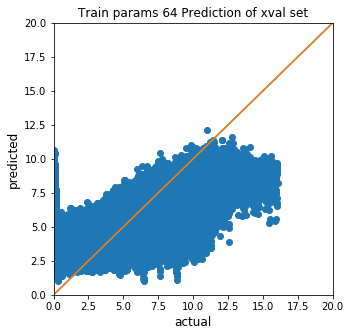

-------------------------------------------------------
Train set 65  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[6058]	valid_0's l1: 1.29565	valid_1's l1: 3.51961
Train set 65  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
[10000]	valid_0's l1: 1.13953	valid_1's l1: 3.05738
Early stopping, best iteration is:
[17583]	valid_0's l1: 0.840979	valid_1's l1: 3.04654
Train set 65  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
[10000]	valid_0's l1: 1.16177	valid_1's l1: 2.67179
Early stopping, best iteration is:
[11138]	valid_0's l1: 1.1077	valid_1's l1: 2.6703
Train set 65  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3784]	valid_0's l1: 1.59043	valid_1's l1: 2.09355
Train set 65  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iter

Train set 65  subset 3 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4453]	valid_0's l1: 1.4923	valid_1's l1: 2.77008
Train set 65  subset 3 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[8017]	valid_0's l1: 1.32355	valid_1's l1: 2.01404
Train set 65  subset 3 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4761]	valid_0's l1: 1.56562	valid_1's l1: 1.48932
Train set 65  subset 3 fold 5
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4050]	valid_0's l1: 1.62728	valid_1's l1: 1.38894
Train set 65  subset 3 fold 6
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3992]	valid_0's l1: 1.6438	valid_1's l1: 1.17731
Train set 65  subset 3 fold 7
Training until validation scores don't improve for 1000 rounds.
Early st

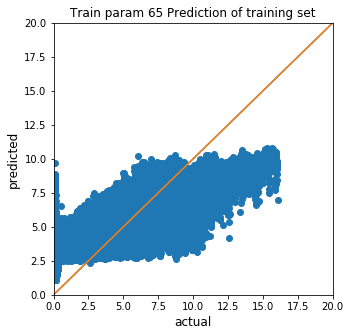

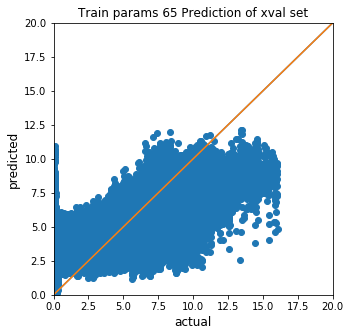

-------------------------------------------------------
Train set 66  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[20]	valid_0's l1: 1.78764	valid_1's l1: 3.65922
Train set 66  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[117]	valid_0's l1: 1.83338	valid_1's l1: 3.33654
Train set 66  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[10]	valid_0's l1: 1.90674	valid_1's l1: 2.64872
Train set 66  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2]	valid_0's l1: 2.00373	valid_1's l1: 1.83567
Train set 66  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[12]	valid_0's l1: 2.01262	valid_1's l1: 1.5365
Train set 66  subset 0 fold 5
Training until validation

Early stopping, best iteration is:
[7]	valid_0's l1: 2.0291	valid_1's l1: 1.48776
Train set 66  subset 3 fold 5
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[61]	valid_0's l1: 2.03212	valid_1's l1: 1.23912
Train set 66  subset 3 fold 6
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[90]	valid_0's l1: 2.03562	valid_1's l1: 1.11904
Train set 66  subset 3 fold 7
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[54]	valid_0's l1: 2.02513	valid_1's l1: 1.35697
Train set 66  subset 3 fold 8
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[66]	valid_0's l1: 2.00837	valid_1's l1: 1.65204
Train set 66  subset 3 fold 9
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[56]	valid_0's l1: 2.00072	valid_1's l1: 1.80939
Train set 66  subset 3 fold 

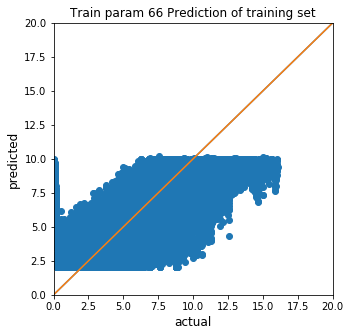

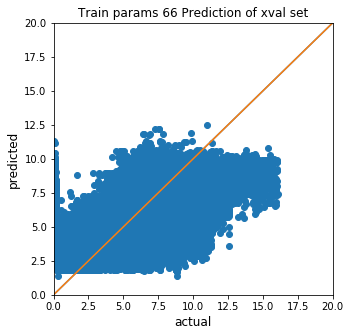

-------------------------------------------------------
Train set 67  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[165]	valid_0's l1: 1.70725	valid_1's l1: 3.52557
Train set 67  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[72]	valid_0's l1: 1.76973	valid_1's l1: 3.27047
Train set 67  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[5]	valid_0's l1: 1.83586	valid_1's l1: 2.7327
Train set 67  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[372]	valid_0's l1: 1.88058	valid_1's l1: 2.08602
Train set 67  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[67]	valid_0's l1: 1.92097	valid_1's l1: 1.50536
Train set 67  subset 0 fold 5
Training until validatio

Early stopping, best iteration is:
[78]	valid_0's l1: 1.92083	valid_1's l1: 1.43746
Train set 67  subset 3 fold 5
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[5]	valid_0's l1: 1.93659	valid_1's l1: 1.36901
Train set 67  subset 3 fold 6
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2]	valid_0's l1: 1.97855	valid_1's l1: 1.17885
Train set 67  subset 3 fold 7
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[95]	valid_0's l1: 1.92752	valid_1's l1: 1.32211
Train set 67  subset 3 fold 8
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[66]	valid_0's l1: 1.90991	valid_1's l1: 2.38654
Train set 67  subset 3 fold 9
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[72]	valid_0's l1: 1.91401	valid_1's l1: 1.53367
Train set 67  subset 3 fold 

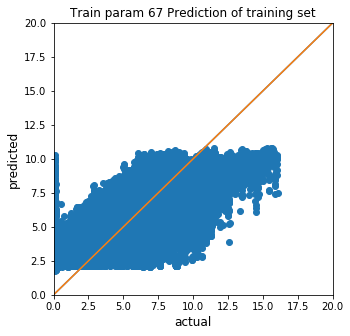

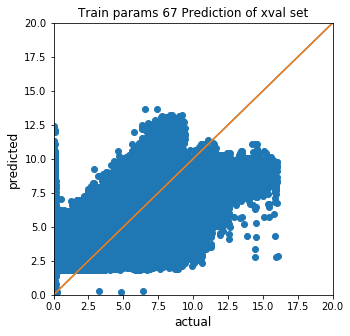

-------------------------------------------------------
Train set 68  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3710]	valid_0's l1: 1.46492	valid_1's l1: 3.69782
Train set 68  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2148]	valid_0's l1: 1.67783	valid_1's l1: 3.34652
Train set 68  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[6584]	valid_0's l1: 1.34579	valid_1's l1: 2.65084
Train set 68  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[6518]	valid_0's l1: 1.40737	valid_1's l1: 1.90463
Train set 68  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[5621]	valid_0's l1: 1.49353	valid_1's l1: 1.55497
Train set 68  subset 0 fold 5
Training until

Early stopping, best iteration is:
[6560]	valid_0's l1: 1.41546	valid_1's l1: 1.84818
Train set 68  subset 3 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3939]	valid_0's l1: 1.63434	valid_1's l1: 1.60944
Train set 68  subset 3 fold 5
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4141]	valid_0's l1: 1.63748	valid_1's l1: 1.30835
Train set 68  subset 3 fold 6
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[5488]	valid_0's l1: 1.53906	valid_1's l1: 1.1037
Train set 68  subset 3 fold 7
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2071]	valid_0's l1: 1.87604	valid_1's l1: 1.32679
Train set 68  subset 3 fold 8
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[1351]	valid_0's l1: 2.02029	valid_1's l1: 1.54646
Train set 68  s

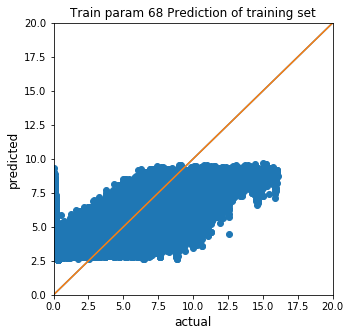

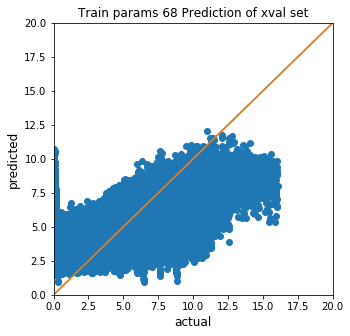

-------------------------------------------------------
Train set 69  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[5509]	valid_0's l1: 1.11338	valid_1's l1: 3.52824
Train set 69  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
[10000]	valid_0's l1: 0.855004	valid_1's l1: 3.05547
Early stopping, best iteration is:
[9705]	valid_0's l1: 0.871698	valid_1's l1: 3.05469
Train set 69  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[7769]	valid_0's l1: 1.01139	valid_1's l1: 2.67673
Train set 69  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4122]	valid_0's l1: 1.36367	valid_1's l1: 2.09225
Train set 69  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4590]	valid_0's l1: 1.3459	valid_1's l1:

Train set 69  subset 3 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[6908]	valid_0's l1: 1.12461	valid_1's l1: 2.01019
Train set 69  subset 3 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4838]	valid_0's l1: 1.33699	valid_1's l1: 1.49703
Train set 69  subset 3 fold 5
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4145]	valid_0's l1: 1.41425	valid_1's l1: 1.39665
Train set 69  subset 3 fold 6
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4189]	valid_0's l1: 1.41923	valid_1's l1: 1.20269
Train set 69  subset 3 fold 7
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2097]	valid_0's l1: 1.72043	valid_1's l1: 1.29738
Train set 69  subset 3 fold 8
Training until validation scores don't improve for 1000 rounds.
Early 

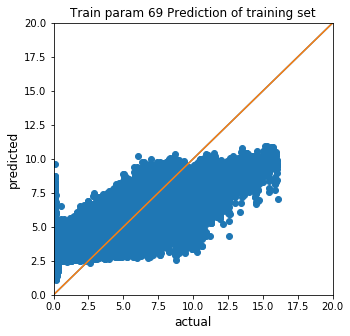

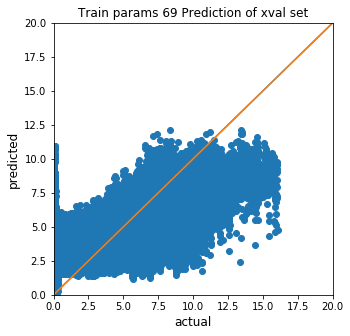

-------------------------------------------------------
Train set 70  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[20]	valid_0's l1: 1.7286	valid_1's l1: 3.66138
Train set 70  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[53]	valid_0's l1: 1.7675	valid_1's l1: 3.33686
Train set 70  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[29]	valid_0's l1: 1.84063	valid_1's l1: 2.63956
Train set 70  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[6]	valid_0's l1: 1.91501	valid_1's l1: 1.84653
Train set 70  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[28]	valid_0's l1: 1.94142	valid_1's l1: 1.53391
Train set 70  subset 0 fold 5
Training until validation s

Early stopping, best iteration is:
[59]	valid_0's l1: 1.9491	valid_1's l1: 1.49811
Train set 70  subset 3 fold 5
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[44]	valid_0's l1: 1.96545	valid_1's l1: 1.25253
Train set 70  subset 3 fold 6
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[87]	valid_0's l1: 1.96973	valid_1's l1: 1.13029
Train set 70  subset 3 fold 7
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[27]	valid_0's l1: 1.95935	valid_1's l1: 1.39653
Train set 70  subset 3 fold 8
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[29]	valid_0's l1: 1.94684	valid_1's l1: 1.66832
Train set 70  subset 3 fold 9
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[56]	valid_0's l1: 1.93782	valid_1's l1: 1.80132
Train set 70  subset 3 fold

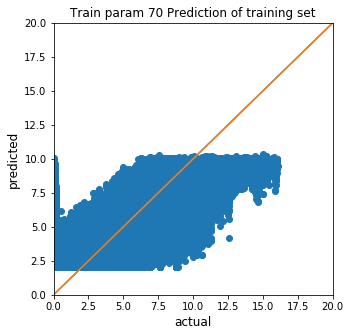

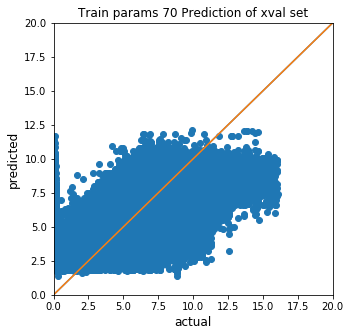

-------------------------------------------------------
Train set 71  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[95]	valid_0's l1: 1.62339	valid_1's l1: 3.54288
Train set 71  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[72]	valid_0's l1: 1.686	valid_1's l1: 3.22807
Train set 71  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[5]	valid_0's l1: 1.75176	valid_1's l1: 2.73245
Train set 71  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2]	valid_0's l1: 1.83071	valid_1's l1: 2.0751
Train set 71  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[89]	valid_0's l1: 1.82731	valid_1's l1: 1.53057
Train set 71  subset 0 fold 5
Training until validation sco

Early stopping, best iteration is:
[118]	valid_0's l1: 1.82802	valid_1's l1: 1.44002
Train set 71  subset 3 fold 5
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[44]	valid_0's l1: 1.83741	valid_1's l1: 1.38932
Train set 71  subset 3 fold 6
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[219]	valid_0's l1: 1.848	valid_1's l1: 1.19372
Train set 71  subset 3 fold 7
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[91]	valid_0's l1: 1.83761	valid_1's l1: 1.35445
Train set 71  subset 3 fold 8
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[37]	valid_0's l1: 1.82342	valid_1's l1: 2.42069
Train set 71  subset 3 fold 9
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[87]	valid_0's l1: 1.82975	valid_1's l1: 1.48428
Train set 71  subset 3 fol

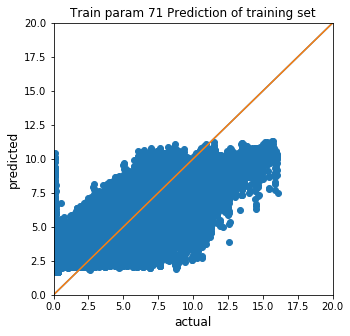

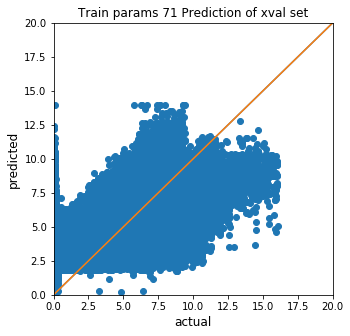

-------------------------------------------------------
Train set 72  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3248]	valid_0's l1: 1.29555	valid_1's l1: 3.70026
Train set 72  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2204]	valid_0's l1: 1.50196	valid_1's l1: 3.3486
Train set 72  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[5563]	valid_0's l1: 1.12402	valid_1's l1: 2.65209
Train set 72  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[5563]	valid_0's l1: 1.17219	valid_1's l1: 1.92696
Train set 72  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4678]	valid_0's l1: 1.28364	valid_1's l1: 1.57142
Train set 72  subset 0 fold 5
Training until 

Early stopping, best iteration is:
[4333]	valid_0's l1: 1.31526	valid_1's l1: 1.86883
Train set 72  subset 3 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3696]	valid_0's l1: 1.40902	valid_1's l1: 1.65817
Train set 72  subset 3 fold 5
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3417]	valid_0's l1: 1.4673	valid_1's l1: 1.35015
Train set 72  subset 3 fold 6
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4064]	valid_0's l1: 1.39407	valid_1's l1: 1.14058
Train set 72  subset 3 fold 7
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[1770]	valid_0's l1: 1.77663	valid_1's l1: 1.35929
Train set 72  subset 3 fold 8
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[1321]	valid_0's l1: 1.90928	valid_1's l1: 1.57217
Train set 72  s

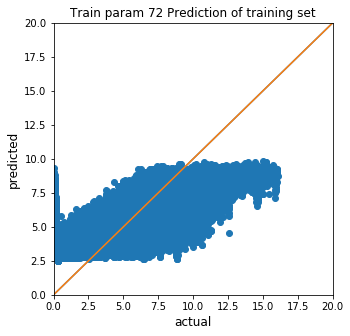

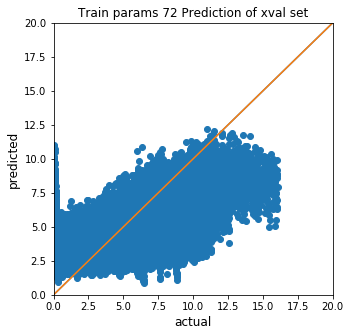

-------------------------------------------------------
Train set 73  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4600]	valid_0's l1: 0.907489	valid_1's l1: 3.54043
Train set 73  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
[10000]	valid_0's l1: 0.50342	valid_1's l1: 3.0626
Early stopping, best iteration is:
[10288]	valid_0's l1: 0.487436	valid_1's l1: 3.06251
Train set 73  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[6847]	valid_0's l1: 0.735472	valid_1's l1: 2.67872
Train set 73  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3973]	valid_0's l1: 1.09196	valid_1's l1: 2.09721
Train set 73  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[5454]	valid_0's l1: 0.92443	valid_1's l

Train set 73  subset 3 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[5583]	valid_0's l1: 0.895102	valid_1's l1: 1.99702
Train set 73  subset 3 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4529]	valid_0's l1: 1.0502	valid_1's l1: 1.5095
Train set 73  subset 3 fold 5
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4487]	valid_0's l1: 1.06044	valid_1's l1: 1.40195
Train set 73  subset 3 fold 6
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4010]	valid_0's l1: 1.13354	valid_1's l1: 1.23572
Train set 73  subset 3 fold 7
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2232]	valid_0's l1: 1.47831	valid_1's l1: 1.31561
Train set 73  subset 3 fold 8
Training until validation scores don't improve for 1000 rounds.
Early s

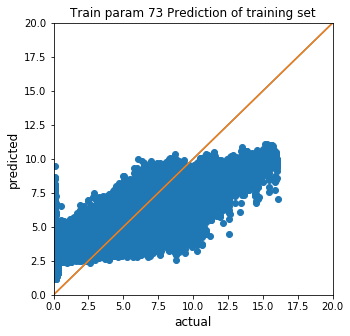

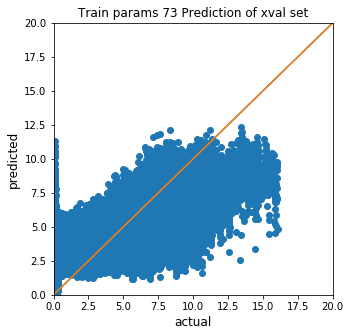

-------------------------------------------------------
Train set 74  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3]	valid_0's l1: 1.65086	valid_1's l1: 3.66911
Train set 74  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[49]	valid_0's l1: 1.65509	valid_1's l1: 3.33641
Train set 74  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[27]	valid_0's l1: 1.72588	valid_1's l1: 2.63499
Train set 74  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[5]	valid_0's l1: 1.80727	valid_1's l1: 1.86151
Train set 74  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[168]	valid_0's l1: 1.82131	valid_1's l1: 1.54044
Train set 74  subset 0 fold 5
Training until validation

Early stopping, best iteration is:
[255]	valid_0's l1: 1.83213	valid_1's l1: 1.51595
Train set 74  subset 3 fold 5
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[7]	valid_0's l1: 1.86642	valid_1's l1: 1.25917
Train set 74  subset 3 fold 6
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[75]	valid_0's l1: 1.85907	valid_1's l1: 1.14273
Train set 74  subset 3 fold 7
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[185]	valid_0's l1: 1.84452	valid_1's l1: 1.37942
Train set 74  subset 3 fold 8
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[75]	valid_0's l1: 1.83189	valid_1's l1: 1.70132
Train set 74  subset 3 fold 9
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[50]	valid_0's l1: 1.82744	valid_1's l1: 1.79941
Train set 74  subset 3 fo

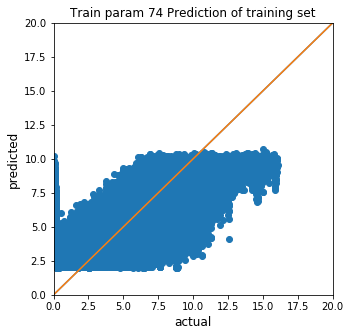

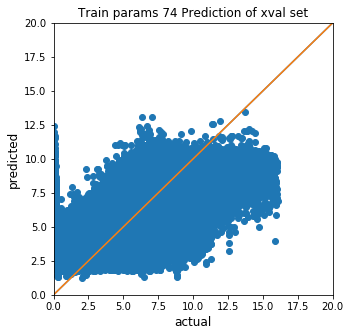

-------------------------------------------------------
Train set 75  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[1234]	valid_0's l1: 1.49319	valid_1's l1: 3.54584
Train set 75  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[138]	valid_0's l1: 1.55498	valid_1's l1: 3.18498
Train set 75  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[210]	valid_0's l1: 1.59382	valid_1's l1: 2.73721
Train set 75  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2]	valid_0's l1: 1.71709	valid_1's l1: 2.09439
Train set 75  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[88]	valid_0's l1: 1.67987	valid_1's l1: 1.54246
Train set 75  subset 0 fold 5
Training until valida

Early stopping, best iteration is:
[195]	valid_0's l1: 1.68136	valid_1's l1: 1.45787
Train set 75  subset 3 fold 5
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[26]	valid_0's l1: 1.69866	valid_1's l1: 1.39353
Train set 75  subset 3 fold 6
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[219]	valid_0's l1: 1.70145	valid_1's l1: 1.21673
Train set 75  subset 3 fold 7
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[93]	valid_0's l1: 1.69373	valid_1's l1: 1.37707
Train set 75  subset 3 fold 8
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[36]	valid_0's l1: 1.68672	valid_1's l1: 2.41926
Train set 75  subset 3 fold 9
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[78]	valid_0's l1: 1.68999	valid_1's l1: 1.46707
Train set 75  subset 3 f

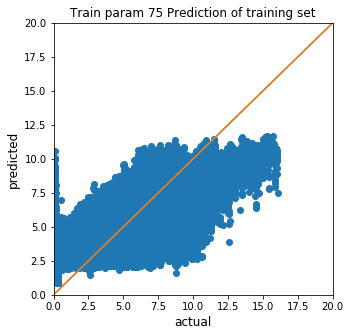

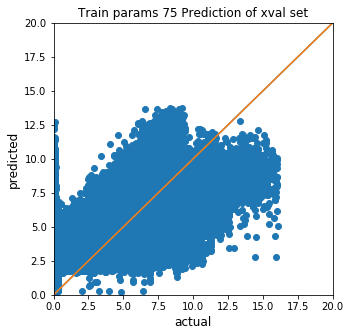

-------------------------------------------------------
Train set 76  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3076]	valid_0's l1: 1.19458	valid_1's l1: 3.70469
Train set 76  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2204]	valid_0's l1: 1.39831	valid_1's l1: 3.35211
Train set 76  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[5101]	valid_0's l1: 1.01023	valid_1's l1: 2.65824
Train set 76  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4351]	valid_0's l1: 1.1429	valid_1's l1: 1.93616
Train set 76  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4205]	valid_0's l1: 1.18205	valid_1's l1: 1.58003
Train set 76  subset 0 fold 5
Training until 

Early stopping, best iteration is:
[4417]	valid_0's l1: 1.15109	valid_1's l1: 1.87563
Train set 76  subset 3 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3498]	valid_0's l1: 1.29069	valid_1's l1: 1.68717
Train set 76  subset 3 fold 5
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3395]	valid_0's l1: 1.32666	valid_1's l1: 1.3686
Train set 76  subset 3 fold 6
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3734]	valid_0's l1: 1.28665	valid_1's l1: 1.16119
Train set 76  subset 3 fold 7
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[1758]	valid_0's l1: 1.68264	valid_1's l1: 1.37498
Train set 76  subset 3 fold 8
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[1252]	valid_0's l1: 1.86214	valid_1's l1: 1.58834
Train set 76  s

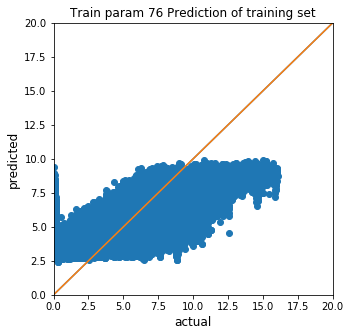

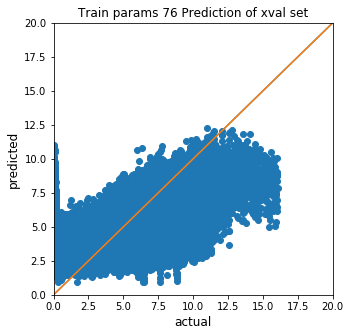

-------------------------------------------------------
Train set 77  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4607]	valid_0's l1: 0.751951	valid_1's l1: 3.54761
Train set 77  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
[10000]	valid_0's l1: 0.346601	valid_1's l1: 3.07157
Early stopping, best iteration is:
[9672]	valid_0's l1: 0.363459	valid_1's l1: 3.07128
Train set 77  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[5694]	valid_0's l1: 0.674782	valid_1's l1: 2.68281
Train set 77  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4136]	valid_0's l1: 0.906342	valid_1's l1: 2.09937
Train set 77  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[5115]	valid_0's l1: 0.788456	valid_1'

Train set 77  subset 3 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[6407]	valid_0's l1: 0.631809	valid_1's l1: 1.98849
Train set 77  subset 3 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4514]	valid_0's l1: 0.878301	valid_1's l1: 1.51451
Train set 77  subset 3 fold 5
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4152]	valid_0's l1: 0.935602	valid_1's l1: 1.41106
Train set 77  subset 3 fold 6
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3819]	valid_0's l1: 0.995708	valid_1's l1: 1.25208
Train set 77  subset 3 fold 7
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2062]	valid_0's l1: 1.40148	valid_1's l1: 1.3214
Train set 77  subset 3 fold 8
Training until validation scores don't improve for 1000 rounds.
Ear

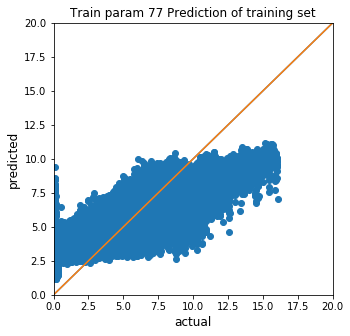

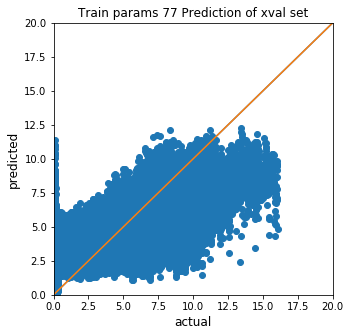

-------------------------------------------------------
Train set 78  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[73]	valid_0's l1: 1.54703	valid_1's l1: 3.67831
Train set 78  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[79]	valid_0's l1: 1.5839	valid_1's l1: 3.34185
Train set 78  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[38]	valid_0's l1: 1.64988	valid_1's l1: 2.63804
Train set 78  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[13]	valid_0's l1: 1.72228	valid_1's l1: 1.87169
Train set 78  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[28]	valid_0's l1: 1.74942	valid_1's l1: 1.53696
Train set 78  subset 0 fold 5
Training until validation

Early stopping, best iteration is:
[255]	valid_0's l1: 1.75418	valid_1's l1: 1.5303
Train set 78  subset 3 fold 5
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[7]	valid_0's l1: 1.79522	valid_1's l1: 1.28553
Train set 78  subset 3 fold 6
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[75]	valid_0's l1: 1.78441	valid_1's l1: 1.15267
Train set 78  subset 3 fold 7
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[185]	valid_0's l1: 1.76705	valid_1's l1: 1.39296
Train set 78  subset 3 fold 8
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[132]	valid_0's l1: 1.75659	valid_1's l1: 1.72305
Train set 78  subset 3 fold 9
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[50]	valid_0's l1: 1.75451	valid_1's l1: 1.79978
Train set 78  subset 3 fo

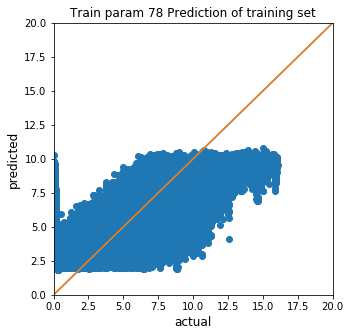

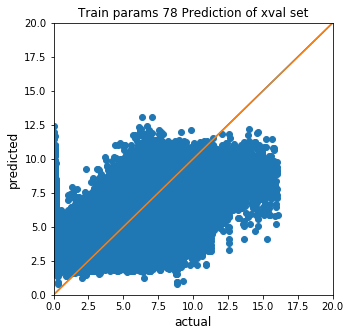

-------------------------------------------------------
Train set 79  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2]	valid_0's l1: 1.50024	valid_1's l1: 3.54483
Train set 79  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[63]	valid_0's l1: 1.47454	valid_1's l1: 3.17018
Train set 79  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[923]	valid_0's l1: 1.51016	valid_1's l1: 2.73825
Train set 79  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[373]	valid_0's l1: 1.55727	valid_1's l1: 2.09303
Train set 79  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[129]	valid_0's l1: 1.59031	valid_1's l1: 1.53894
Train set 79  subset 0 fold 5
Training until validat

Early stopping, best iteration is:
[195]	valid_0's l1: 1.58993	valid_1's l1: 1.47366
Train set 79  subset 3 fold 5
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[44]	valid_0's l1: 1.60638	valid_1's l1: 1.39146
Train set 79  subset 3 fold 6
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[932]	valid_0's l1: 1.60949	valid_1's l1: 1.22733
Train set 79  subset 3 fold 7
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[93]	valid_0's l1: 1.60393	valid_1's l1: 1.38483
Train set 79  subset 3 fold 8
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[36]	valid_0's l1: 1.6001	valid_1's l1: 2.41737
Train set 79  subset 3 fold 9
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[94]	valid_0's l1: 1.60272	valid_1's l1: 1.45895
Train set 79  subset 3 fo

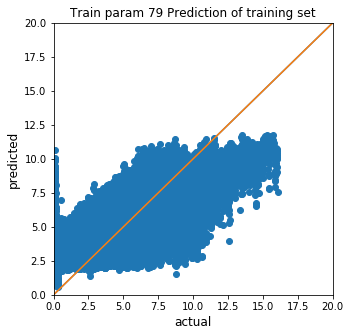

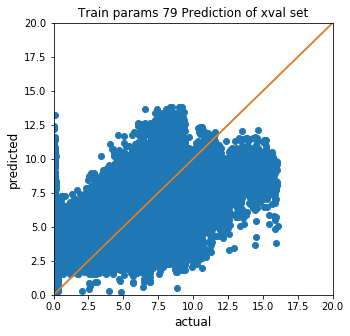

-------------------------------------------------------
Train set 80  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2560]	valid_0's l1: 1.87238	valid_1's l1: 2.12191
Train set 80  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2136]	valid_0's l1: 1.91555	valid_1's l1: 2.08584
Train set 80  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3268]	valid_0's l1: 1.81394	valid_1's l1: 2.15817
Train set 80  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3246]	valid_0's l1: 1.81032	valid_1's l1: 2.19751
Train set 80  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2393]	valid_0's l1: 1.88794	valid_1's l1: 2.06556
Train set 80  subset 0 fold 5
Training until

Early stopping, best iteration is:
[3374]	valid_0's l1: 1.82903	valid_1's l1: 1.96434
Train set 80  subset 2 fold 6
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3332]	valid_0's l1: 1.82471	valid_1's l1: 2.08436
Train set 80  subset 2 fold 7
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3012]	valid_0's l1: 1.84628	valid_1's l1: 2.14424
Train set 80  subset 2 fold 8
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2834]	valid_0's l1: 1.86676	valid_1's l1: 2.06408
Train set 80  subset 2 fold 9
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4149]	valid_0's l1: 1.76438	valid_1's l1: 2.2661
Train set 80  subset 2 fold 10
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[5881]	valid_0's l1: 1.67568	valid_1's l1: 2.04922
Train set 80  

Early stopping, best iteration is:
[2537]	valid_0's l1: 1.87049	valid_1's l1: 2.10376
Train set 80  subset 4 fold 11
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2403]	valid_0's l1: 1.8746	valid_1's l1: 2.28778
Train set 80  subset 4 fold 12
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3567]	valid_0's l1: 1.7875	valid_1's l1: 2.10658
Train set 80  subset 4 fold 13
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[5374]	valid_0's l1: 1.67913	valid_1's l1: 2.08115
Train set 80  subset 4 fold 14
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3412]	valid_0's l1: 1.79696	valid_1's l1: 2.09486
Train set 80  subset 4 fold 15
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3149]	valid_0's l1: 1.81044	valid_1's l1: 2.23311
Train set 8

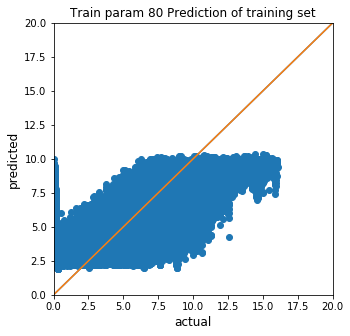

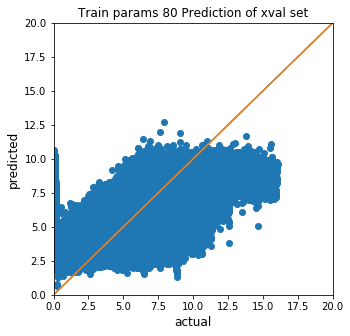

-------------------------------------------------------
Train set 81  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2842]	valid_0's l1: 1.69349	valid_1's l1: 2.1273
Train set 81  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[6598]	valid_0's l1: 1.41696	valid_1's l1: 1.87081
Train set 81  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3998]	valid_0's l1: 1.59218	valid_1's l1: 1.96097
Train set 81  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[5239]	valid_0's l1: 1.49417	valid_1's l1: 2.03293
Train set 81  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3369]	valid_0's l1: 1.6493	valid_1's l1: 1.92311
Train set 81  subset 0 fold 5
Training until v

Early stopping, best iteration is:
[3187]	valid_0's l1: 1.66758	valid_1's l1: 2.06214
Train set 81  subset 2 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2946]	valid_0's l1: 1.69898	valid_1's l1: 1.90685
Train set 81  subset 2 fold 5
Training until validation scores don't improve for 1000 rounds.
[10000]	valid_0's l1: 1.24127	valid_1's l1: 1.77548
Early stopping, best iteration is:
[9930]	valid_0's l1: 1.24489	valid_1's l1: 1.77516
Train set 81  subset 2 fold 6
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[6895]	valid_0's l1: 1.39995	valid_1's l1: 1.9936
Train set 81  subset 2 fold 7
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[8241]	valid_0's l1: 1.32158	valid_1's l1: 2.07295
Train set 81  subset 2 fold 8
Training until validation scores don't improve for 1000 rounds.
[10000]	valid_0's l1: 1.23867	valid_1's l1: 1.940

Train set 81  subset 4 fold 8
Training until validation scores don't improve for 1000 rounds.
[10000]	valid_0's l1: 1.23869	valid_1's l1: 1.87781
Early stopping, best iteration is:
[9231]	valid_0's l1: 1.27772	valid_1's l1: 1.87656
Train set 81  subset 4 fold 9
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[5591]	valid_0's l1: 1.47644	valid_1's l1: 2.03904
Train set 81  subset 4 fold 10
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4323]	valid_0's l1: 1.56133	valid_1's l1: 2.01014
Train set 81  subset 4 fold 11
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2763]	valid_0's l1: 1.69937	valid_1's l1: 2.19625
Train set 81  subset 4 fold 12
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4249]	valid_0's l1: 1.57221	valid_1's l1: 2.03261
Train set 81  subset 4 fold 13
Training until

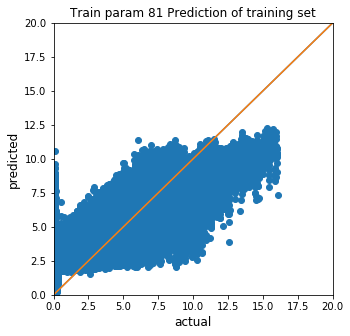

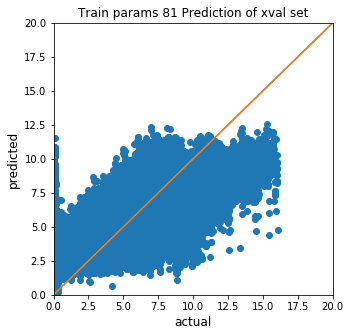

-------------------------------------------------------
Train set 82  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[1]	valid_0's l1: 2.01241	valid_1's l1: 2.11252
Train set 82  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[6]	valid_0's l1: 1.97605	valid_1's l1: 2.08317
Train set 82  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[108]	valid_0's l1: 1.96757	valid_1's l1: 2.13027
Train set 82  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4]	valid_0's l1: 1.97822	valid_1's l1: 2.16159
Train set 82  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[49]	valid_0's l1: 1.96872	valid_1's l1: 2.05644
Train set 82  subset 0 fold 5
Training until validation 

Early stopping, best iteration is:
[6]	valid_0's l1: 1.99501	valid_1's l1: 2.05526
Train set 82  subset 2 fold 7
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[66]	valid_0's l1: 1.97769	valid_1's l1: 2.14421
Train set 82  subset 2 fold 8
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4]	valid_0's l1: 1.99794	valid_1's l1: 2.02861
Train set 82  subset 2 fold 9
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2]	valid_0's l1: 2.00644	valid_1's l1: 2.21253
Train set 82  subset 2 fold 10
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[180]	valid_0's l1: 1.98054	valid_1's l1: 2.08179
Train set 82  subset 2 fold 11
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[5]	valid_0's l1: 1.97303	valid_1's l1: 2.21541
Train set 82  subset 2 fold

Early stopping, best iteration is:
[31]	valid_0's l1: 1.96368	valid_1's l1: 2.07762
Train set 82  subset 4 fold 14
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3]	valid_0's l1: 1.9826	valid_1's l1: 2.05461
Train set 82  subset 4 fold 15
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[10]	valid_0's l1: 1.95864	valid_1's l1: 2.20079
Train set 82  subset 4 fold 16
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[11]	valid_0's l1: 1.96971	valid_1's l1: 2.05655
Train set 82  subset 4 fold 17
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[87]	valid_0's l1: 1.98075	valid_1's l1: 1.80247
Train set 82  subset 4 fold 18
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[83]	valid_0's l1: 1.96152	valid_1's l1: 2.26312
Train set 82  subset 4 

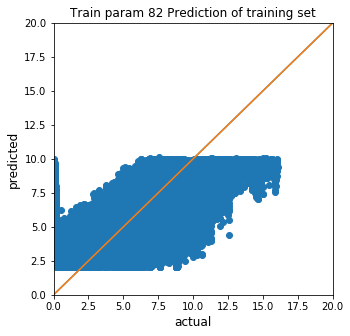

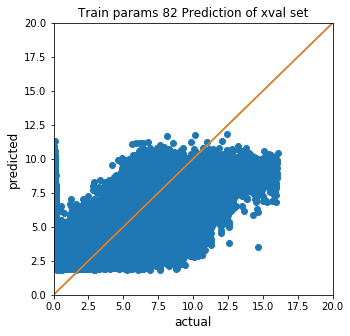

-------------------------------------------------------
Train set 83  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[9]	valid_0's l1: 1.88723	valid_1's l1: 2.09631
Train set 83  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[72]	valid_0's l1: 1.89583	valid_1's l1: 1.94403
Train set 83  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[15]	valid_0's l1: 1.89965	valid_1's l1: 2.00335
Train set 83  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[36]	valid_0's l1: 1.88859	valid_1's l1: 2.09337
Train set 83  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2]	valid_0's l1: 1.92899	valid_1's l1: 1.95162
Train set 83  subset 0 fold 5
Training until validation 

Early stopping, best iteration is:
[16]	valid_0's l1: 1.89453	valid_1's l1: 1.99625
Train set 83  subset 2 fold 7
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[142]	valid_0's l1: 1.88798	valid_1's l1: 2.09478
Train set 83  subset 2 fold 8
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[81]	valid_0's l1: 1.89094	valid_1's l1: 2.01562
Train set 83  subset 2 fold 9
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[23]	valid_0's l1: 1.89369	valid_1's l1: 2.12071
Train set 83  subset 2 fold 10
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[114]	valid_0's l1: 1.88595	valid_1's l1: 2.00259
Train set 83  subset 2 fold 11
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[41]	valid_0's l1: 1.88253	valid_1's l1: 2.1545
Train set 83  subset 2 

Early stopping, best iteration is:
[79]	valid_0's l1: 1.88031	valid_1's l1: 2.04935
Train set 83  subset 4 fold 13
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[66]	valid_0's l1: 1.88977	valid_1's l1: 1.93079
Train set 83  subset 4 fold 14
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[82]	valid_0's l1: 1.88561	valid_1's l1: 1.93269
Train set 83  subset 4 fold 15
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[63]	valid_0's l1: 1.88005	valid_1's l1: 2.07332
Train set 83  subset 4 fold 16
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[86]	valid_0's l1: 1.88764	valid_1's l1: 2.00691
Train set 83  subset 4 fold 17
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[8]	valid_0's l1: 1.90079	valid_1's l1: 1.78797
Train set 83  subset 4

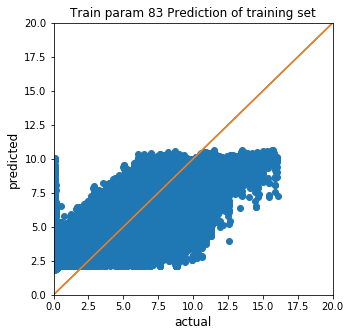

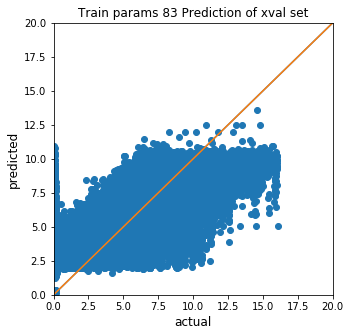

-------------------------------------------------------
Train set 84  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2498]	valid_0's l1: 1.76161	valid_1's l1: 2.13854
Train set 84  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2197]	valid_0's l1: 1.80077	valid_1's l1: 2.10031
Train set 84  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2827]	valid_0's l1: 1.7209	valid_1's l1: 2.16808
Train set 84  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2930]	valid_0's l1: 1.7046	valid_1's l1: 2.20674
Train set 84  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2247]	valid_0's l1: 1.79411	valid_1's l1: 2.07371
Train set 84  subset 0 fold 5
Training until v

Early stopping, best iteration is:
[3396]	valid_0's l1: 1.68652	valid_1's l1: 1.97012
Train set 84  subset 2 fold 6
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2734]	valid_0's l1: 1.74985	valid_1's l1: 2.10043
Train set 84  subset 2 fold 7
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3000]	valid_0's l1: 1.71887	valid_1's l1: 2.14859
Train set 84  subset 2 fold 8
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2722]	valid_0's l1: 1.75732	valid_1's l1: 2.08337
Train set 84  subset 2 fold 9
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4245]	valid_0's l1: 1.59765	valid_1's l1: 2.27808
Train set 84  subset 2 fold 10
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[5404]	valid_0's l1: 1.51348	valid_1's l1: 2.05258
Train set 84 

Train set 84  subset 4 fold 11
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2269]	valid_0's l1: 1.78063	valid_1's l1: 2.29198
Train set 84  subset 4 fold 12
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2982]	valid_0's l1: 1.69882	valid_1's l1: 2.11947
Train set 84  subset 4 fold 13
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4439]	valid_0's l1: 1.56354	valid_1's l1: 2.09197
Train set 84  subset 4 fold 14
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2701]	valid_0's l1: 1.72973	valid_1's l1: 2.11227
Train set 84  subset 4 fold 15
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2758]	valid_0's l1: 1.71763	valid_1's l1: 2.24423
Train set 84  subset 4 fold 16
Training until validation scores don't improve for 1000 rounds.


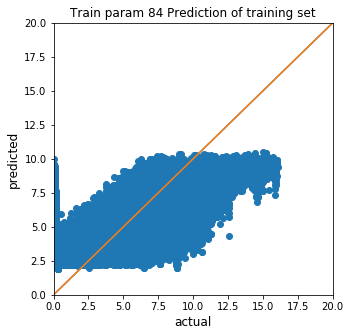

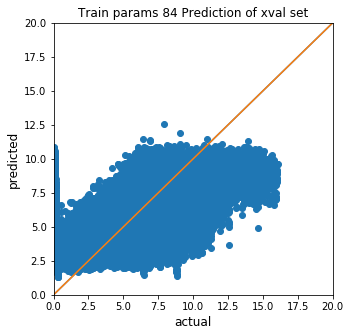

-------------------------------------------------------
Train set 85  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2790]	valid_0's l1: 1.54693	valid_1's l1: 2.12704
Train set 85  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4747]	valid_0's l1: 1.32771	valid_1's l1: 1.86738
Train set 85  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[5202]	valid_0's l1: 1.27957	valid_1's l1: 1.95817
Train set 85  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4646]	valid_0's l1: 1.32844	valid_1's l1: 2.04089
Train set 85  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3467]	valid_0's l1: 1.46266	valid_1's l1: 1.93109
Train set 85  subset 0 fold 5
Training until

Train set 85  subset 2 fold 5
Training until validation scores don't improve for 1000 rounds.
[10000]	valid_0's l1: 0.940766	valid_1's l1: 1.77262
Early stopping, best iteration is:
[9373]	valid_0's l1: 0.979579	valid_1's l1: 1.77155
Train set 85  subset 2 fold 6
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[6271]	valid_0's l1: 1.1917	valid_1's l1: 1.98752
Train set 85  subset 2 fold 7
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[6306]	valid_0's l1: 1.18621	valid_1's l1: 2.07581
Train set 85  subset 2 fold 8
Training until validation scores don't improve for 1000 rounds.
[10000]	valid_0's l1: 0.938314	valid_1's l1: 1.94501
Early stopping, best iteration is:
[9503]	valid_0's l1: 0.968359	valid_1's l1: 1.94385
Train set 85  subset 2 fold 9
Training until validation scores don't improve for 1000 rounds.
[10000]	valid_0's l1: 0.93618	valid_1's l1: 2.05694
Early stopping, best iterat

Train set 85  subset 4 fold 10
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3715]	valid_0's l1: 1.43131	valid_1's l1: 2.01433
Train set 85  subset 4 fold 11
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2764]	valid_0's l1: 1.55019	valid_1's l1: 2.20647
Train set 85  subset 4 fold 12
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4556]	valid_0's l1: 1.34527	valid_1's l1: 2.0264
Train set 85  subset 4 fold 13
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4709]	valid_0's l1: 1.33641	valid_1's l1: 1.89042
Train set 85  subset 4 fold 14
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3735]	valid_0's l1: 1.43285	valid_1's l1: 1.94431
Train set 85  subset 4 fold 15
Training until validation scores don't improve for 1000 rounds.
E

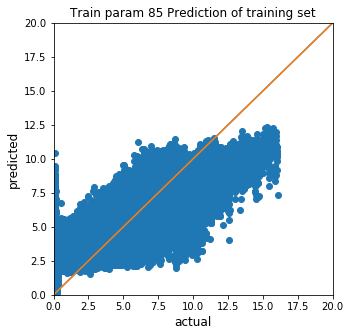

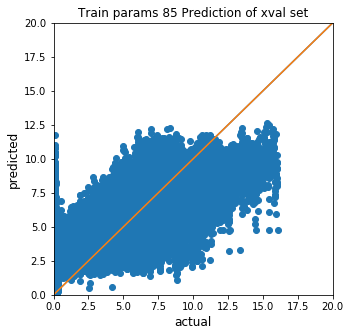

-------------------------------------------------------
Train set 86  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[82]	valid_0's l1: 1.89548	valid_1's l1: 2.12754
Train set 86  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[6]	valid_0's l1: 1.90986	valid_1's l1: 2.05988
Train set 86  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[97]	valid_0's l1: 1.8994	valid_1's l1: 2.15349
Train set 86  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3]	valid_0's l1: 1.92428	valid_1's l1: 2.15194
Train set 86  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[33]	valid_0's l1: 1.89831	valid_1's l1: 2.07766
Train set 86  subset 0 fold 5
Training until validation s

Early stopping, best iteration is:
[6]	valid_0's l1: 1.93982	valid_1's l1: 2.07786
Train set 86  subset 2 fold 7
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[1]	valid_0's l1: 1.99348	valid_1's l1: 2.13444
Train set 86  subset 2 fold 8
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[40]	valid_0's l1: 1.92611	valid_1's l1: 2.03699
Train set 86  subset 2 fold 9
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[50]	valid_0's l1: 1.91765	valid_1's l1: 2.23214
Train set 86  subset 2 fold 10
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[6]	valid_0's l1: 1.9294	valid_1's l1: 2.07068
Train set 86  subset 2 fold 11
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[5]	valid_0's l1: 1.9235	valid_1's l1: 2.23146
Train set 86  subset 2 fold 12

Early stopping, best iteration is:
[31]	valid_0's l1: 1.89753	valid_1's l1: 2.0875
Train set 86  subset 4 fold 14
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[9]	valid_0's l1: 1.90782	valid_1's l1: 2.07039
Train set 86  subset 4 fold 15
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[9]	valid_0's l1: 1.89469	valid_1's l1: 2.18327
Train set 86  subset 4 fold 16
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[9]	valid_0's l1: 1.90799	valid_1's l1: 2.02797
Train set 86  subset 4 fold 17
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[10]	valid_0's l1: 1.92672	valid_1's l1: 1.78594
Train set 86  subset 4 fold 18
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[31]	valid_0's l1: 1.89791	valid_1's l1: 2.27562
Train set 86  subset 4 fo

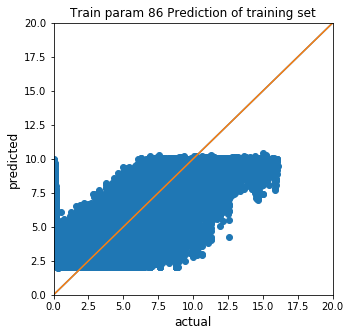

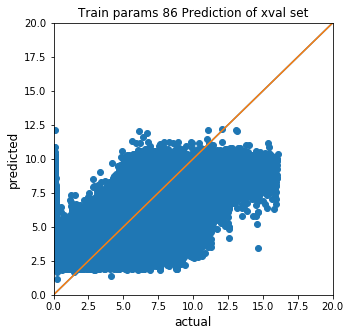

-------------------------------------------------------
Train set 87  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[9]	valid_0's l1: 1.8027	valid_1's l1: 2.07168
Train set 87  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[28]	valid_0's l1: 1.80704	valid_1's l1: 1.92524
Train set 87  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[15]	valid_0's l1: 1.81197	valid_1's l1: 1.99414
Train set 87  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[11]	valid_0's l1: 1.81003	valid_1's l1: 2.0643
Train set 87  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3]	valid_0's l1: 1.85568	valid_1's l1: 1.93062
Train set 87  subset 0 fold 5
Training until validation sc

Early stopping, best iteration is:
[16]	valid_0's l1: 1.81192	valid_1's l1: 2.00736
Train set 87  subset 2 fold 7
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[301]	valid_0's l1: 1.80052	valid_1's l1: 2.09743
Train set 87  subset 2 fold 8
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[53]	valid_0's l1: 1.8067	valid_1's l1: 2.00364
Train set 87  subset 2 fold 9
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[7]	valid_0's l1: 1.82311	valid_1's l1: 2.10196
Train set 87  subset 2 fold 10
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[150]	valid_0's l1: 1.80245	valid_1's l1: 1.98802
Train set 87  subset 2 fold 11
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[41]	valid_0's l1: 1.80008	valid_1's l1: 2.16206
Train set 87  subset 2 f

Early stopping, best iteration is:
[2]	valid_0's l1: 1.83253	valid_1's l1: 2.01396
Train set 87  subset 4 fold 13
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[10]	valid_0's l1: 1.81904	valid_1's l1: 1.91727
Train set 87  subset 4 fold 14
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[81]	valid_0's l1: 1.80281	valid_1's l1: 1.93279
Train set 87  subset 4 fold 15
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[50]	valid_0's l1: 1.79718	valid_1's l1: 2.0634
Train set 87  subset 4 fold 16
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[10]	valid_0's l1: 1.81991	valid_1's l1: 1.97079
Train set 87  subset 4 fold 17
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[13]	valid_0's l1: 1.8198	valid_1's l1: 1.76261
Train set 87  subset 4 f

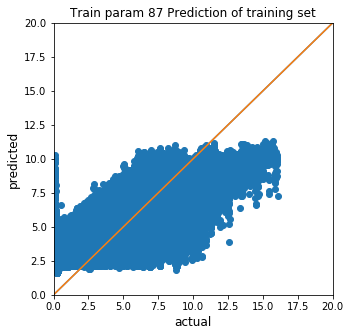

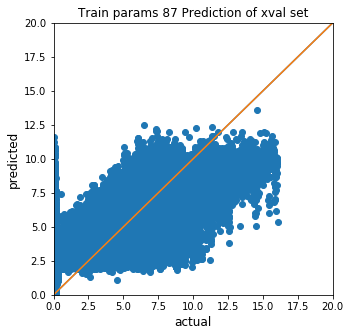

-------------------------------------------------------
Train set 88  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2280]	valid_0's l1: 1.61041	valid_1's l1: 2.16444
Train set 88  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2190]	valid_0's l1: 1.62508	valid_1's l1: 2.11279
Train set 88  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2564]	valid_0's l1: 1.55779	valid_1's l1: 2.18653
Train set 88  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2263]	valid_0's l1: 1.60841	valid_1's l1: 2.21909
Train set 88  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2074]	valid_0's l1: 1.64926	valid_1's l1: 2.08665
Train set 88  subset 0 fold 5
Training until

Early stopping, best iteration is:
[2698]	valid_0's l1: 1.56377	valid_1's l1: 1.98737
Train set 88  subset 2 fold 6
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2700]	valid_0's l1: 1.55521	valid_1's l1: 2.12226
Train set 88  subset 2 fold 7
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2434]	valid_0's l1: 1.60064	valid_1's l1: 2.15412
Train set 88  subset 2 fold 8
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2501]	valid_0's l1: 1.59604	valid_1's l1: 2.10988
Train set 88  subset 2 fold 9
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3524]	valid_0's l1: 1.4304	valid_1's l1: 2.29889
Train set 88  subset 2 fold 10
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3842]	valid_0's l1: 1.39747	valid_1's l1: 2.06035
Train set 88  

Train set 88  subset 4 fold 11
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2083]	valid_0's l1: 1.6406	valid_1's l1: 2.30707
Train set 88  subset 4 fold 12
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2785]	valid_0's l1: 1.51534	valid_1's l1: 2.13574
Train set 88  subset 4 fold 13
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3714]	valid_0's l1: 1.38725	valid_1's l1: 2.10305
Train set 88  subset 4 fold 14
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2720]	valid_0's l1: 1.52672	valid_1's l1: 2.12149
Train set 88  subset 4 fold 15
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2437]	valid_0's l1: 1.57082	valid_1's l1: 2.26463
Train set 88  subset 4 fold 16
Training until validation scores don't improve for 1000 rounds.
E

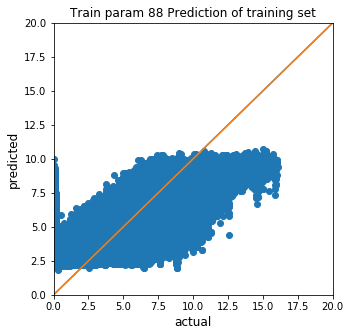

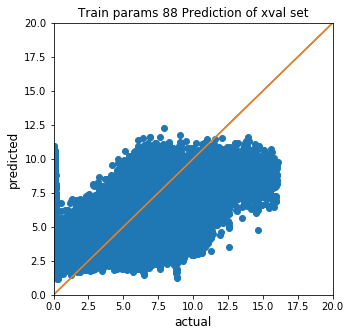

-------------------------------------------------------
Train set 89  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2786]	valid_0's l1: 1.30975	valid_1's l1: 2.12068
Train set 89  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3433]	valid_0's l1: 1.2054	valid_1's l1: 1.86583
Train set 89  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3452]	valid_0's l1: 1.19629	valid_1's l1: 1.96314
Train set 89  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3761]	valid_0's l1: 1.144	valid_1's l1: 2.05489
Train set 89  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3189]	valid_0's l1: 1.23949	valid_1's l1: 1.94592
Train set 89  subset 0 fold 5
Training until va

Train set 89  subset 2 fold 5
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[8343]	valid_0's l1: 0.674675	valid_1's l1: 1.77658
Train set 89  subset 2 fold 6
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4940]	valid_0's l1: 0.989439	valid_1's l1: 1.98879
Train set 89  subset 2 fold 7
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[6174]	valid_0's l1: 0.853024	valid_1's l1: 2.08637
Train set 89  subset 2 fold 8
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[7813]	valid_0's l1: 0.712266	valid_1's l1: 1.94188
Train set 89  subset 2 fold 9
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[6716]	valid_0's l1: 0.806658	valid_1's l1: 2.0517
Train set 89  subset 2 fold 10
Training until validation scores don't improve for 1000 rounds.
E

Early stopping, best iteration is:
[3205]	valid_0's l1: 1.23883	valid_1's l1: 2.03153
Train set 89  subset 4 fold 11
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2605]	valid_0's l1: 1.34933	valid_1's l1: 2.20823
Train set 89  subset 4 fold 12
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3855]	valid_0's l1: 1.13707	valid_1's l1: 2.02583
Train set 89  subset 4 fold 13
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4694]	valid_0's l1: 1.02852	valid_1's l1: 1.88876
Train set 89  subset 4 fold 14
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3330]	valid_0's l1: 1.21935	valid_1's l1: 1.96348
Train set 89  subset 4 fold 15
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[5528]	valid_0's l1: 0.923324	valid_1's l1: 2.05104
Train se

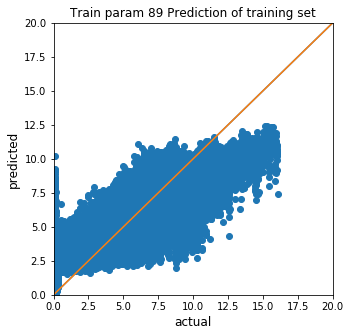

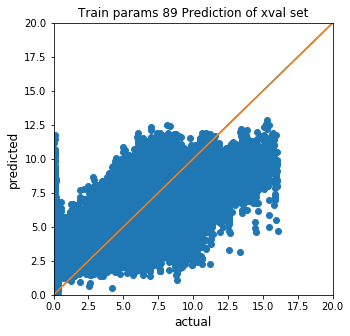

-------------------------------------------------------
Train set 90  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[111]	valid_0's l1: 1.7808	valid_1's l1: 2.13752
Train set 90  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[17]	valid_0's l1: 1.78645	valid_1's l1: 2.09538
Train set 90  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[96]	valid_0's l1: 1.78329	valid_1's l1: 2.16462
Train set 90  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3]	valid_0's l1: 1.82379	valid_1's l1: 2.15807
Train set 90  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[41]	valid_0's l1: 1.78008	valid_1's l1: 2.10135
Train set 90  subset 0 fold 5
Training until validation

Early stopping, best iteration is:
[117]	valid_0's l1: 1.81705	valid_1's l1: 2.10054
Train set 90  subset 2 fold 7
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[70]	valid_0's l1: 1.80594	valid_1's l1: 2.18029
Train set 90  subset 2 fold 8
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[32]	valid_0's l1: 1.81687	valid_1's l1: 2.05624
Train set 90  subset 2 fold 9
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[50]	valid_0's l1: 1.80882	valid_1's l1: 2.25865
Train set 90  subset 2 fold 10
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[99]	valid_0's l1: 1.80936	valid_1's l1: 2.07863
Train set 90  subset 2 fold 11
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[5]	valid_0's l1: 1.82279	valid_1's l1: 2.25315
Train set 90  subset 2 f

Early stopping, best iteration is:
[6]	valid_0's l1: 1.79886	valid_1's l1: 2.08173
Train set 90  subset 4 fold 13
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3]	valid_0's l1: 1.83996	valid_1's l1: 2.08397
Train set 90  subset 4 fold 14
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[28]	valid_0's l1: 1.78851	valid_1's l1: 2.08893
Train set 90  subset 4 fold 15
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[9]	valid_0's l1: 1.78187	valid_1's l1: 2.20179
Train set 90  subset 4 fold 16
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[10]	valid_0's l1: 1.79681	valid_1's l1: 2.00859
Train set 90  subset 4 fold 17
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[100]	valid_0's l1: 1.7996	valid_1's l1: 1.78968
Train set 90  subset 4 f

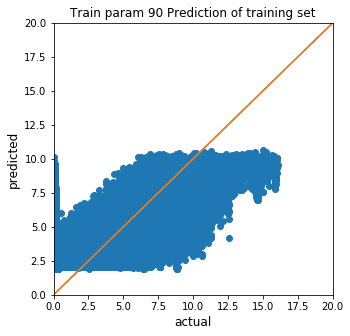

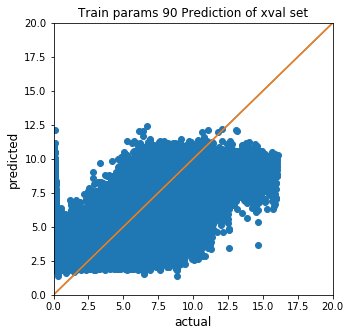

-------------------------------------------------------
Train set 91  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[9]	valid_0's l1: 1.66704	valid_1's l1: 2.06466
Train set 91  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[72]	valid_0's l1: 1.66828	valid_1's l1: 1.91129
Train set 91  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[11]	valid_0's l1: 1.68778	valid_1's l1: 1.98381
Train set 91  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[10]	valid_0's l1: 1.6698	valid_1's l1: 2.05036
Train set 91  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[85]	valid_0's l1: 1.66398	valid_1's l1: 1.95798
Train set 91  subset 0 fold 5
Training until validation 

Train set 91  subset 2 fold 6
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[16]	valid_0's l1: 1.67766	valid_1's l1: 1.98421
Train set 91  subset 2 fold 7
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[178]	valid_0's l1: 1.66223	valid_1's l1: 2.09579
Train set 91  subset 2 fold 8
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[192]	valid_0's l1: 1.66232	valid_1's l1: 1.99929
Train set 91  subset 2 fold 9
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[25]	valid_0's l1: 1.67304	valid_1's l1: 2.08435
Train set 91  subset 2 fold 10
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[171]	valid_0's l1: 1.66467	valid_1's l1: 1.97966
Train set 91  subset 2 fold 11
Training until validation scores don't improve for 1000 rounds.
Early stopp

Early stopping, best iteration is:
[19]	valid_0's l1: 1.67447	valid_1's l1: 1.99942
Train set 91  subset 4 fold 13
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[66]	valid_0's l1: 1.67426	valid_1's l1: 1.90181
Train set 91  subset 4 fold 14
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[70]	valid_0's l1: 1.66926	valid_1's l1: 1.93506
Train set 91  subset 4 fold 15
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[100]	valid_0's l1: 1.66212	valid_1's l1: 2.06456
Train set 91  subset 4 fold 16
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[100]	valid_0's l1: 1.66992	valid_1's l1: 1.95095
Train set 91  subset 4 fold 17
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[21]	valid_0's l1: 1.68035	valid_1's l1: 1.76285
Train set 91  subse

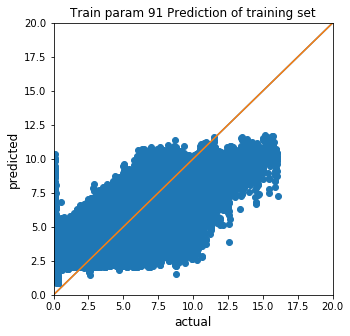

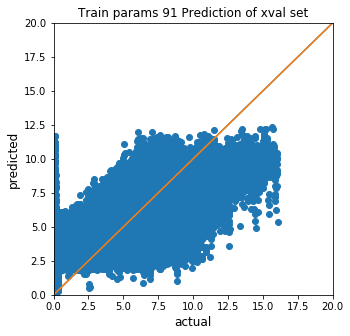

-------------------------------------------------------
Train set 92  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2273]	valid_0's l1: 1.49925	valid_1's l1: 2.1791
Train set 92  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2368]	valid_0's l1: 1.47521	valid_1's l1: 2.11973
Train set 92  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2423]	valid_0's l1: 1.46556	valid_1's l1: 2.19423
Train set 92  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2201]	valid_0's l1: 1.51086	valid_1's l1: 2.22371
Train set 92  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[1946]	valid_0's l1: 1.57508	valid_1's l1: 2.09445
Train set 92  subset 0 fold 5
Training until 

Early stopping, best iteration is:
[2660]	valid_0's l1: 1.44729	valid_1's l1: 1.99326
Train set 92  subset 2 fold 6
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2492]	valid_0's l1: 1.47216	valid_1's l1: 2.13545
Train set 92  subset 2 fold 7
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2423]	valid_0's l1: 1.48852	valid_1's l1: 2.16039
Train set 92  subset 2 fold 8
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2247]	valid_0's l1: 1.53301	valid_1's l1: 2.12278
Train set 92  subset 2 fold 9
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3349]	valid_0's l1: 1.31765	valid_1's l1: 2.30753
Train set 92  subset 2 fold 10
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3358]	valid_0's l1: 1.32293	valid_1's l1: 2.06423
Train set 92 

Train set 92  subset 4 fold 11
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[1933]	valid_0's l1: 1.57457	valid_1's l1: 2.31029
Train set 92  subset 4 fold 12
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3042]	valid_0's l1: 1.34444	valid_1's l1: 2.14464
Train set 92  subset 4 fold 13
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3597]	valid_0's l1: 1.26168	valid_1's l1: 2.11258
Train set 92  subset 4 fold 14
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2611]	valid_0's l1: 1.42484	valid_1's l1: 2.12711
Train set 92  subset 4 fold 15
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2257]	valid_0's l1: 1.49531	valid_1's l1: 2.27668
Train set 92  subset 4 fold 16
Training until validation scores don't improve for 1000 rounds.


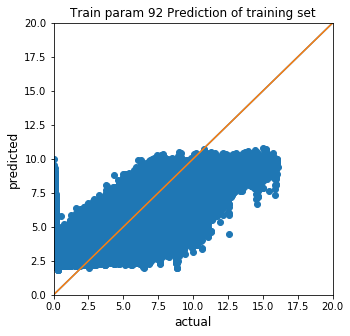

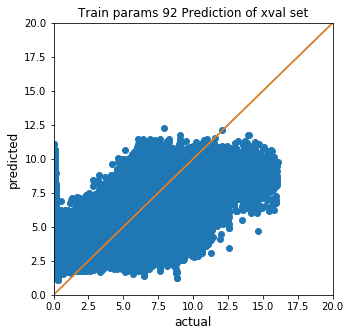

-------------------------------------------------------
Train set 93  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2729]	valid_0's l1: 1.18403	valid_1's l1: 2.11957
Train set 93  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3592]	valid_0's l1: 1.02361	valid_1's l1: 1.86903
Train set 93  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3177]	valid_0's l1: 1.09563	valid_1's l1: 1.97598
Train set 93  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2885]	valid_0's l1: 1.15169	valid_1's l1: 2.06034
Train set 93  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2832]	valid_0's l1: 1.16539	valid_1's l1: 1.9498
Train set 93  subset 0 fold 5
Training until 

Train set 93  subset 2 fold 5
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[6368]	valid_0's l1: 0.662218	valid_1's l1: 1.78198
Train set 93  subset 2 fold 6
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4802]	valid_0's l1: 0.836149	valid_1's l1: 1.9951
Train set 93  subset 2 fold 7
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[5483]	valid_0's l1: 0.749633	valid_1's l1: 2.09171
Train set 93  subset 2 fold 8
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[6753]	valid_0's l1: 0.622337	valid_1's l1: 1.95037
Train set 93  subset 2 fold 9
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[6753]	valid_0's l1: 0.624044	valid_1's l1: 2.04984
Train set 93  subset 2 fold 10
Training until validation scores don't improve for 1000 rounds.
E

Early stopping, best iteration is:
[3729]	valid_0's l1: 0.996627	valid_1's l1: 2.04588
Train set 93  subset 4 fold 11
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2419]	valid_0's l1: 1.26263	valid_1's l1: 2.21335
Train set 93  subset 4 fold 12
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3577]	valid_0's l1: 1.02415	valid_1's l1: 2.02398
Train set 93  subset 4 fold 13
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4764]	valid_0's l1: 0.847435	valid_1's l1: 1.8939
Train set 93  subset 4 fold 14
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3358]	valid_0's l1: 1.06297	valid_1's l1: 1.98067
Train set 93  subset 4 fold 15
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[5263]	valid_0's l1: 0.778956	valid_1's l1: 2.05522
Train s

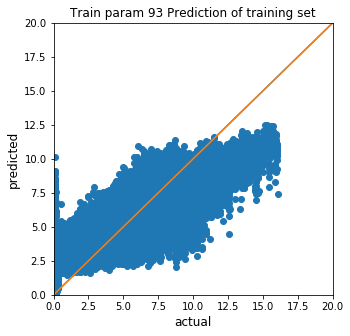

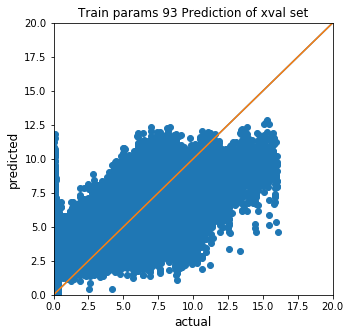

-------------------------------------------------------
Train set 94  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[79]	valid_0's l1: 1.70576	valid_1's l1: 2.15465
Train set 94  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[11]	valid_0's l1: 1.71828	valid_1's l1: 2.09492
Train set 94  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[108]	valid_0's l1: 1.70965	valid_1's l1: 2.17037
Train set 94  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3]	valid_0's l1: 1.76033	valid_1's l1: 2.1693
Train set 94  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[236]	valid_0's l1: 1.70503	valid_1's l1: 2.08943
Train set 94  subset 0 fold 5
Training until validatio

Early stopping, best iteration is:
[117]	valid_0's l1: 1.74434	valid_1's l1: 2.11746
Train set 94  subset 2 fold 7
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[106]	valid_0's l1: 1.73433	valid_1's l1: 2.19117
Train set 94  subset 2 fold 8
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[48]	valid_0's l1: 1.74784	valid_1's l1: 2.03378
Train set 94  subset 2 fold 9
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[83]	valid_0's l1: 1.73714	valid_1's l1: 2.25985
Train set 94  subset 2 fold 10
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[6]	valid_0's l1: 1.76244	valid_1's l1: 2.05894
Train set 94  subset 2 fold 11
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[5]	valid_0's l1: 1.75909	valid_1's l1: 2.2535
Train set 94  subset 2 fo

Early stopping, best iteration is:
[32]	valid_0's l1: 1.70873	valid_1's l1: 2.10102
Train set 94  subset 4 fold 13
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[64]	valid_0's l1: 1.70814	valid_1's l1: 2.10393
Train set 94  subset 4 fold 14
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[6]	valid_0's l1: 1.74103	valid_1's l1: 2.08114
Train set 94  subset 4 fold 15
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[9]	valid_0's l1: 1.70911	valid_1's l1: 2.20022
Train set 94  subset 4 fold 16
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[9]	valid_0's l1: 1.72682	valid_1's l1: 2.01524
Train set 94  subset 4 fold 17
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[10]	valid_0's l1: 1.7444	valid_1's l1: 1.77942
Train set 94  subset 4 fo

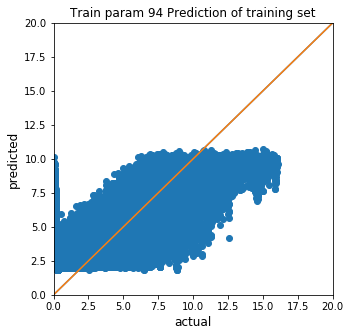

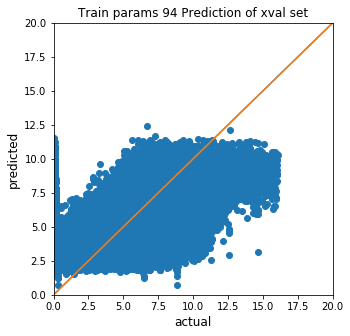

-------------------------------------------------------
Train set 95  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[15]	valid_0's l1: 1.58106	valid_1's l1: 2.06163
Train set 95  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[133]	valid_0's l1: 1.58333	valid_1's l1: 1.90693
Train set 95  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[7]	valid_0's l1: 1.6064	valid_1's l1: 1.97571
Train set 95  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[10]	valid_0's l1: 1.58632	valid_1's l1: 2.0382
Train set 95  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[919]	valid_0's l1: 1.57441	valid_1's l1: 1.95914
Train set 95  subset 0 fold 5
Training until validation

Train set 95  subset 2 fold 6
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[16]	valid_0's l1: 1.59363	valid_1's l1: 1.98497
Train set 95  subset 2 fold 7
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[178]	valid_0's l1: 1.57639	valid_1's l1: 2.08935
Train set 95  subset 2 fold 8
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[294]	valid_0's l1: 1.57563	valid_1's l1: 1.99656
Train set 95  subset 2 fold 9
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[22]	valid_0's l1: 1.59249	valid_1's l1: 2.0845
Train set 95  subset 2 fold 10
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[293]	valid_0's l1: 1.57745	valid_1's l1: 1.97417
Train set 95  subset 2 fold 11
Training until validation scores don't improve for 1000 rounds.
Early stoppi

Early stopping, best iteration is:
[19]	valid_0's l1: 1.58833	valid_1's l1: 1.98458
Train set 95  subset 4 fold 13
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[19]	valid_0's l1: 1.60089	valid_1's l1: 1.89238
Train set 95  subset 4 fold 14
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[7]	valid_0's l1: 1.59982	valid_1's l1: 1.92147
Train set 95  subset 4 fold 15
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[91]	valid_0's l1: 1.57805	valid_1's l1: 2.05568
Train set 95  subset 4 fold 16
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[104]	valid_0's l1: 1.58292	valid_1's l1: 1.94731
Train set 95  subset 4 fold 17
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[27]	valid_0's l1: 1.59563	valid_1's l1: 1.76687
Train set 95  subset 

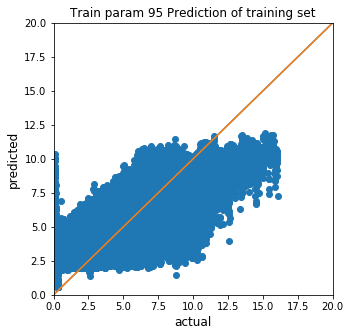

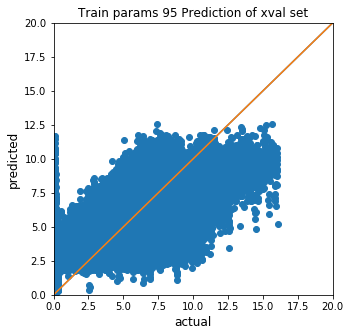

-------------------------------------------------------
Train set 96  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2796]	valid_0's l1: 1.7652	valid_1's l1: 2.13708
Train set 96  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3165]	valid_0's l1: 1.73449	valid_1's l1: 2.08351
Train set 96  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3711]	valid_0's l1: 1.69207	valid_1's l1: 2.10779
Train set 96  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4533]	valid_0's l1: 1.63028	valid_1's l1: 2.09436
Train set 96  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[5778]	valid_0's l1: 1.55983	valid_1's l1: 2.08147
Train set 96  subset 1 fold 0
Training until 

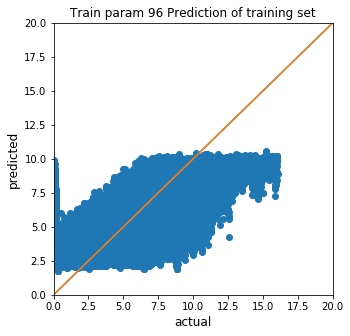

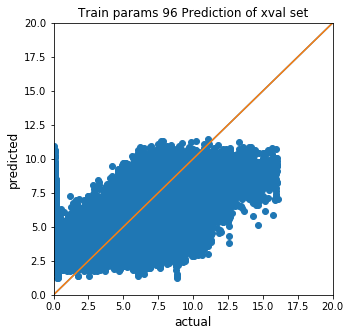

-------------------------------------------------------
Train set 97  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3647]	valid_0's l1: 1.54895	valid_1's l1: 2.01289
Train set 97  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[5199]	valid_0's l1: 1.40663	valid_1's l1: 1.95365
Train set 97  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
[10000]	valid_0's l1: 1.10309	valid_1's l1: 1.97008
Early stopping, best iteration is:
[9750]	valid_0's l1: 1.11695	valid_1's l1: 1.96986
Train set 97  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[6015]	valid_0's l1: 1.34913	valid_1's l1: 1.99252
Train set 97  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4420]	valid_0's l1: 1.48489	valid_1's l1: 

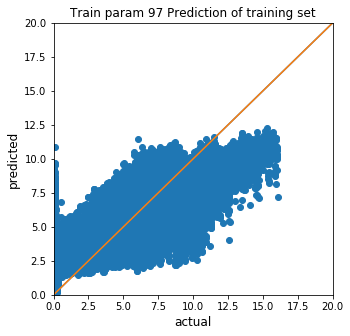

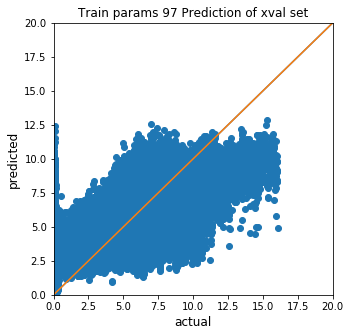

-------------------------------------------------------
Train set 98  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[132]	valid_0's l1: 1.9229	valid_1's l1: 2.13232
Train set 98  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[632]	valid_0's l1: 1.92754	valid_1's l1: 2.07488
Train set 98  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[50]	valid_0's l1: 1.9374	valid_1's l1: 2.08702
Train set 98  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4]	valid_0's l1: 1.96106	valid_1's l1: 2.08825
Train set 98  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[395]	valid_0's l1: 1.95362	valid_1's l1: 2.08206
Train set 98  subset 1 fold 0
Training until validatio

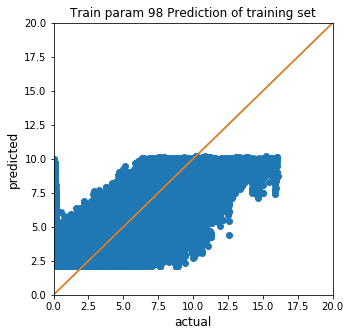

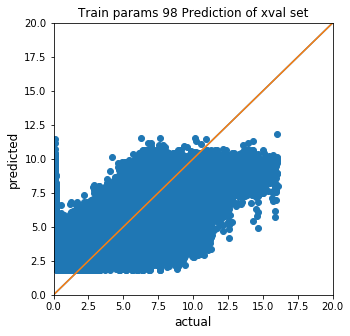

-------------------------------------------------------
Train set 99  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[12]	valid_0's l1: 1.86107	valid_1's l1: 2.05534
Train set 99  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[31]	valid_0's l1: 1.86549	valid_1's l1: 1.99732
Train set 99  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[19]	valid_0's l1: 1.86143	valid_1's l1: 2.03528
Train set 99  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[26]	valid_0's l1: 1.85478	valid_1's l1: 2.03562
Train set 99  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[39]	valid_0's l1: 1.86677	valid_1's l1: 2.04976
Train set 99  subset 1 fold 0
Training until validatio

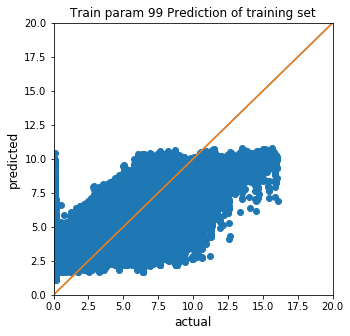

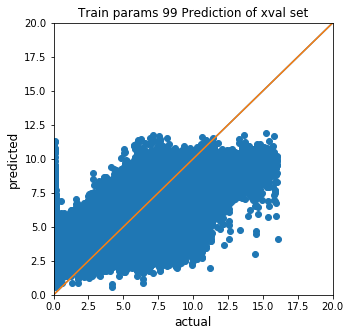

-------------------------------------------------------
Train set 100  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2410]	valid_0's l1: 1.66603	valid_1's l1: 2.14593
Train set 100  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2617]	valid_0's l1: 1.63896	valid_1's l1: 2.09341
Train set 100  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3331]	valid_0's l1: 1.54815	valid_1's l1: 2.11638
Train set 100  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3901]	valid_0's l1: 1.48731	valid_1's l1: 2.09944
Train set 100  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4840]	valid_0's l1: 1.40369	valid_1's l1: 2.08264
Train set 100  subset 1 fold 0
Training

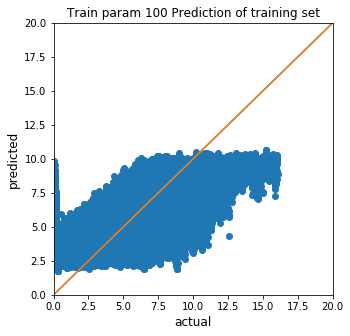

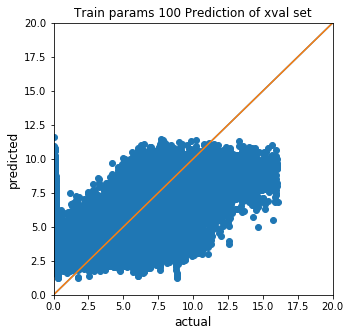

-------------------------------------------------------
Train set 101  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3300]	valid_0's l1: 1.39088	valid_1's l1: 2.01131
Train set 101  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3904]	valid_0's l1: 1.304	valid_1's l1: 1.95937
Train set 101  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[6906]	valid_0's l1: 1.00768	valid_1's l1: 1.96771
Train set 101  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[5425]	valid_0's l1: 1.13552	valid_1's l1: 2.00314
Train set 101  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4333]	valid_0's l1: 1.26038	valid_1's l1: 2.00218
Train set 101  subset 1 fold 0
Training u

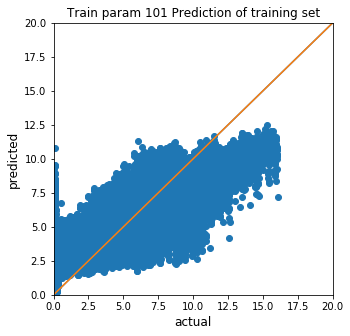

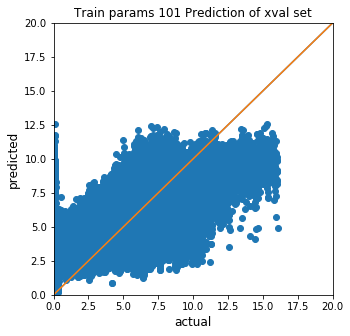

-------------------------------------------------------
Train set 102  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[96]	valid_0's l1: 1.83658	valid_1's l1: 2.13897
Train set 102  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[37]	valid_0's l1: 1.83804	valid_1's l1: 2.08962
Train set 102  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[50]	valid_0's l1: 1.85407	valid_1's l1: 2.0893
Train set 102  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[117]	valid_0's l1: 1.84844	valid_1's l1: 2.08717
Train set 102  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[8]	valid_0's l1: 1.87559	valid_1's l1: 2.0686
Train set 102  subset 1 fold 0
Training until valid

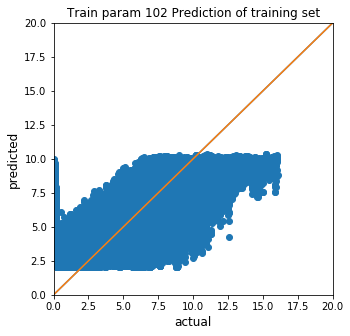

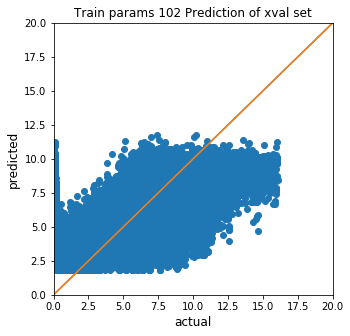

-------------------------------------------------------
Train set 103  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[20]	valid_0's l1: 1.75947	valid_1's l1: 2.03642
Train set 103  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[35]	valid_0's l1: 1.75636	valid_1's l1: 1.989
Train set 103  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[19]	valid_0's l1: 1.76127	valid_1's l1: 2.02156
Train set 103  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[189]	valid_0's l1: 1.74876	valid_1's l1: 2.0405
Train set 103  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[69]	valid_0's l1: 1.76806	valid_1's l1: 2.03771
Train set 103  subset 1 fold 0
Training until valid

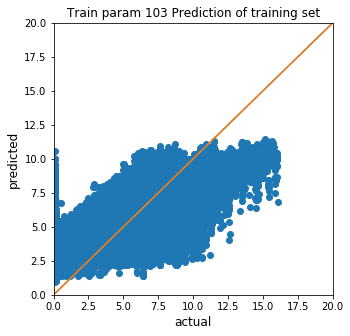

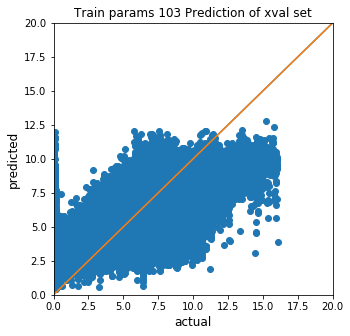

-------------------------------------------------------
Train set 104  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2176]	valid_0's l1: 1.49159	valid_1's l1: 2.16092
Train set 104  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2221]	valid_0's l1: 1.48552	valid_1's l1: 2.11051
Train set 104  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2906]	valid_0's l1: 1.34956	valid_1's l1: 2.1283
Train set 104  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3257]	valid_0's l1: 1.29441	valid_1's l1: 2.11433
Train set 104  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3930]	valid_0's l1: 1.20027	valid_1's l1: 2.08794
Train set 104  subset 1 fold 0
Training 

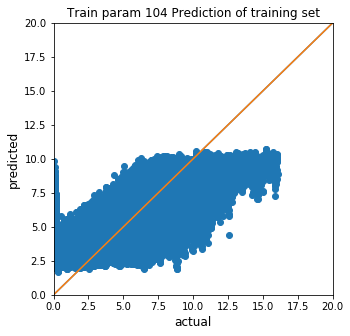

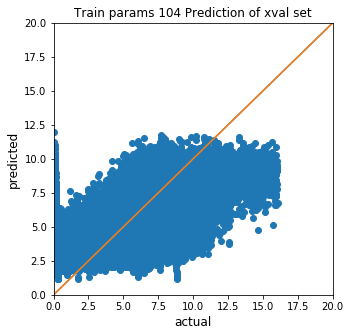

-------------------------------------------------------
Train set 105  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2931]	valid_0's l1: 1.17345	valid_1's l1: 2.01149
Train set 105  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3336]	valid_0's l1: 1.08534	valid_1's l1: 1.96733
Train set 105  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[6505]	valid_0's l1: 0.674685	valid_1's l1: 1.97625
Train set 105  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4694]	valid_0's l1: 0.877486	valid_1's l1: 2.02402
Train set 105  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3809]	valid_0's l1: 1.01417	valid_1's l1: 2.0028
Train set 105  subset 1 fold 0
Trainin

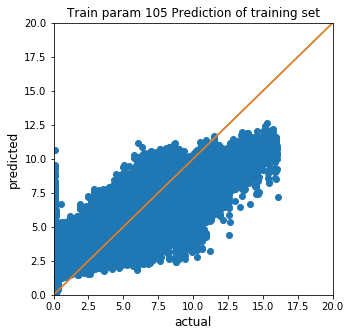

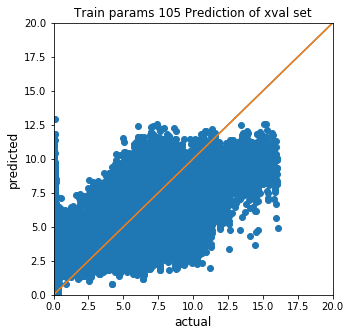

-------------------------------------------------------
Train set 106  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[102]	valid_0's l1: 1.68692	valid_1's l1: 2.15288
Train set 106  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[77]	valid_0's l1: 1.68825	valid_1's l1: 2.10597
Train set 106  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[56]	valid_0's l1: 1.70697	valid_1's l1: 2.0919
Train set 106  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[13]	valid_0's l1: 1.719	valid_1's l1: 2.07071
Train set 106  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[48]	valid_0's l1: 1.72903	valid_1's l1: 2.06883
Train set 106  subset 1 fold 0
Training until valid

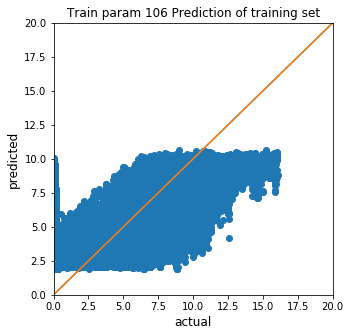

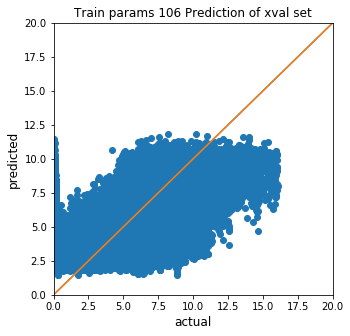

-------------------------------------------------------
Train set 107  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[293]	valid_0's l1: 1.60079	valid_1's l1: 2.03849
Train set 107  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[37]	valid_0's l1: 1.59082	valid_1's l1: 1.97917
Train set 107  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[16]	valid_0's l1: 1.60182	valid_1's l1: 2.00545
Train set 107  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[211]	valid_0's l1: 1.58681	valid_1's l1: 2.04512
Train set 107  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[921]	valid_0's l1: 1.60319	valid_1's l1: 2.02287
Train set 107  subset 1 fold 0
Training until 

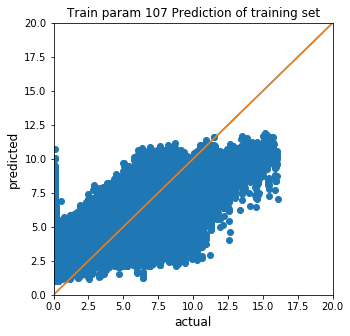

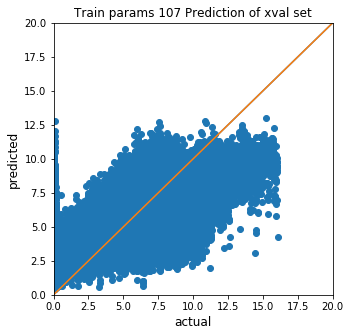

-------------------------------------------------------
Train set 108  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2100]	valid_0's l1: 1.38446	valid_1's l1: 2.16872
Train set 108  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2048]	valid_0's l1: 1.40473	valid_1's l1: 2.12204
Train set 108  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2685]	valid_0's l1: 1.24823	valid_1's l1: 2.13588
Train set 108  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3076]	valid_0's l1: 1.17279	valid_1's l1: 2.12186
Train set 108  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3719]	valid_0's l1: 1.06686	valid_1's l1: 2.09404
Train set 108  subset 1 fold 0
Training

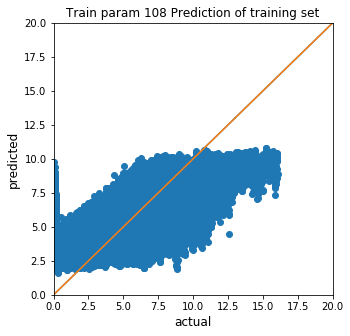

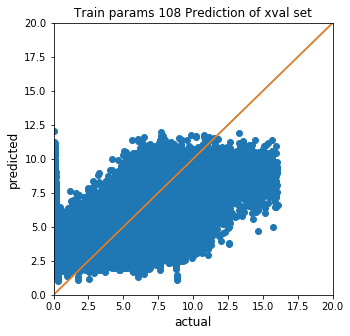

-------------------------------------------------------
Train set 109  subset 0 fold 0
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[2775]	valid_0's l1: 1.05706	valid_1's l1: 2.01134
Train set 109  subset 0 fold 1
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3194]	valid_0's l1: 0.952208	valid_1's l1: 1.97268
Train set 109  subset 0 fold 2
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[5888]	valid_0's l1: 0.559634	valid_1's l1: 1.98015
Train set 109  subset 0 fold 3
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[4298]	valid_0's l1: 0.761464	valid_1's l1: 2.0313
Train set 109  subset 0 fold 4
Training until validation scores don't improve for 1000 rounds.
Early stopping, best iteration is:
[3839]	valid_0's l1: 0.840371	valid_1's l1: 2.00681
Train set 109  subset 1 fold 0
Train

In [ ]:



# Training loop

predictions = np.zeros((len(training_plan),len(scaled_test_X)))

for index, row in training_plan.iterrows():
    
    
    
    tot_subsets = 5
    oof = np.zeros(len(scaled_train_X))
    pred_train = np.zeros(len(scaled_train_X))
    
    for subset in [0,1,2,3,4]:
    
        
    
        #pull out the training set for the subset
        ss_scaled_train_X = scaled_train_X[subset::tot_subsets]
        ss_train_y = train_y[subset::tot_subsets]
        ss_train_exp = train_exp[subset::tot_subsets]
    

    
        if(int(row.n_fold) == 14):
            #Xvalidation taking into account the experiments
            #n_fold = 14
            folds = GroupKFold(int(row.n_fold))
            folds.get_n_splits(ss_scaled_train_X, ss_train_y, ss_train_exp)
            take_into_account_experiment_groups = True

        else:
            #Xvalidation not taking into account the experiments
            #n_fold = 5
            folds = KFold(n_splits=int(row.n_fold), shuffle=True, random_state=42)
            take_into_account_experiment_groups = False

        params = {'num_leaves': int(row.nl),
                 'min_data_in_leaf': 10, 
                 'objective':'regression',
                 'max_depth': -1,
                 'learning_rate': 0.001,
                 "boosting": row.boost_type,
                 #"boosting": "gbdt",
                 "feature_fraction": 0.90,
                 "bagging_freq": 1,
                 "bagging_fraction": 0.90,
                 "bagging_seed": 42,
                 "metric": 'mae',
                 "lambda_l1": 0.1,
                 "verbosity": -1,
                 "random_state": 42,
                 "tree_learner": "data",
                 "num_threads": 5}


        

        
        feature_importance_df = pd.DataFrame()
        if(row.feat_list == "gbdt"):
            if(row.features>0):
                ft=cols[0:int(row.features)].values
            else:
                ft=cols.values
        else:
            if(row.features>0):
                ft=cols2[0:int(row.features)].values
            else:
                ft=cols2.values
                
        training_plan.loc[i,"n_fold"]= n_fold

        #run model

        if(take_into_account_experiment_groups):
            GroupKFold(int(row.n_fold))

        for fold_, (trn_idx, val_idx) in enumerate(folds.split(ss_scaled_train_X,ss_train_y.values,ss_train_exp)):
            #strLog = "fold {}".format(fold_)
            #print(strLog)
            print(f'Train set {index}  subset {subset} fold {fold_}')
            X_tr, X_val = ss_scaled_train_X.iloc[trn_idx], ss_scaled_train_X.iloc[val_idx]
            y_tr, y_val = ss_train_y.iloc[trn_idx], ss_train_y.iloc[val_idx]

            model = lgb.LGBMRegressor(**params, n_estimators = 40000)
            model.fit(X_tr.loc[:,ft], 
                      y_tr, 
                      eval_set=[(X_tr.loc[:,ft], y_tr), (X_val.loc[:,ft], y_val)], 
                      eval_metric='mae',
                      verbose=10000, 
                      early_stopping_rounds=1000)
            (oof[subset::tot_subsets])[val_idx] = model.predict(X_val.loc[:,ft], num_iteration=model.best_iteration_)
            #feature importance
            #fold_importance_df = pd.DataFrame()
            #fold_importance_df["Feature"] = ft
            #fold_importance_df["importance"] = model.feature_importances_[:len(ft)]
            #fold_importance_df["fold"] = fold_ + 1
            #feature_importance_df = pd.concat([feature_importance_df, fold_importance_df], axis=0)
            #predictions in subset and fold
            predictions[index] += model.predict(scaled_test_X.loc[:,ft], num_iteration=model.best_iteration_) / tot_subsets / folds.n_splits
            pred_train += model.predict(scaled_train_X.loc[:,ft], num_iteration=model.best_iteration_) / tot_subsets / folds.n_splits
            #print(feature_importance_df[["Feature", "importance"]]
            #    .groupby("Feature")
            #    .mean()
            #    .sort_values(by="importance", ascending=False)[:200])
            
    print('-------------------------------------------------------')
    
    print(f'Train set {index}')        
    
    training_plan.loc[index,'score_xval'] = mean_absolute_error(train_y.values.flatten(), oof)
    training_plan.loc[index, 'score_train'] = mean_absolute_error(train_y.values.flatten(), pred_train)
    
    print(training_plan.loc[index])
    
    send_txt(f'Train set {index}',str(training_plan.loc[index]))
    
    #save the results
    #create prediction file
    submission.time_to_failure = np.clip(predictions[index],0,100)
    submission.to_csv(name_of_output+'/sub_'+name_of_output+'_'+str(index)+'.csv',index=True)
    training_plan.to_csv(name_of_output+'/training_plan_'+name_of_output+'_'+str(index)+'.csv',index=True)
    
    plt.figure(figsize=(5, 5))
    plt.scatter(train_y.values.flatten(), pred_train)
    #plt.scatter(scaled_train_X['ff3'], y_pred)
    plt.xlim(0, 20)
    plt.ylim(0, 20)
    plt.title(f'Train param {index} Prediction of training set')
    plt.xlabel('actual', fontsize=12)
    plt.ylabel('predicted', fontsize=12)
    plt.plot([(0, 0), (20, 20)], [(0, 0), (20, 20)])
    
    
    
    plt.figure(figsize=(5, 5))
    plt.scatter(train_y.values.flatten(), oof)
    #plt.scatter(scaled_train_X['ff3'], y_pred)
    plt.xlim(0, 20)
    plt.ylim(0, 20)
    plt.title(f'Train params {index} Prediction of xval set')
    plt.xlabel('actual', fontsize=12)
    plt.ylabel('predicted', fontsize=12)
    plt.plot([(0, 0), (20, 20)], [(0, 0), (20, 20)])
    plt.show()
    
    print('-------------------------------------------------------')

In [31]:
#summarize results
training_plan.to_csv(name_of_output+'/training_plan_'+name_of_output+'_'+str(index)+'.csv',index=True)
print(training_plan.sort_values(by='score_xval', ascending=True))
#tt=training_plan
#tt

     n_fold boost_type first_excluded     nl  features feat_list  \
273    20.0       gbdt           True   31.0      60.0      gbdt   
225    20.0       gbdt           True   31.0      50.0      gbdt   
177    20.0       gbdt           True   31.0      30.0      gbdt   
277    20.0       gbdt           True   51.0      60.0      gbdt   
129    20.0       gbdt           True   31.0      20.0      gbdt   
229    20.0       gbdt           True   51.0      50.0      gbdt   
181    20.0       gbdt           True   51.0      30.0      gbdt   
81     20.0       gbdt           True   31.0      15.0      gbdt   
281    20.0       gbdt           True   91.0      60.0      gbdt   
133    20.0       gbdt           True   51.0      20.0      gbdt   
233    20.0       gbdt           True   91.0      50.0      gbdt   
285    20.0       gbdt           True  121.0      60.0      gbdt   
85     20.0       gbdt           True   51.0      15.0      gbdt   
97      5.0       gbdt           True   31.0    

In [32]:
best=training_plan.sort_values(by='score_xval', ascending=True).index[0]
#best=0
best

273

fold 0
    Training until validation scores don't improve for 500 rounds.
    [1000]	training's l1: 1.64898	valid_1's l1: 2.77759
    [2000]	training's l1: 1.13732	valid_1's l1: 2.72256
    [3000]	training's l1: 0.8567	valid_1's l1: 2.7163
    [4000]	training's l1: 0.666359	valid_1's l1: 2.71522
    [5000]	training's l1: 0.525278	valid_1's l1: 2.71462
    [6000]	training's l1: 0.417864	valid_1's l1: 2.714
    Early stopping, best iteration is:
    [5655]	training's l1: 0.451812	valid_1's l1: 2.7138
fold 1
    Training until validation scores don't improve for 500 rounds.
    [1000]	training's l1: 1.70434	valid_1's l1: 2.5627
    Early stopping, best iteration is:
    [854]	training's l1: 1.82213	valid_1's l1: 2.55699
fold 2
    Training until validation scores don't improve for 500 rounds.
    [1000]	training's l1: 1.73008	valid_1's l1: 2.3256
    [2000]	training's l1: 1.20065	valid_1's l1: 2.21257
    [3000]	training's l1: 0.899878	valid_1's l1: 2.2013
    Early stopping, best iteration is:
    [2779]	training's l1: 0.955538	valid_1's l1: 2.20102
fold 3
    Training until validation scores don't improve for 500 rounds.
    [1000]	training's l1: 1.80489	valid_1's l1: 1.93658
    [2000]	training's l1: 1.26416	valid_1's l1: 1.7616
    [3000]	training's l1: 0.952165	valid_1's l1: 1.72614
    [4000]	training's l1: 0.737609	valid_1's l1: 1.71879
    [5000]	training's l1: 0.57961	valid_1's l1: 1.71742
    Early stopping, best iteration is:
    [4754]	training's l1: 0.61437	valid_1's l1: 1.71709
fold 4
    Training until validation scores don't improve for 500 rounds.
    [1000]	training's l1: 1.84036	valid_1's l1: 1.7588
    [2000]	training's l1: 1.30276	valid_1's l1: 1.52842
    [3000]	training's l1: 0.9862	valid_1's l1: 1.46898
    [4000]	training's l1: 0.766117	valid_1's l1: 1.45161
    [5000]	training's l1: 0.602964	valid_1's l1: 1.44691
    [6000]	training's l1: 0.479013	valid_1's l1: 1.44581
    Early stopping, best iteration is:
    [5941]	training's l1: 0.48546	valid_1's l1: 1.44568

Feature                                          
sum_stft_15625.0             2022.799999999999955
    - detects the big crash near the end of each experiment
mean_change_rate             1716.400000000000091
    - predicts how far in each experiment is
    - large values show relative to start
    - small values are more predictive of absolute place in experiment (close to end)
    - shows trajectories and it meanders back and forth as ttf decreases
peak_stft_f2_250000.0prom_2  1684.200000000000045
    - predicts how far in each experiment is - so its relative to the start
    - small values - detects the start of each experiment 
peak_stft_f2_265625.0prom_2  1568.200000000000045
    - predicts how far in each experiment is
peak_stft_f1_250000.0prom_2  1467.000000000000000
    - predicts how far in each experiment is
peak_stft_f2_265625.0prom_3  1445.799999999999955
    - predicts how far in each experiment is
sum_stft_f044921.875         1288.599999999999909
    - large values predict the crash near the end
    - small values predict how far in the experiment
    - take 1/x transform?
sum_stft_f017578.125         1241.400000000000091
    - detects the big crash near the end of each experiment
sum_stft_f1_15625.0          1199.799999999999955
    - no visible trends
sum_stft_f023437.5           1160.200000000000045
    - detects the big crash near the end of each experiment
peak_stft_f1_250000.0prom_3  1139.000000000000000
    - predicts how far in each experiment is
num_peaks_10                 1076.400000000000091
    - predicts how far in each experiment - seems to do a good job early in experiment
sum_stft_f031250.0           1054.799999999999955
sum_stft_f0484375.0          1015.000000000000000
sum_stft_f029296.875          977.799999999999955
max_stft_f1_15625.0           968.799999999999955
    - first max - helps with crash but not with anything else it seems
sum_stft_f0478515.625         914.000000000000000
skew_stft_f021484.375         908.600000000000023
    - not clear what it is doing
sum_stft_f0460937.5           899.799999999999955
peak_stft_f1_234375.0prom_2   889.000000000000000
sum_stft_f0314453.125         887.799999999999955
sum_stft_46875.0              886.799999999999955
max_stft_f2_15625.0           876.000000000000000
sum_stft_f0472656.25          861.000000000000000
peak_stft_f1_265625.0prom_2   855.200000000000045
max_stft_f0474609.375         851.600000000000023
std_stft_f046875.0            848.600000000000023
sum_stft_f021484.375          846.200000000000045
skew_stft_f0195312.5          843.799999999999955
sum_stft_f0453125.0           836.200000000000045

In [ ]:
#create prediction file
submission.time_to_failure = np.clip(predictions[best],0,100)
submission.to_csv(name_of_output+'/sub_best_'+name_of_output+'_'+str(best)+'.csv',index=True)
